# *Extension of Baseline NeRF*
   This notebook examines six different model configurations to evaluate their performance on clean and complex noisy datasets. The models are presented in a non-sequential order, with a focus on comparing key metrics such as PSNR, SSIM, LPIPS, memory usage, and iteration time to provide insights into their relative strengths and weaknesses.

# *Baseline NeRF + MPT + DAE(Complex Noisy Dataset)*

In [ ]:
# Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# ------------------ Combined Higher Gaussian and Salt-and-Pepper Noise ------------------

def add_combined_noise(images, gaussian_std=0.5, sp_ratio=0.3):
    """
    Adds higher Gaussian and salt-and-pepper noise to a batch of images.
    """
    noisy_images = []
    for img in images:
        # Add Gaussian noise
        noise = torch.randn(img.size(), device=img.device) * gaussian_std
        noisy_img = img + noise

        # Add salt-and-pepper noise
        sp_mask = torch.rand(img.size(), device=img.device)
        noisy_img = torch.where(sp_mask < sp_ratio / 2, torch.zeros_like(noisy_img), noisy_img)  # Salt (black)
        noisy_img = torch.where(sp_mask > 1 - sp_ratio / 2, torch.ones_like(noisy_img), noisy_img)  # Pepper (white)

        # Clamp the values to keep them in the range [0, 1]
        noisy_img = torch.clamp(noisy_img, 0, 1)
        noisy_images.append(noisy_img)
    return torch.stack(noisy_images)

# Apply combined noise to the generated images
noisy_target_images = add_combined_noise(target_images, gaussian_std=0.1, sp_ratio=0.05)
print("Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.")

# ------------------ Complex Data Augmentation (Adding Complexity to the Images) ------------------

def add_complexity_to_images(images, target_size=(128, 128)):
    """
    Adds more complex distortions and noise to images to test U-Net's capability.
    Applies background changes, stronger occlusion, motion blur, random rotations, and color shifts.
    """
    complex_images = []

    for img in images:
        # Convert tensor to PIL image
        img_pil = Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))

        # Apply random complex background
        if random.random() > 0.8:
            bg_color = np.random.randint(0, 255, size=(target_size[0], target_size[1], 3), dtype=np.uint8)
            bg_image = Image.fromarray(bg_color)
            img_pil = Image.blend(bg_image, img_pil, alpha=0.7)

        # Apply larger random occlusions (black or white block)
        if random.random() > 0.7:
            occlusion_size = random.randint(40, 100)
            occlusion_x = random.randint(0, target_size[0] - occlusion_size)
            occlusion_y = random.randint(0, target_size[1] - occlusion_size)
            occlusion_type = random.choice([0, 255])  # Black or white
            img_pil.paste(occlusion_type, (occlusion_x, occlusion_y, occlusion_x + occlusion_size, occlusion_y + occlusion_size))

        # Apply random motion blur with larger blur radius
        if random.random() > 0.7:
            blur_radius = random.uniform(3.0, 7.0)
            img_pil = img_pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

        # Apply random brightness, contrast, and color jitter
        if random.random() > 0.8:
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust brightness
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust contrast

            # Apply random color jitter to challenge color robustness
            img_pil = ImageEnhance.Color(img_pil).enhance(random.uniform(0.6, 1.4))

        # Apply random geometric distortion (stretching, shearing, scaling)
        if random.random() > 0.7:
            img_pil = img_pil.transform(target_size, Image.AFFINE, (1.2, 0.3, 0, 0.3, 1.2, 0), resample=Image.BICUBIC)

        # Apply random rotation (rotating between 0 to 360 degrees)
        if random.random() > 0.7:
            angle = random.randint(0, 360)
            img_pil = img_pil.rotate(angle, resample=Image.BICUBIC, expand=True)

        # Resize back to the target size
        img_pil = img_pil.resize(target_size)

        # Convert back to tensor
        complex_img = torch.from_numpy(np.array(img_pil) / 255.0).float().to(device)
        complex_images.append(complex_img)

    return torch.stack(complex_images)

# Apply complexity transformations to the noisy target images
noisy_complex_images = add_complexity_to_images(noisy_target_images)  # Updated to use `noisy_target_images`
noisy_target_images= noisy_complex_images
print("Higher complexity transformations applied to the noisy target images.")

# ------------------ Denoising Autoencoder with Dropout Initialization (Step 2) ------------------

import torch.nn as nn
import torch.optim as optim

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()

        # Encoder: Downsampling layers with dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Downsample by 2 again
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
        )

        # Decoder: Upsampling layers with dropout
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2 again
            nn.Sigmoid()  # Output in [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the Denoising Autoencoder with Dropout
denoiser = DenoisingAutoencoder().to(device)

# Loss function and optimizer for the denoiser
denoiser_criterion = nn.MSELoss()  # Mean Squared Error for denoising
denoiser_optimizer = optim.Adam(denoiser.parameters(), lr=1e-4)  # Optimizer for DAE

# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


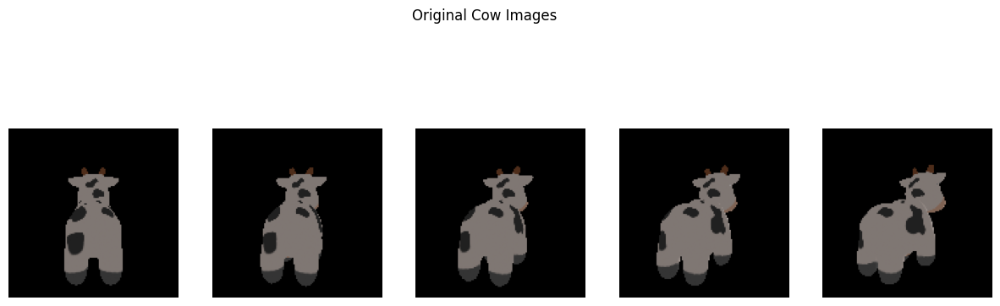

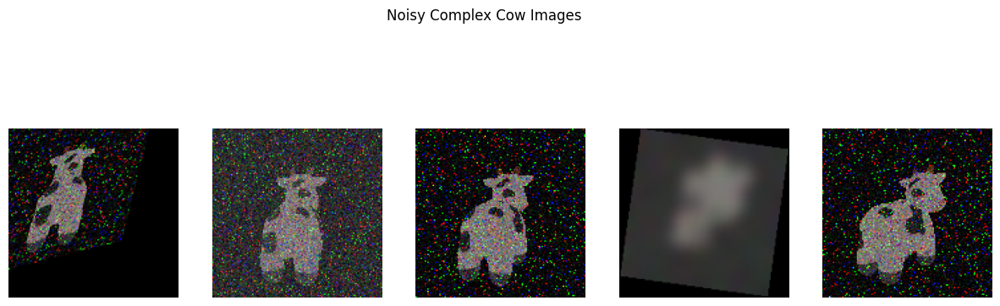

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



# Noisy complex images
plot_images(noisy_target_images, "Noisy Complex Cow Images")


In [ ]:
# Denoised Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed ianside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)

# ------------------ Denoising Integration ------------------

def denoise_rendered_image(rendered_image):
    """
    Applies the Denoising Autoencoder (DAE) to the rendered image.
    Args:
        rendered_image (torch.Tensor): Rendered image (B, H, W, 3) or (H, W, 3)
    Returns:
        denoised_image (torch.Tensor): Denoised version of the rendered image (B, H, W, 3)
    """
    # Check if the batch dimension exists, and add it if necessary
    if rendered_image.dim() == 3:  # If the image is (H, W, 3), add batch dimension
        rendered_image = rendered_image.unsqueeze(0)

    # Prepare the rendered image for denoising: (B, H, W, 3) -> (B, 3, H, W)
    rendered_image_nchw = rendered_image.permute(0, 3, 1, 2)

    # Pass the rendered image through the denoiser
    denoised_image_nchw = denoiser(rendered_image_nchw)

    # Convert back: (B, 3, H, W) -> (B, H, W, 3)
    denoised_image = denoised_image_nchw.permute(0, 2, 3, 1)

    return denoised_image


In [ ]:
# Denoised Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        # Apply denoising to the rendered colors before returning
        denoised_rays_colors = denoise_rendered_image(rays_colors)

        return rays_densities, denoised_rays_colors  # Return denoised colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # Note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def prepare_for_lpips(image):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)
    return 2.0 * image - 1.0

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None, iteration=0
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS every 100 iterations, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Denoising Step
        denoised_image = denoise_rendered_image(rendered_image.unsqueeze(0)).squeeze(0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between denoised and target images
        psnr_value = psnr(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        win_size = min(5, min(target_image.shape[0:2])) if min(target_image.shape[0:2]) >= 5 else 3
        ssim_value = ssim(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=win_size,
            channel_axis=-1
        )

        # Calculate LPIPS only every 100 iterations
        lpips_value = None
        if lpips_model and iteration % 100 == 0:
            rendered_image_lpips = prepare_for_lpips(denoised_image.permute(2, 0, 1).unsqueeze(0))
            target_image_lpips = prepare_for_lpips(target_image.permute(2, 0, 1).unsqueeze(0))
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(denoised_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "denoised rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot and update output
    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    # Print and return tracked metrics
    print(f"Render time: {render_time:.4f}s, Memory: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}" if lpips_value is not None else "")
    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Modify the prepare_for_lpips function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    Resizes to min_size if necessary.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]

    # Resize if height or width is less than min_size
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)

    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)            # Clean images for evaluation
noisy_target_images = noisy_target_images.to(device)  # Noisy images for training and validation
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler('cuda')

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images as input for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]  # Noisy images for training input
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]  # Noisy images for validation input
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []  # New list to store memory usage

batch_size = 6
n_iter = 3000

# Main optimization loop with ERT and AMP
for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Adjust learning rate
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Batch of cameras for training
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast('cuda'):
        # Forward pass through the renderer with ERT applied
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Denoising step applied to the rendered images
        denoised_images = denoise_rendered_image(rendered_images)

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes, silhouettes_at_rays).abs().mean()

        # Use clean target images for comparison
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][batch_idx],  # Clean target images for training evaluation
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()

        # Total optimization loss
        loss = color_err + sil_err

        # Backward pass and optimization step with scaling for AMP
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # PSNR and SSIM Calculations for training (against clean target images)
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Training LPIPS Calculation every 100 iterations
    lpips_train_value = None
    if lpips_model and iteration % 100 == 0:
        # Ensure denoised_images and colors_at_rays are in [B, C, H, W] format for LPIPS
        if denoised_images.dim() == 3:
            denoised_images = denoised_images.unsqueeze(0)  # Add batch dimension if missing
        if colors_at_rays.dim() == 3:
            colors_at_rays = colors_at_rays.unsqueeze(0)  # Add batch dimension if missing

        denoised_images_lpips = prepare_for_lpips(denoised_images.permute(0, 3, 1, 2))
        colors_at_rays_lpips = prepare_for_lpips(colors_at_rays.permute(0, 3, 1, 2))
        lpips_train_value = lpips_model(denoised_images_lpips, colors_at_rays_lpips).mean().item()
        lpips_train_history.append(lpips_train_value)
        print(f"Training LPIPS = {lpips_train_value:.4f} at iteration {iteration}")

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)  # Store memory usage

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB'
        )

    # Validation and visualization every 100 iterations
    if iteration % 100 == 0:
        # Validation metrics
        val_idx = torch.randperm(len(val_cameras))[:batch_size]
        val_batch_cameras = FoVPerspectiveCameras(
            R=val_cameras.R[val_idx],
            T=val_cameras.T[val_idx],
            znear=val_cameras.znear[val_idx],
            zfar=val_cameras.zfar[val_idx],
            aspect_ratio=val_cameras.aspect_ratio[val_idx],
            fov=val_cameras.fov[val_idx],
            device=device
        )

        with torch.no_grad():
            val_images_silhouettes, val_sampled_rays = renderer_mc(
                cameras=val_batch_cameras,
                volumetric_function=neural_radiance_field
            )
            val_rendered_images, val_rendered_silhouettes = val_images_silhouettes.split([3, 1], dim=-1)
            val_denoised_images = denoise_rendered_image(val_rendered_images)
            val_colors_at_rays = sample_images_at_mc_locs(
                target_images[val_indices][val_idx],  # Clean target images for validation evaluation
                val_sampled_rays.xys
            )

            # Calculate validation PSNR and SSIM
            val_psnr = psnr(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0
            )
            val_ssim = ssim(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0,
                win_size=5,
                channel_axis=-1
            )

            # Calculate validation LPIPS
            val_lpips_value = None
            if lpips_model:
                if val_denoised_images.dim() == 3:
                    val_denoised_images = val_denoised_images.unsqueeze(0)  # Add batch dimension if missing
                if val_colors_at_rays.dim() == 3:
                    val_colors_at_rays = val_colors_at_rays.unsqueeze(0)  # Add batch dimension if missing

                val_denoised_images_lpips = prepare_for_lpips(val_denoised_images.permute(0, 3, 1, 2))
                val_colors_at_rays_lpips = prepare_for_lpips(val_colors_at_rays.permute(0, 3, 1, 2))
                val_lpips_value = lpips_model(val_denoised_images_lpips, val_colors_at_rays_lpips).mean().item()
                val_lpips_history.append(val_lpips_value)

        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print validation metrics
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}, LPIPS = {val_lpips_value:.4f} at iteration {iteration}")

        # Visualization for training sample
        show_idx = torch.randperm(len(train_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],  # Clean target image for display
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid,
            lpips_model=lpips_model,
            iteration=iteration  # Pass iteration for LPIPS in show_full_render
        )


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

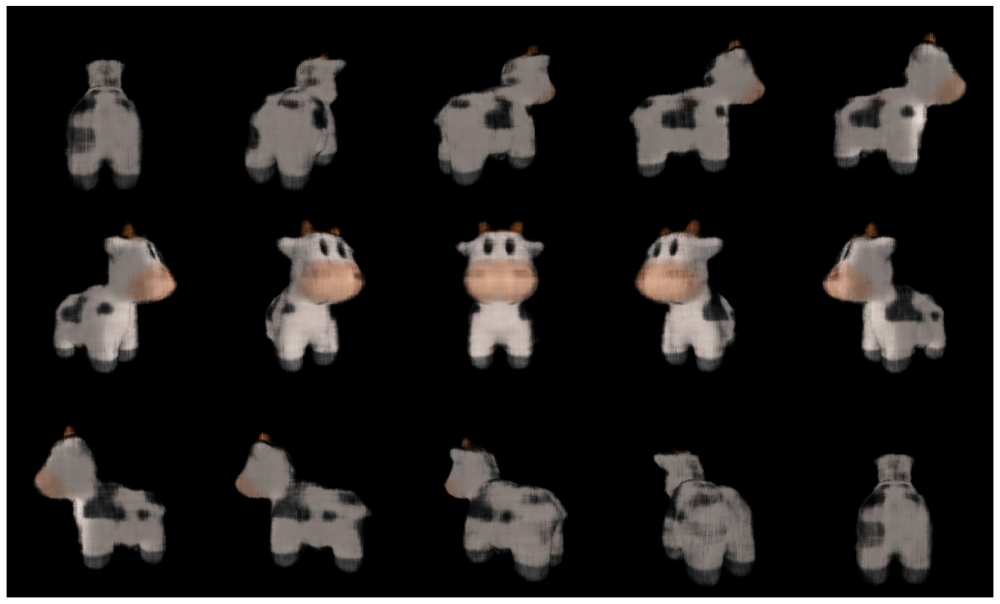

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss      1.06e-02 ± 9.49e-03                          -   
1      Silhouette Loss      1.52e-02 ± 2.60e-02                          -   
2                 PSNR             25.21 ± 2.84               22.87 ± 1.82   
3                 SSIM              0.93 ± 0.10                0.85 ± 0.16   
4                LPIPS          0.0572 ± 0.1091            0.0747 ± 0.1012   
5  Time per iteration           0.05 s ± 0.00 s                          -   
6         Memory Usage     7087.06 MB ± 0.21 MB                          -   

  Best Training Best Validation  
0      3.51e-03               -  
1      3.32e-03               -  
2         30.06           24.45  
3          0.98            0.93  
4        0.0166          0.0360  
5        0.05 s               -  
6    7084.44 MB               -  


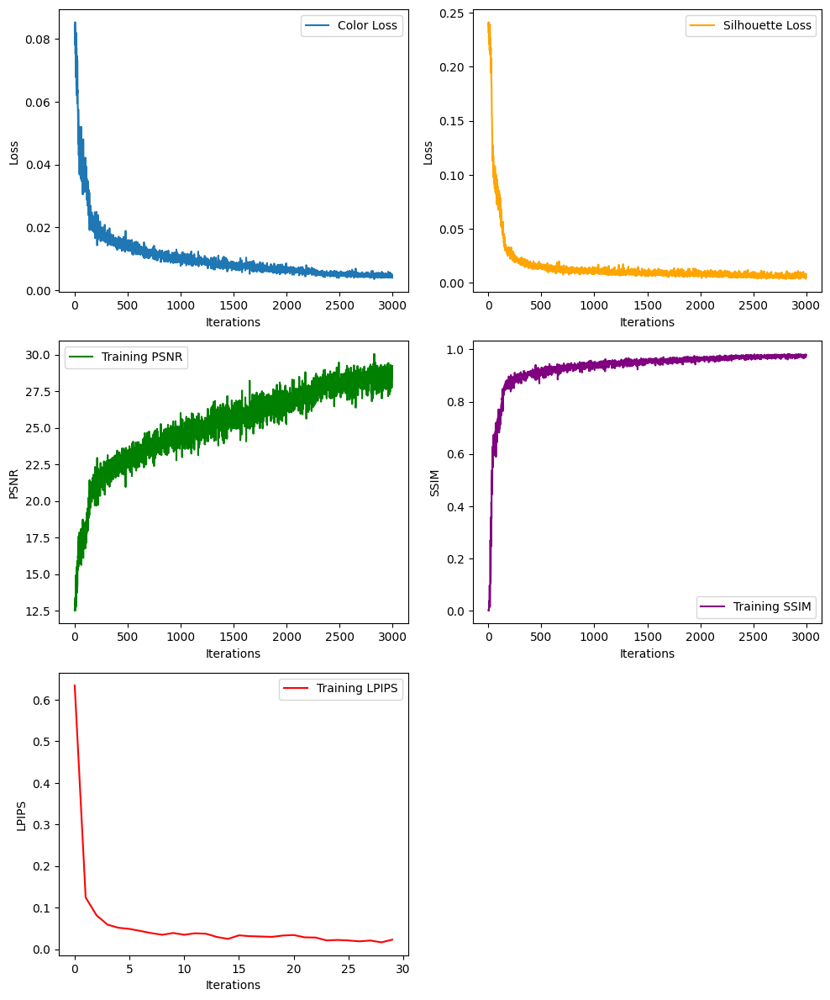

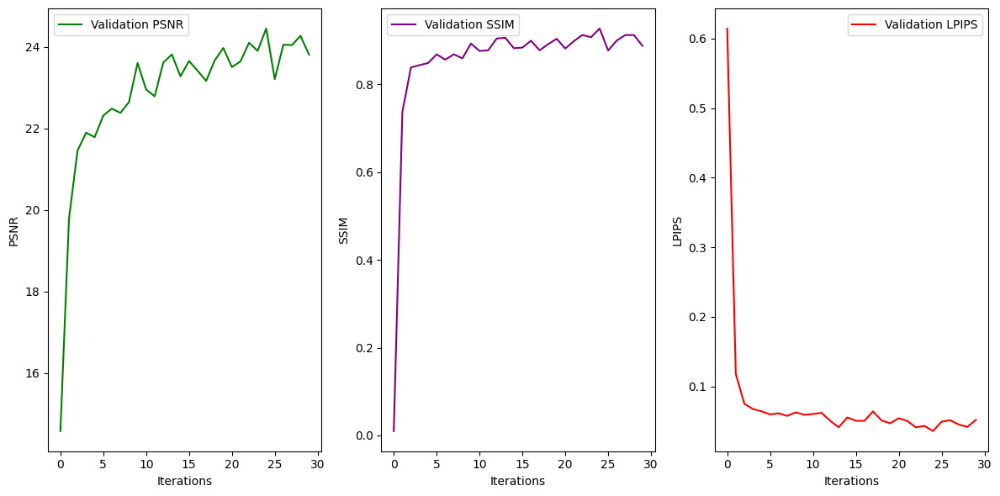

In [ ]:
import matplotlib.pyplot as plt

# Set up figure with multiple subplots for training metrics
fig, axs = plt.subplots(3, 2, figsize=(10, 12))

# Plot Color Loss over Iterations
axs[0, 0].plot(metrics_data['loss_color'], label='Color Loss')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("Loss")
#axs[0, 0].set_title("NeRF + DAE : Color Loss")
axs[0, 0].legend()

# Plot Silhouette Loss over Iterations
axs[0, 1].plot(metrics_data['loss_silhouette'], label='Silhouette Loss', color='orange')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("Loss")
#axs[0, 1].set_title("NeRF + DAE : Silhouette Loss")
axs[0, 1].legend()

# Plot PSNR for Training over Iterations
axs[1, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
#axs[1, 0].set_title("NeRF + DAE : Training PSNR")
axs[1, 0].legend()

# Plot SSIM for Training over Iterations
axs[1, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
#axs[1, 1].set_title("NeRF + DAE : Training SSIM")
axs[1, 1].legend()

# Plot LPIPS for Training over Iterations
axs[2, 0].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[2, 0].set_xlabel("Iterations")
axs[2, 0].set_ylabel("LPIPS")
#axs[2, 0].set_title("NeRF + DAE : Training LPIPS")
axs[2, 0].legend()
axs[2, 1].axis('off')  # Turn off the last unused subplot in the training section

# Adjust layout for training metrics
plt.tight_layout()

# Set up figure for validation metrics in separate plot with reduced width
fig, val_axs = plt.subplots(1, 3, figsize=(12, 6))

# Plot PSNR for Validation over Iterations
val_axs[0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
val_axs[0].set_xlabel("Iterations")
val_axs[0].set_ylabel("PSNR")
#val_axs[0].set_title("NeRF + DAE : Validation PSNR")
val_axs[0].legend()

# Plot SSIM for Validation over Iterations
val_axs[1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
val_axs[1].set_xlabel("Iterations")
val_axs[1].set_ylabel("SSIM")
#val_axs[1].set_title("NeRF + DAE : Validation SSIM")
val_axs[1].legend()

# Plot LPIPS for Validation over Iterations
val_axs[2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
val_axs[2].set_xlabel("Iterations")
val_axs[2].set_ylabel("LPIPS")
#val_axs[2].set_title("NeRF + DAE : Validation LPIPS")
val_axs[2].legend()

# Adjust layout for validation metrics
plt.tight_layout()
plt.show()


# *Baseline NeRF + MP + DAE(Clean Cow Dataset)*

In [ ]:
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')


noisy_target_images= target_images
print("Higher complexity transformations applied to the noisy target images.")

# ------------------ Denoising Autoencoder with Dropout Initialization (Step 2) ------------------

import torch.nn as nn
import torch.optim as optim

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()

        # Encoder: Downsampling layers with dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Downsample by 2 again
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
        )

        # Decoder: Upsampling layers with dropout
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2 again
            nn.Sigmoid()  # Output in [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the Denoising Autoencoder with Dropout
denoiser = DenoisingAutoencoder().to(device)

# Loss function and optimizer for the denoiser
denoiser_criterion = nn.MSELoss()  # Mean Squared Error for denoising
denoiser_optimizer = optim.Adam(denoiser.parameters(), lr=1e-4)  # Optimizer for DAE

# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


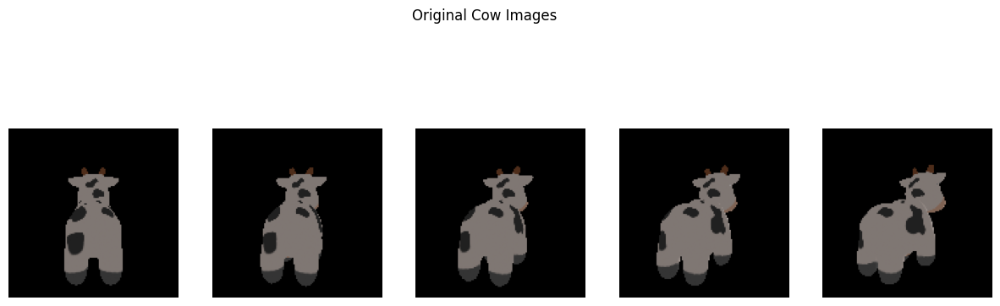

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")




In [ ]:
# Denoised Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed ianside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)

# ------------------ Denoising Integration ------------------

def denoise_rendered_image(rendered_image):
    """
    Applies the Denoising Autoencoder (DAE) to the rendered image.
    Args:
        rendered_image (torch.Tensor): Rendered image (B, H, W, 3) or (H, W, 3)
    Returns:
        denoised_image (torch.Tensor): Denoised version of the rendered image (B, H, W, 3)
    """
    # Check if the batch dimension exists, and add it if necessary
    if rendered_image.dim() == 3:  # If the image is (H, W, 3), add batch dimension
        rendered_image = rendered_image.unsqueeze(0)

    # Prepare the rendered image for denoising: (B, H, W, 3) -> (B, 3, H, W)
    rendered_image_nchw = rendered_image.permute(0, 3, 1, 2)

    # Pass the rendered image through the denoiser
    denoised_image_nchw = denoiser(rendered_image_nchw)

    # Convert back: (B, 3, H, W) -> (B, H, W, 3)
    denoised_image = denoised_image_nchw.permute(0, 2, 3, 1)

    return denoised_image


In [ ]:
# Denoised Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        # Apply denoising to the rendered colors before returning
        denoised_rays_colors = denoise_rendered_image(rays_colors)

        return rays_densities, denoised_rays_colors  # Return denoised colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # Note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def prepare_for_lpips(image):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)
    return 2.0 * image - 1.0

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None, iteration=0
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS every 100 iterations, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Denoising Step
        denoised_image = denoise_rendered_image(rendered_image.unsqueeze(0)).squeeze(0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between denoised and target images
        psnr_value = psnr(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        win_size = min(5, min(target_image.shape[0:2])) if min(target_image.shape[0:2]) >= 5 else 3
        ssim_value = ssim(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=win_size,
            channel_axis=-1
        )

        # Calculate LPIPS only every 100 iterations
        lpips_value = None
        if lpips_model and iteration % 100 == 0:
            rendered_image_lpips = prepare_for_lpips(denoised_image.permute(2, 0, 1).unsqueeze(0))
            target_image_lpips = prepare_for_lpips(target_image.permute(2, 0, 1).unsqueeze(0))
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(denoised_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "denoised rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot and update output
    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    # Print and return tracked metrics
    print(f"Render time: {render_time:.4f}s, Memory: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}" if lpips_value is not None else "")
    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Modify the prepare_for_lpips function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    Resizes to min_size if necessary.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]

    # Resize if height or width is less than min_size
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)

    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)            # Clean images for evaluation
noisy_target_images = noisy_target_images.to(device)  # Noisy images for training and validation
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler('cuda')

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images as input for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]  # Noisy images for training input
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]  # Noisy images for validation input
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []  # New list to store memory usage

batch_size = 6
n_iter = 3000

# Main optimization loop with ERT and AMP
for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Adjust learning rate
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Batch of cameras for training
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast('cuda'):
        # Forward pass through the renderer with ERT applied
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Denoising step applied to the rendered images
        denoised_images = denoise_rendered_image(rendered_images)

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes, silhouettes_at_rays).abs().mean()

        # Use clean target images for comparison
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][batch_idx],  # Clean target images for training evaluation
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()

        # Total optimization loss
        loss = color_err + sil_err

        # Backward pass and optimization step with scaling for AMP
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # PSNR and SSIM Calculations for training (against clean target images)
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Training LPIPS Calculation every 100 iterations
    lpips_train_value = None
    if lpips_model and iteration % 100 == 0:
        # Ensure denoised_images and colors_at_rays are in [B, C, H, W] format for LPIPS
        if denoised_images.dim() == 3:
            denoised_images = denoised_images.unsqueeze(0)  # Add batch dimension if missing
        if colors_at_rays.dim() == 3:
            colors_at_rays = colors_at_rays.unsqueeze(0)  # Add batch dimension if missing

        denoised_images_lpips = prepare_for_lpips(denoised_images.permute(0, 3, 1, 2))
        colors_at_rays_lpips = prepare_for_lpips(colors_at_rays.permute(0, 3, 1, 2))
        lpips_train_value = lpips_model(denoised_images_lpips, colors_at_rays_lpips).mean().item()
        lpips_train_history.append(lpips_train_value)
        print(f"Training LPIPS = {lpips_train_value:.4f} at iteration {iteration}")

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)  # Store memory usage

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB'
        )

    # Validation and visualization every 100 iterations
    if iteration % 100 == 0:
        # Validation metrics
        val_idx = torch.randperm(len(val_cameras))[:batch_size]
        val_batch_cameras = FoVPerspectiveCameras(
            R=val_cameras.R[val_idx],
            T=val_cameras.T[val_idx],
            znear=val_cameras.znear[val_idx],
            zfar=val_cameras.zfar[val_idx],
            aspect_ratio=val_cameras.aspect_ratio[val_idx],
            fov=val_cameras.fov[val_idx],
            device=device
        )

        with torch.no_grad():
            val_images_silhouettes, val_sampled_rays = renderer_mc(
                cameras=val_batch_cameras,
                volumetric_function=neural_radiance_field
            )
            val_rendered_images, val_rendered_silhouettes = val_images_silhouettes.split([3, 1], dim=-1)
            val_denoised_images = denoise_rendered_image(val_rendered_images)
            val_colors_at_rays = sample_images_at_mc_locs(
                target_images[val_indices][val_idx],  # Clean target images for validation evaluation
                val_sampled_rays.xys
            )

            # Calculate validation PSNR and SSIM
            val_psnr = psnr(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0
            )
            val_ssim = ssim(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0,
                win_size=5,
                channel_axis=-1
            )

            # Calculate validation LPIPS
            val_lpips_value = None
            if lpips_model:
                if val_denoised_images.dim() == 3:
                    val_denoised_images = val_denoised_images.unsqueeze(0)  # Add batch dimension if missing
                if val_colors_at_rays.dim() == 3:
                    val_colors_at_rays = val_colors_at_rays.unsqueeze(0)  # Add batch dimension if missing

                val_denoised_images_lpips = prepare_for_lpips(val_denoised_images.permute(0, 3, 1, 2))
                val_colors_at_rays_lpips = prepare_for_lpips(val_colors_at_rays.permute(0, 3, 1, 2))
                val_lpips_value = lpips_model(val_denoised_images_lpips, val_colors_at_rays_lpips).mean().item()
                val_lpips_history.append(val_lpips_value)

        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print validation metrics
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}, LPIPS = {val_lpips_value:.4f} at iteration {iteration}")

        # Visualization for training sample
        show_idx = torch.randperm(len(train_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],  # Clean target image for display
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid,
            lpips_model=lpips_model,
            iteration=iteration  # Pass iteration for LPIPS in show_full_render
        )


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

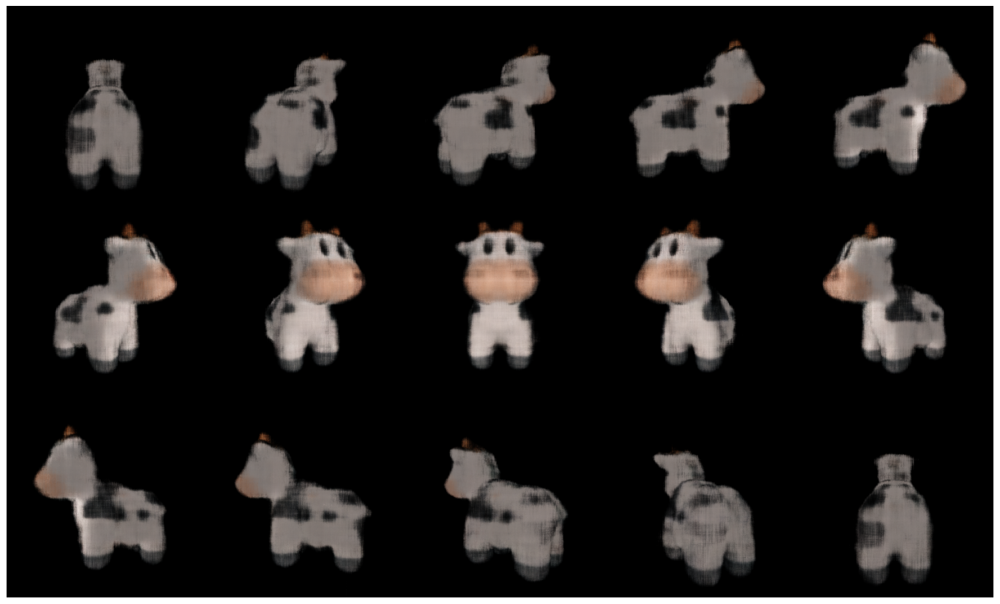

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss      1.06e-02 ± 9.50e-03                          -   
1      Silhouette Loss      1.52e-02 ± 2.60e-02                          -   
2                 PSNR             25.21 ± 2.84               22.89 ± 1.83   
3                 SSIM              0.93 ± 0.10                0.85 ± 0.16   
4                LPIPS          0.0568 ± 0.1092            0.0743 ± 0.1013   
5  Time per iteration           0.05 s ± 0.00 s                          -   
6         Memory Usage     7025.10 MB ± 0.21 MB                          -   

  Best Training Best Validation  
0      3.45e-03               -  
1      3.37e-03               -  
2         30.17           24.44  
3          0.98            0.93  
4        0.0157          0.0359  
5        0.05 s               -  
6    7024.90 MB               -  


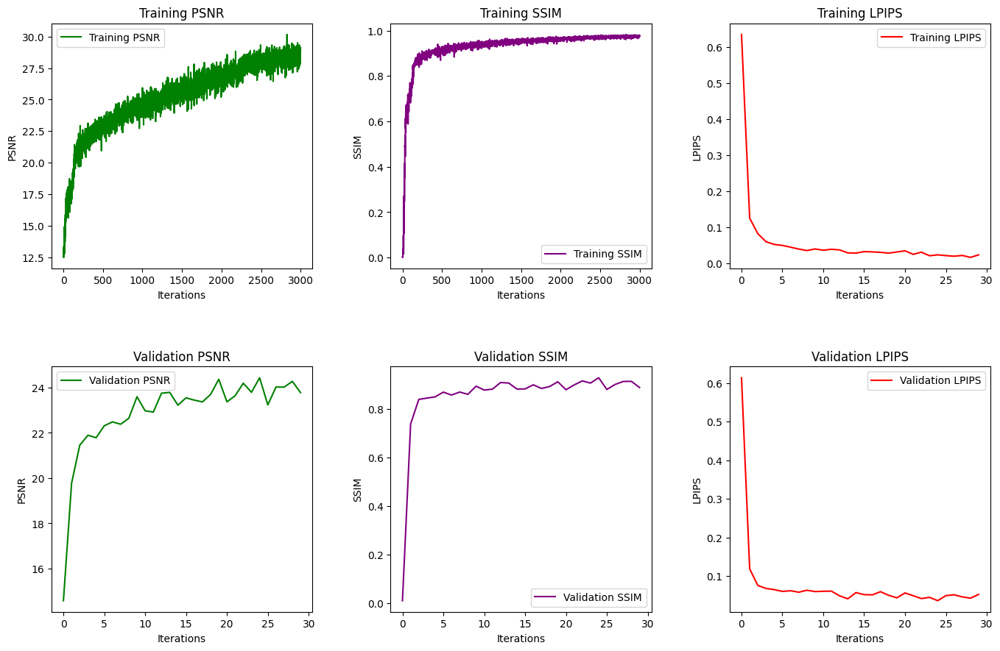

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# *Baseline NeRF + MPT + DAE + MVC(Complex Noisy Cow Dataset)*

In [ ]:
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# ------------------ Combined Higher Gaussian and Salt-and-Pepper Noise ------------------

def add_combined_noise(images, gaussian_std=0.5, sp_ratio=0.3):
    """
    Adds higher Gaussian and salt-and-pepper noise to a batch of images.
    """
    noisy_images = []
    for img in images:
        # Add Gaussian noise
        noise = torch.randn(img.size(), device=img.device) * gaussian_std
        noisy_img = img + noise

        # Add salt-and-pepper noise
        sp_mask = torch.rand(img.size(), device=img.device)
        noisy_img = torch.where(sp_mask < sp_ratio / 2, torch.zeros_like(noisy_img), noisy_img)  # Salt (black)
        noisy_img = torch.where(sp_mask > 1 - sp_ratio / 2, torch.ones_like(noisy_img), noisy_img)  # Pepper (white)

        # Clamp the values to keep them in the range [0, 1]
        noisy_img = torch.clamp(noisy_img, 0, 1)
        noisy_images.append(noisy_img)
    return torch.stack(noisy_images)

# Apply combined noise to the generated images
noisy_target_images = add_combined_noise(target_images, gaussian_std=0.1, sp_ratio=0.05)
print("Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.")

# ------------------ Complex Data Augmentation (Adding Complexity to the Images) ------------------

def add_complexity_to_images(images, target_size=(128, 128)):
    """
    Adds more complex distortions and noise to images to test U-Net's capability.
    Applies background changes, stronger occlusion, motion blur, random rotations, and color shifts.
    """
    complex_images = []

    for img in images:
        # Convert tensor to PIL image
        img_pil = Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))

        # Apply random complex background
        if random.random() > 0.8:
            bg_color = np.random.randint(0, 255, size=(target_size[0], target_size[1], 3), dtype=np.uint8)
            bg_image = Image.fromarray(bg_color)
            img_pil = Image.blend(bg_image, img_pil, alpha=0.7)

        # Apply larger random occlusions (black or white block)
        if random.random() > 0.7:
            occlusion_size = random.randint(40, 100)
            occlusion_x = random.randint(0, target_size[0] - occlusion_size)
            occlusion_y = random.randint(0, target_size[1] - occlusion_size)
            occlusion_type = random.choice([0, 255])  # Black or white
            img_pil.paste(occlusion_type, (occlusion_x, occlusion_y, occlusion_x + occlusion_size, occlusion_y + occlusion_size))

        # Apply random motion blur with larger blur radius
        if random.random() > 0.7:
            blur_radius = random.uniform(3.0, 7.0)
            img_pil = img_pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

        # Apply random brightness, contrast, and color jitter
        if random.random() > 0.8:
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust brightness
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust contrast

            # Apply random color jitter to challenge color robustness
            img_pil = ImageEnhance.Color(img_pil).enhance(random.uniform(0.6, 1.4))

        # Apply random geometric distortion (stretching, shearing, scaling)
        if random.random() > 0.7:
            img_pil = img_pil.transform(target_size, Image.AFFINE, (1.2, 0.3, 0, 0.3, 1.2, 0), resample=Image.BICUBIC)

        # Apply random rotation (rotating between 0 to 360 degrees)
        if random.random() > 0.7:
            angle = random.randint(0, 360)
            img_pil = img_pil.rotate(angle, resample=Image.BICUBIC, expand=True)

        # Resize back to the target size
        img_pil = img_pil.resize(target_size)

        # Convert back to tensor
        complex_img = torch.from_numpy(np.array(img_pil) / 255.0).float().to(device)
        complex_images.append(complex_img)

    return torch.stack(complex_images)

# Apply complexity transformations to the noisy target images
noisy_complex_images = add_complexity_to_images(noisy_target_images)  # Updated to use `noisy_target_images`
noisy_target_images= noisy_complex_images
print("Higher complexity transformations applied to the noisy target images.")

# ------------------ Denoising Autoencoder with Dropout Initialization (Step 2) ------------------

import torch.nn as nn
import torch.optim as optim

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()

        # Encoder: Downsampling layers with dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Downsample by 2 again
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
        )

        # Decoder: Upsampling layers with dropout
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2 again
            nn.Sigmoid()  # Output in [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the Denoising Autoencoder with Dropout
denoiser = DenoisingAutoencoder().to(device)

# Loss function and optimizer for the denoiser
denoiser_criterion = nn.MSELoss()  # Mean Squared Error for denoising
denoiser_optimizer = optim.Adam(denoiser.parameters(), lr=1e-4)  # Optimizer for DAE

# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


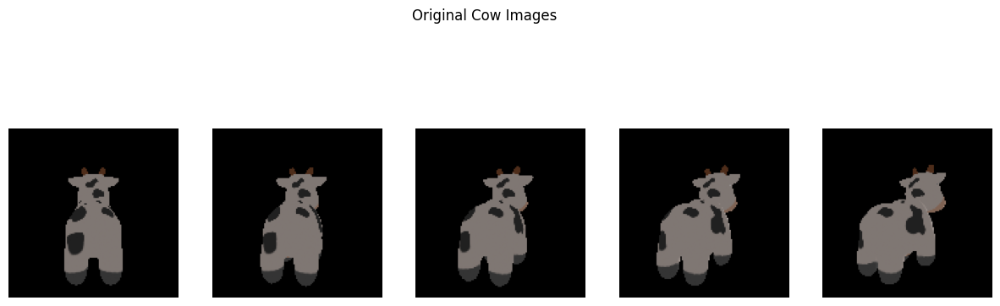

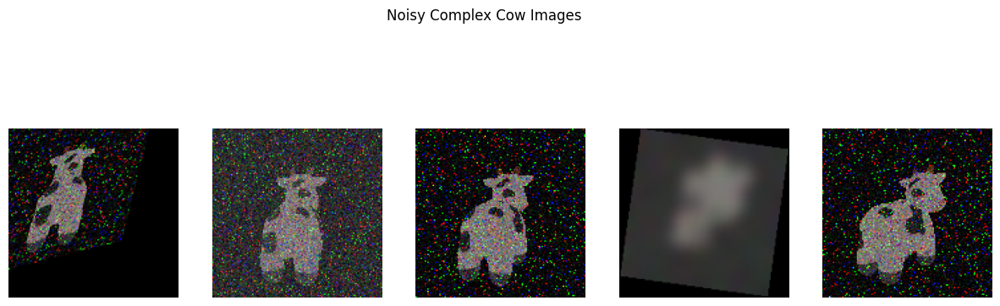

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



# Noisy complex images
plot_images(noisy_target_images, "Noisy Complex Cow Images")


In [ ]:
# Denoised Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed ianside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)

# ------------------ Denoising Integration ------------------

def denoise_rendered_image(rendered_image):
    """
    Applies the Denoising Autoencoder (DAE) to the rendered image.
    Args:
        rendered_image (torch.Tensor): Rendered image (B, H, W, 3) or (H, W, 3)
    Returns:
        denoised_image (torch.Tensor): Denoised version of the rendered image (B, H, W, 3)
    """
    # Check if the batch dimension exists, and add it if necessary
    if rendered_image.dim() == 3:  # If the image is (H, W, 3), add batch dimension
        rendered_image = rendered_image.unsqueeze(0)

    # Prepare the rendered image for denoising: (B, H, W, 3) -> (B, 3, H, W)
    rendered_image_nchw = rendered_image.permute(0, 3, 1, 2)

    # Pass the rendered image through the denoiser
    denoised_image_nchw = denoiser(rendered_image_nchw)

    # Convert back: (B, 3, H, W) -> (B, H, W, 3)
    denoised_image = denoised_image_nchw.permute(0, 2, 3, 1)

    return denoised_image


In [ ]:
# Denoised Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        # Apply denoising to the rendered colors before returning
        denoised_rays_colors = denoise_rendered_image(rays_colors)

        return rays_densities, denoised_rays_colors  # Return denoised colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # Note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def prepare_for_lpips(image):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)
    return 2.0 * image - 1.0

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None, iteration=0
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS every 100 iterations, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Denoising Step
        denoised_image = denoise_rendered_image(rendered_image.unsqueeze(0)).squeeze(0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between denoised and target images
        psnr_value = psnr(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        win_size = min(5, min(target_image.shape[0:2])) if min(target_image.shape[0:2]) >= 5 else 3
        ssim_value = ssim(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=win_size,
            channel_axis=-1
        )

        # Calculate LPIPS only every 100 iterations
        lpips_value = None
        if lpips_model and iteration % 100 == 0:
            rendered_image_lpips = prepare_for_lpips(denoised_image.permute(2, 0, 1).unsqueeze(0))
            target_image_lpips = prepare_for_lpips(target_image.permute(2, 0, 1).unsqueeze(0))
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(denoised_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "denoised rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot and update output
    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    # Print and return tracked metrics
    print(f"Render time: {render_time:.4f}s, Memory: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}" if lpips_value is not None else "")
    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Modify the prepare_for_lpips function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]

    # Resize if height or width is less than min_size
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)

    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)            # Clean images for evaluation
noisy_target_images = noisy_target_images.to(device)  # Noisy images for training and validation
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler('cuda')

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images as input for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]  # Noisy images for training input
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]  # Noisy images for validation input
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []  # New list to store memory usage

batch_size = 6
n_iter = 3000

# Main optimization loop with ERT and AMP
for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Adjust learning rate
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Sample multiple views per batch for multi-view consistency
    multi_view_indices = torch.randperm(len(train_cameras))[:batch_size * 2]
    batch_cameras_multi_view = FoVPerspectiveCameras(
        R=train_cameras.R[multi_view_indices],
        T=train_cameras.T[multi_view_indices],
        znear=train_cameras.znear[multi_view_indices],
        zfar=train_cameras.zfar[multi_view_indices],
        aspect_ratio=train_cameras.aspect_ratio[multi_view_indices],
        fov=train_cameras.fov[multi_view_indices],
        device=device
    )

    with autocast('cuda'):
        # Forward pass through the renderer with ERT applied
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras_multi_view,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Denoising step applied to the rendered images
        denoised_images = denoise_rendered_image(rendered_images)

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[multi_view_indices, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes, silhouettes_at_rays).abs().mean()

        # Use clean target images for comparison
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][multi_view_indices],  # Clean target images for training evaluation
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()

        # Multi-view consistency loss
        denoised_images_diff = denoised_images[:batch_size] - denoised_images[batch_size:]
        multi_view_loss = denoised_images_diff.pow(2).mean()

        # Total optimization loss with multi-view consistency
        loss = color_err + sil_err + 0.05 * multi_view_loss  # Weight multi-view loss by a factor

        # Backward pass and optimization step with scaling for AMP
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Ensure dimension compatibility for PSNR and SSIM
    if denoised_images.shape != colors_at_rays.shape:
        denoised_images = denoised_images.squeeze(0) if denoised_images.shape[0] == 1 else denoised_images
        colors_at_rays = colors_at_rays.squeeze(0) if colors_at_rays.shape[0] == 1 else colors_at_rays

    # PSNR and SSIM Calculations for training (against clean target images)
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Training LPIPS Calculation every 100 iterations
    lpips_train_value = None
    if lpips_model and iteration % 100 == 0:
        if denoised_images.dim() == 3:  # Check if batch dimension is missing
            denoised_images = denoised_images.unsqueeze(0)
        if colors_at_rays.dim() == 3:  # Check if batch dimension is missing
            colors_at_rays = colors_at_rays.unsqueeze(0)

        denoised_images_lpips = prepare_for_lpips(denoised_images.permute(0, 3, 1, 2))
        colors_at_rays_lpips = prepare_for_lpips(colors_at_rays.permute(0, 3, 1, 2))
        lpips_train_value = lpips_model(denoised_images_lpips, colors_at_rays_lpips).mean().item()
        lpips_train_history.append(lpips_train_value)
        print(f"Training LPIPS = {lpips_train_value:.4f} at iteration {iteration}")

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)  # Store memory usage

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' multi-view loss = {float(multi_view_loss):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB'
        )

    # Validation and visualization every 100 iterations
    if iteration % 100 == 0:
        # Validation metrics
        val_idx = torch.randperm(len(val_cameras))[:batch_size]
        val_batch_cameras = FoVPerspectiveCameras(
            R=val_cameras.R[val_idx],
            T=val_cameras.T[val_idx],
            znear=val_cameras.znear[val_idx],
            zfar=val_cameras.zfar[val_idx],
            aspect_ratio=val_cameras.aspect_ratio[val_idx],
            fov=val_cameras.fov[val_idx],
            device=device
        )

        with torch.no_grad():
            val_images_silhouettes, val_sampled_rays = renderer_mc(
                cameras=val_batch_cameras,
                volumetric_function=neural_radiance_field
            )
            val_rendered_images, val_rendered_silhouettes = val_images_silhouettes.split([3, 1], dim=-1)
            val_denoised_images = denoise_rendered_image(val_rendered_images)
            val_colors_at_rays = sample_images_at_mc_locs(
                target_images[val_indices][val_idx],  # Clean target images for validation evaluation
                val_sampled_rays.xys
            )

            # Calculate validation PSNR and SSIM
            val_psnr = psnr(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0
            )
            val_ssim = ssim(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0,
                win_size=5,
                channel_axis=-1
            )

            # Calculate validation LPIPS
            val_lpips_value = None
            if lpips_model:
                if val_denoised_images.dim() == 3:
                    val_denoised_images = val_denoised_images.unsqueeze(0)
                if val_colors_at_rays.dim() == 3:
                    val_colors_at_rays = val_colors_at_rays.unsqueeze(0)

                val_denoised_images_lpips = prepare_for_lpips(val_denoised_images.permute(0, 3, 1, 2))
                val_colors_at_rays_lpips = prepare_for_lpips(val_colors_at_rays.permute(0, 3, 1, 2))
                val_lpips_value = lpips_model(val_denoised_images_lpips, val_colors_at_rays_lpips).mean().item()
                val_lpips_history.append(val_lpips_value)

        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print validation metrics
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}, LPIPS = {val_lpips_value:.4f} at iteration {iteration}")

        # Visualization for training sample
        show_idx = torch.randperm(len(train_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],  # Clean target image for display
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid,
            lpips_model=lpips_model,
            iteration=iteration  # Pass iteration for LPIPS in show_full_render
        )


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

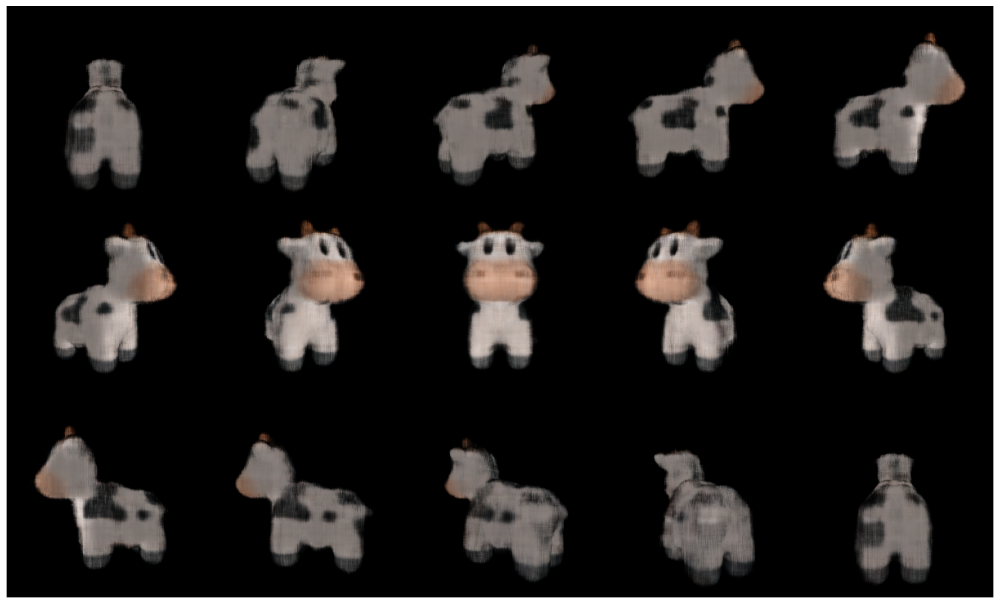

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss      9.60e-03 ± 9.26e-03                          -   
1      Silhouette Loss      1.35e-02 ± 2.50e-02                          -   
2                 PSNR             25.92 ± 2.92               23.16 ± 1.91   
3                 SSIM              0.94 ± 0.10                0.86 ± 0.16   
4                LPIPS          0.0548 ± 0.1133            0.0711 ± 0.1019   
5  Time per iteration           0.09 s ± 0.00 s                          -   
6         Memory Usage    13987.11 MB ± 0.31 MB                          -   

  Best Training Best Validation  
0      3.53e-03               -  
1      3.81e-03               -  
2         30.03           24.92  
3          0.98            0.92  
4        0.0170          0.0397  
5        0.08 s               -  
6   13986.72 MB               -  


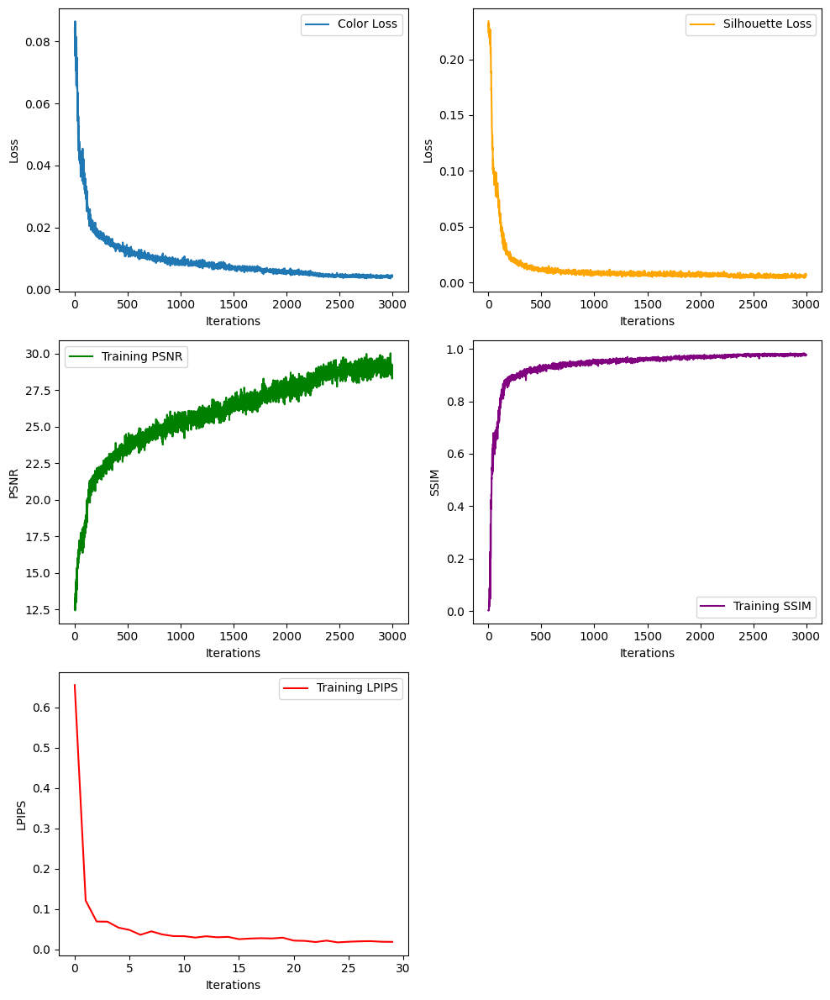

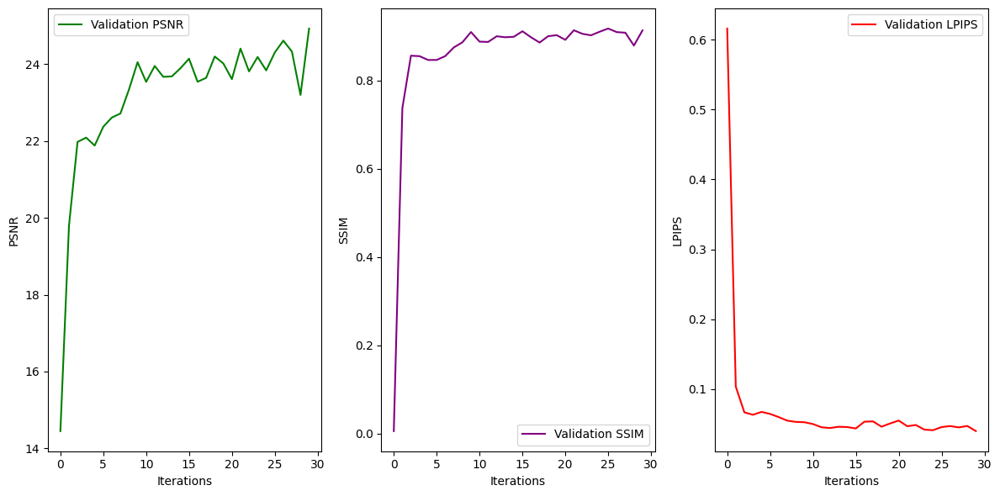

In [ ]:
import matplotlib.pyplot as plt

# Set up figure with multiple subplots for training metrics
fig, axs = plt.subplots(3, 2, figsize=(10, 12))

# Plot Color Loss over Iterations
axs[0, 0].plot(metrics_data['loss_color'], label='Color Loss')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("Loss")
#axs[0, 0].set_title("NeRF + DAE : Color Loss")
axs[0, 0].legend()

# Plot Silhouette Loss over Iterations
axs[0, 1].plot(metrics_data['loss_silhouette'], label='Silhouette Loss', color='orange')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("Loss")
#axs[0, 1].set_title("NeRF + DAE : Silhouette Loss")
axs[0, 1].legend()

# Plot PSNR for Training over Iterations
axs[1, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
#axs[1, 0].set_title("NeRF + DAE : Training PSNR")
axs[1, 0].legend()

# Plot SSIM for Training over Iterations
axs[1, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
#axs[1, 1].set_title("NeRF + DAE : Training SSIM")
axs[1, 1].legend()

# Plot LPIPS for Training over Iterations
axs[2, 0].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[2, 0].set_xlabel("Iterations")
axs[2, 0].set_ylabel("LPIPS")
#axs[2, 0].set_title("NeRF + DAE : Training LPIPS")
axs[2, 0].legend()
axs[2, 1].axis('off')  # Turn off the last unused subplot in the training section

# Adjust layout for training metrics
plt.tight_layout()

# Set up figure for validation metrics in separate plot with reduced width
fig, val_axs = plt.subplots(1, 3, figsize=(12, 6))

# Plot PSNR for Validation over Iterations
val_axs[0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
val_axs[0].set_xlabel("Iterations")
val_axs[0].set_ylabel("PSNR")
#val_axs[0].set_title("NeRF + DAE : Validation PSNR")
val_axs[0].legend()

# Plot SSIM for Validation over Iterations
val_axs[1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
val_axs[1].set_xlabel("Iterations")
val_axs[1].set_ylabel("SSIM")
#val_axs[1].set_title("NeRF + DAE : Validation SSIM")
val_axs[1].legend()

# Plot LPIPS for Validation over Iterations
val_axs[2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
val_axs[2].set_xlabel("Iterations")
val_axs[2].set_ylabel("LPIPS")
#val_axs[2].set_title("NeRF + DAE : Validation LPIPS")
val_axs[2].legend()

# Adjust layout for validation metrics
plt.tight_layout()
plt.show()


In [ ]:
#########################################################################################

# *Baseline NeRF + MPT + DAE + MVC (Clean Cow Dataset)*

In [ ]:
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

noisy_target_images= target_images


# ------------------ Denoising Autoencoder with Dropout Initialization (Step 2) ------------------

import torch.nn as nn
import torch.optim as optim

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()

        # Encoder: Downsampling layers with dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Downsample by 2 again
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
        )

        # Decoder: Upsampling layers with dropout
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2 again
            nn.Sigmoid()  # Output in [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the Denoising Autoencoder with Dropout
denoiser = DenoisingAutoencoder().to(device)

# Loss function and optimizer for the denoiser
denoiser_criterion = nn.MSELoss()  # Mean Squared Error for denoising
denoiser_optimizer = optim.Adam(denoiser.parameters(), lr=1e-4)  # Optimizer for DAE

# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


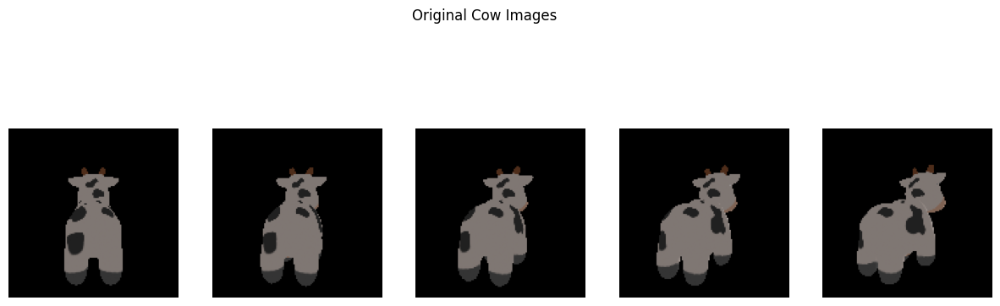

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



In [ ]:
# Denoised Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed ianside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)

# ------------------ Denoising Integration ------------------

def denoise_rendered_image(rendered_image):
    """
    Applies the Denoising Autoencoder (DAE) to the rendered image.
    Args:
        rendered_image (torch.Tensor): Rendered image (B, H, W, 3) or (H, W, 3)
    Returns:
        denoised_image (torch.Tensor): Denoised version of the rendered image (B, H, W, 3)
    """
    # Check if the batch dimension exists, and add it if necessary
    if rendered_image.dim() == 3:  # If the image is (H, W, 3), add batch dimension
        rendered_image = rendered_image.unsqueeze(0)

    # Prepare the rendered image for denoising: (B, H, W, 3) -> (B, 3, H, W)
    rendered_image_nchw = rendered_image.permute(0, 3, 1, 2)

    # Pass the rendered image through the denoiser
    denoised_image_nchw = denoiser(rendered_image_nchw)

    # Convert back: (B, 3, H, W) -> (B, H, W, 3)
    denoised_image = denoised_image_nchw.permute(0, 2, 3, 1)

    return denoised_image


In [ ]:
# Denoised Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        # Apply denoising to the rendered colors before returning
        denoised_rays_colors = denoise_rendered_image(rays_colors)

        return rays_densities, denoised_rays_colors  # Return denoised colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # Note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def prepare_for_lpips(image):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)
    return 2.0 * image - 1.0

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None, iteration=0
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS every 100 iterations, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Denoising Step
        denoised_image = denoise_rendered_image(rendered_image.unsqueeze(0)).squeeze(0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between denoised and target images
        psnr_value = psnr(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        win_size = min(5, min(target_image.shape[0:2])) if min(target_image.shape[0:2]) >= 5 else 3
        ssim_value = ssim(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=win_size,
            channel_axis=-1
        )

        # Calculate LPIPS only every 100 iterations
        lpips_value = None
        if lpips_model and iteration % 100 == 0:
            rendered_image_lpips = prepare_for_lpips(denoised_image.permute(2, 0, 1).unsqueeze(0))
            target_image_lpips = prepare_for_lpips(target_image.permute(2, 0, 1).unsqueeze(0))
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(denoised_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "denoised rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot and update output
    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    # Print and return tracked metrics
    print(f"Render time: {render_time:.4f}s, Memory: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}" if lpips_value is not None else "")
    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Modify the prepare_for_lpips function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]

    # Resize if height or width is less than min_size
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)

    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)            # Clean images for evaluation
noisy_target_images = noisy_target_images.to(device)  # Noisy images for training and validation
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler('cuda')

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images as input for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]  # Noisy images for training input
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]  # Noisy images for validation input
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []  # New list to store memory usage

batch_size = 6
n_iter = 3000

# Main optimization loop with ERT and AMP
for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Adjust learning rate
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Sample multiple views per batch for multi-view consistency
    multi_view_indices = torch.randperm(len(train_cameras))[:batch_size * 2]
    batch_cameras_multi_view = FoVPerspectiveCameras(
        R=train_cameras.R[multi_view_indices],
        T=train_cameras.T[multi_view_indices],
        znear=train_cameras.znear[multi_view_indices],
        zfar=train_cameras.zfar[multi_view_indices],
        aspect_ratio=train_cameras.aspect_ratio[multi_view_indices],
        fov=train_cameras.fov[multi_view_indices],
        device=device
    )

    with autocast('cuda'):
        # Forward pass through the renderer with ERT applied
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras_multi_view,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Denoising step applied to the rendered images
        denoised_images = denoise_rendered_image(rendered_images)

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[multi_view_indices, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes, silhouettes_at_rays).abs().mean()

        # Use clean target images for comparison
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][multi_view_indices],  # Clean target images for training evaluation
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()

        # Multi-view consistency loss
        denoised_images_diff = denoised_images[:batch_size] - denoised_images[batch_size:]
        multi_view_loss = denoised_images_diff.pow(2).mean()

        # Total optimization loss with multi-view consistency
        loss = color_err + sil_err + 0.05 * multi_view_loss  # Weight multi-view loss by a factor

        # Backward pass and optimization step with scaling for AMP
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Ensure dimension compatibility for PSNR and SSIM
    if denoised_images.shape != colors_at_rays.shape:
        denoised_images = denoised_images.squeeze(0) if denoised_images.shape[0] == 1 else denoised_images
        colors_at_rays = colors_at_rays.squeeze(0) if colors_at_rays.shape[0] == 1 else colors_at_rays

    # PSNR and SSIM Calculations for training (against clean target images)
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Training LPIPS Calculation every 100 iterations
    lpips_train_value = None
    if lpips_model and iteration % 100 == 0:
        if denoised_images.dim() == 3:  # Check if batch dimension is missing
            denoised_images = denoised_images.unsqueeze(0)
        if colors_at_rays.dim() == 3:  # Check if batch dimension is missing
            colors_at_rays = colors_at_rays.unsqueeze(0)

        denoised_images_lpips = prepare_for_lpips(denoised_images.permute(0, 3, 1, 2))
        colors_at_rays_lpips = prepare_for_lpips(colors_at_rays.permute(0, 3, 1, 2))
        lpips_train_value = lpips_model(denoised_images_lpips, colors_at_rays_lpips).mean().item()
        lpips_train_history.append(lpips_train_value)
        print(f"Training LPIPS = {lpips_train_value:.4f} at iteration {iteration}")

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)  # Store memory usage

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' multi-view loss = {float(multi_view_loss):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB'
        )

    # Validation and visualization every 100 iterations
    if iteration % 100 == 0:
        # Validation metrics
        val_idx = torch.randperm(len(val_cameras))[:batch_size]
        val_batch_cameras = FoVPerspectiveCameras(
            R=val_cameras.R[val_idx],
            T=val_cameras.T[val_idx],
            znear=val_cameras.znear[val_idx],
            zfar=val_cameras.zfar[val_idx],
            aspect_ratio=val_cameras.aspect_ratio[val_idx],
            fov=val_cameras.fov[val_idx],
            device=device
        )

        with torch.no_grad():
            val_images_silhouettes, val_sampled_rays = renderer_mc(
                cameras=val_batch_cameras,
                volumetric_function=neural_radiance_field
            )
            val_rendered_images, val_rendered_silhouettes = val_images_silhouettes.split([3, 1], dim=-1)
            val_denoised_images = denoise_rendered_image(val_rendered_images)
            val_colors_at_rays = sample_images_at_mc_locs(
                target_images[val_indices][val_idx],  # Clean target images for validation evaluation
                val_sampled_rays.xys
            )

            # Calculate validation PSNR and SSIM
            val_psnr = psnr(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0
            )
            val_ssim = ssim(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0,
                win_size=5,
                channel_axis=-1
            )

            # Calculate validation LPIPS
            val_lpips_value = None
            if lpips_model:
                if val_denoised_images.dim() == 3:
                    val_denoised_images = val_denoised_images.unsqueeze(0)
                if val_colors_at_rays.dim() == 3:
                    val_colors_at_rays = val_colors_at_rays.unsqueeze(0)

                val_denoised_images_lpips = prepare_for_lpips(val_denoised_images.permute(0, 3, 1, 2))
                val_colors_at_rays_lpips = prepare_for_lpips(val_colors_at_rays.permute(0, 3, 1, 2))
                val_lpips_value = lpips_model(val_denoised_images_lpips, val_colors_at_rays_lpips).mean().item()
                val_lpips_history.append(val_lpips_value)

        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print validation metrics
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}, LPIPS = {val_lpips_value:.4f} at iteration {iteration}")

        # Visualization for training sample
        show_idx = torch.randperm(len(train_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],  # Clean target image for display
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid,
            lpips_model=lpips_model,
            iteration=iteration  # Pass iteration for LPIPS in show_full_render
        )


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

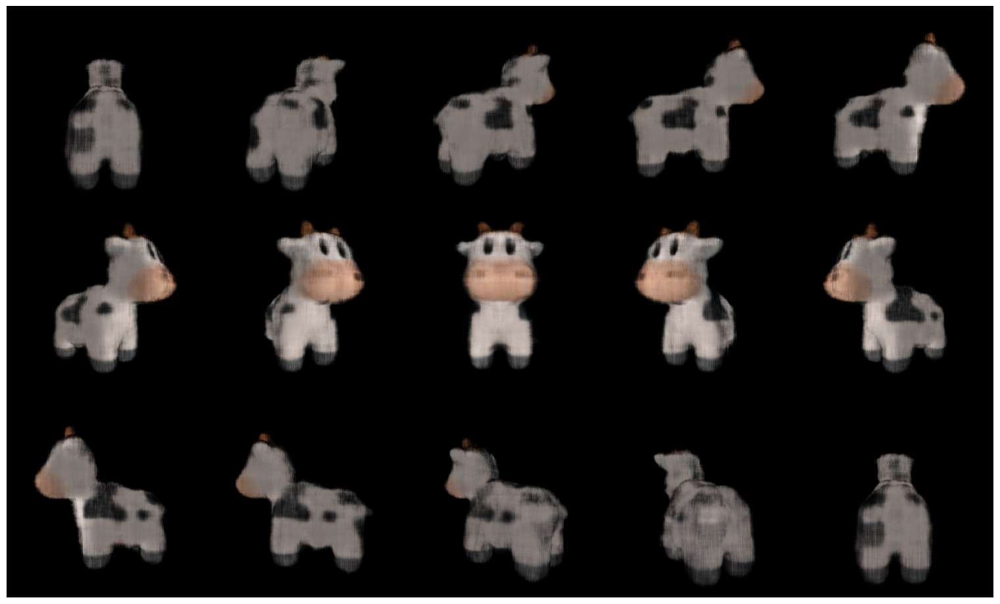

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss      9.59e-03 ± 9.26e-03                          -   
1      Silhouette Loss      1.35e-02 ± 2.50e-02                          -   
2                 PSNR             25.93 ± 2.92               23.16 ± 1.92   
3                 SSIM              0.94 ± 0.10                0.86 ± 0.16   
4                LPIPS          0.0549 ± 0.1133            0.0710 ± 0.1019   
5  Time per iteration           0.09 s ± 0.00 s                          -   
6         Memory Usage    13928.73 MB ± 0.22 MB                          -   

  Best Training Best Validation  
0      3.53e-03               -  
1      3.80e-03               -  
2         30.04           24.95  
3          0.98            0.92  
4        0.0170          0.0395  
5        0.08 s               -  
6   13927.45 MB               -  


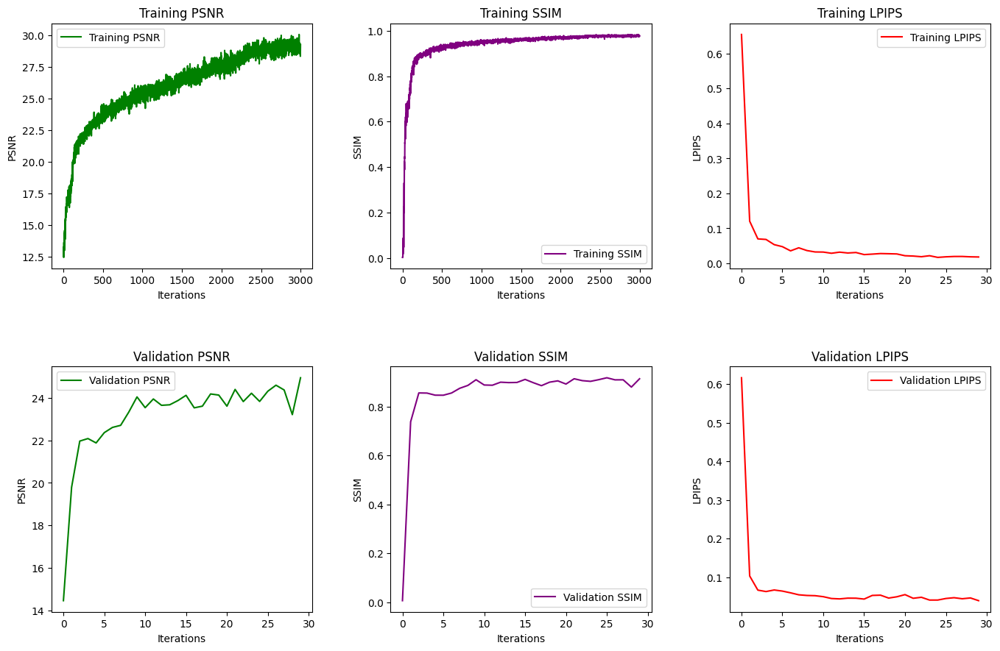

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# *Baseline NeRF + MPT + DAE + ERT(complex Noisy Cow Dataset)*

---



In [ ]:

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# ------------------ Combined Higher Gaussian and Salt-and-Pepper Noise ------------------

def add_combined_noise(images, gaussian_std=0.5, sp_ratio=0.3):
    """
    Adds higher Gaussian and salt-and-pepper noise to a batch of images.
    """
    noisy_images = []
    for img in images:
        # Add Gaussian noise
        noise = torch.randn(img.size(), device=img.device) * gaussian_std
        noisy_img = img + noise

        # Add salt-and-pepper noise
        sp_mask = torch.rand(img.size(), device=img.device)
        noisy_img = torch.where(sp_mask < sp_ratio / 2, torch.zeros_like(noisy_img), noisy_img)  # Salt (black)
        noisy_img = torch.where(sp_mask > 1 - sp_ratio / 2, torch.ones_like(noisy_img), noisy_img)  # Pepper (white)

        # Clamp the values to keep them in the range [0, 1]
        noisy_img = torch.clamp(noisy_img, 0, 1)
        noisy_images.append(noisy_img)
    return torch.stack(noisy_images)

# Apply combined noise to the generated images
noisy_target_images = add_combined_noise(target_images, gaussian_std=0.1, sp_ratio=0.05)
print("Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.")

# ------------------ Complex Data Augmentation (Adding Complexity to the Images) ------------------

def add_complexity_to_images(images, target_size=(128, 128)):
    """
    Adds more complex distortions and noise to images to test U-Net's capability.
    Applies background changes, stronger occlusion, motion blur, random rotations, and color shifts.
    """
    complex_images = []

    for img in images:
        # Convert tensor to PIL image
        img_pil = Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))

        # Apply random complex background
        if random.random() > 0.8:
            bg_color = np.random.randint(0, 255, size=(target_size[0], target_size[1], 3), dtype=np.uint8)
            bg_image = Image.fromarray(bg_color)
            img_pil = Image.blend(bg_image, img_pil, alpha=0.7)

        # Apply larger random occlusions (black or white block)
        if random.random() > 0.7:
            occlusion_size = random.randint(40, 100)
            occlusion_x = random.randint(0, target_size[0] - occlusion_size)
            occlusion_y = random.randint(0, target_size[1] - occlusion_size)
            occlusion_type = random.choice([0, 255])  # Black or white
            img_pil.paste(occlusion_type, (occlusion_x, occlusion_y, occlusion_x + occlusion_size, occlusion_y + occlusion_size))

        # Apply random motion blur with larger blur radius
        if random.random() > 0.7:
            blur_radius = random.uniform(3.0, 7.0)
            img_pil = img_pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

        # Apply random brightness, contrast, and color jitter
        if random.random() > 0.8:
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust brightness
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust contrast

            # Apply random color jitter to challenge color robustness
            img_pil = ImageEnhance.Color(img_pil).enhance(random.uniform(0.6, 1.4))

        # Apply random geometric distortion (stretching, shearing, scaling)
        if random.random() > 0.7:
            img_pil = img_pil.transform(target_size, Image.AFFINE, (1.2, 0.3, 0, 0.3, 1.2, 0), resample=Image.BICUBIC)

        # Apply random rotation (rotating between 0 to 360 degrees)
        if random.random() > 0.7:
            angle = random.randint(0, 360)
            img_pil = img_pil.rotate(angle, resample=Image.BICUBIC, expand=True)

        # Resize back to the target size
        img_pil = img_pil.resize(target_size)

        # Convert back to tensor
        complex_img = torch.from_numpy(np.array(img_pil) / 255.0).float().to(device)
        complex_images.append(complex_img)

    return torch.stack(complex_images)

# Apply complexity transformations to the noisy target images
noisy_complex_images = add_complexity_to_images(noisy_target_images)  # Updated to use `noisy_target_images`
noisy_target_images= noisy_complex_images
print("Higher complexity transformations applied to the noisy target images.")

# ------------------ Denoising Autoencoder with Dropout Initialization (Step 2) ------------------

import torch.nn as nn
import torch.optim as optim

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()

        # Encoder: Downsampling layers with dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Downsample by 2 again
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
        )

        # Decoder: Upsampling layers with dropout
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2 again
            nn.Sigmoid()  # Output in [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the Denoising Autoencoder with Dropout
denoiser = DenoisingAutoencoder().to(device)

# Loss function and optimizer for the denoiser
denoiser_criterion = nn.MSELoss()  # Mean Squared Error for denoising
denoiser_optimizer = optim.Adam(denoiser.parameters(), lr=1e-4)  # Optimizer for DAE

# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


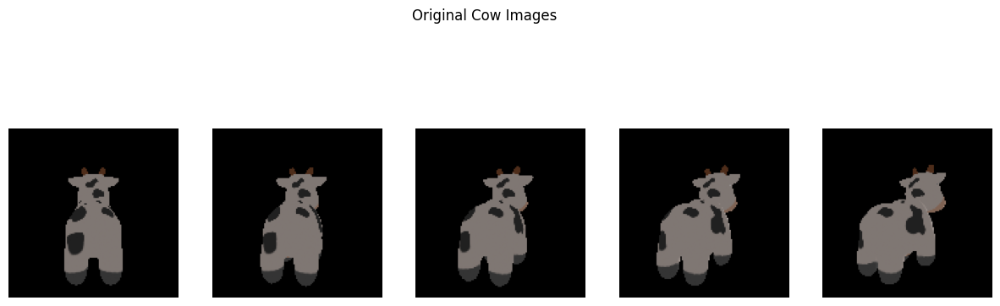

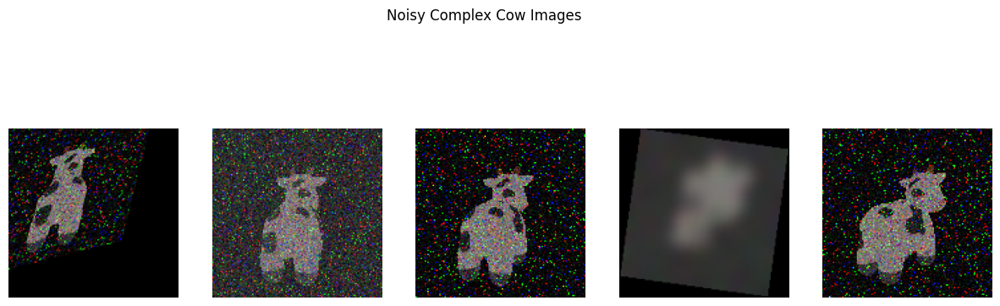

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



# Noisy complex images
plot_images(noisy_target_images, "Noisy Complex Cow Images")


In [ ]:
# Denoised Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed ianside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)

# ------------------ Denoising Integration ------------------

def denoise_rendered_image(rendered_image):
    """
    Applies the Denoising Autoencoder (DAE) to the rendered image.
    Args:
        rendered_image (torch.Tensor): Rendered image (B, H, W, 3) or (H, W, 3)
    Returns:
        denoised_image (torch.Tensor): Denoised version of the rendered image (B, H, W, 3)
    """
    # Check if the batch dimension exists, and add it if necessary
    if rendered_image.dim() == 3:  # If the image is (H, W, 3), add batch dimension
        rendered_image = rendered_image.unsqueeze(0)

    # Prepare the rendered image for denoising: (B, H, W, 3) -> (B, 3, H, W)
    rendered_image_nchw = rendered_image.permute(0, 3, 1, 2)

    # Pass the rendered image through the denoiser
    denoised_image_nchw = denoiser(rendered_image_nchw)

    # Convert back: (B, 3, H, W) -> (B, H, W, 3)
    denoised_image = denoised_image_nchw.permute(0, 2, 3, 1)

    return denoised_image


In [ ]:
# Denoised Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        # Apply denoising to the rendered colors before returning
        denoised_rays_colors = denoise_rendered_image(rays_colors)

        return rays_densities, denoised_rays_colors  # Return denoised colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # Note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def prepare_for_lpips(image):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)
    return 2.0 * image - 1.0

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None, iteration=0
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS every 100 iterations, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Denoising Step
        denoised_image = denoise_rendered_image(rendered_image.unsqueeze(0)).squeeze(0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between denoised and target images
        psnr_value = psnr(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        win_size = min(5, min(target_image.shape[0:2])) if min(target_image.shape[0:2]) >= 5 else 3
        ssim_value = ssim(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=win_size,
            channel_axis=-1
        )

        # Calculate LPIPS only every 100 iterations
        lpips_value = None
        if lpips_model and iteration % 100 == 0:
            rendered_image_lpips = prepare_for_lpips(denoised_image.permute(2, 0, 1).unsqueeze(0))
            target_image_lpips = prepare_for_lpips(target_image.permute(2, 0, 1).unsqueeze(0))
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(denoised_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "denoised rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot and update output
    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    # Print and return tracked metrics
    print(f"Render time: {render_time:.4f}s, Memory: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}" if lpips_value is not None else "")
    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
import numpy as np
import pandas as pd
import torch
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Prepare for LPIPS function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)
    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
noisy_target_images = noisy_target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the neural radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler()

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []

batch_size = 6
n_iter = 3000
opacity_threshold = 0.095  # Opacity threshold for ERT

# Main optimization loop with ERT and AMP
for iteration in range(n_iter):
    start_time = time.time()
    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Batch of cameras for training
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast(device_type='cuda'):  # Specify device type for autocast
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)
        denoised_images = denoise_rendered_image(rendered_images)

        # Early Ray Termination (ERT)
        accumulated_opacity = torch.zeros_like(rendered_silhouettes[..., 0, 0])
        rendered_silhouettes_copy = rendered_silhouettes.clone()
        for i in range(rendered_silhouettes.size(-2)):
            accumulated_opacity += rendered_silhouettes[..., i, 0]
            accumulated_opacity = torch.clamp(accumulated_opacity, max=1.0)
            if (accumulated_opacity >= opacity_threshold).any():
                rendered_silhouettes_copy[..., i:, 0] = 0
                break

        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes_copy, silhouettes_at_rays).abs().mean()
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][batch_idx],
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()
        loss = color_err + sil_err

        # Backward pass and optimization step with scaling for AMP
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Training LPIPS Calculation every 100 iterations
    lpips_train_value = None
    if lpips_model and iteration % 100 == 0:
        if denoised_images.dim() == 3:
            denoised_images = denoised_images.unsqueeze(0)
        if colors_at_rays.dim() == 3:
            colors_at_rays = colors_at_rays.unsqueeze(0)
        denoised_images_lpips = prepare_for_lpips(denoised_images.permute(0, 3, 1, 2))
        colors_at_rays_lpips = prepare_for_lpips(colors_at_rays.permute(0, 3, 1, 2))
        lpips_train_value = lpips_model(denoised_images_lpips, colors_at_rays_lpips).mean().item()
        lpips_train_history.append(lpips_train_value)
        print(f"Training LPIPS = {lpips_train_value:.4f} at iteration {iteration}")

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB'
        )

    # Validation and visualization every 100 iterations
    if iteration % 100 == 0:
        val_idx = torch.randperm(len(val_cameras))[:batch_size]
        val_batch_cameras = FoVPerspectiveCameras(
            R=val_cameras.R[val_idx],
            T=val_cameras.T[val_idx],
            znear=val_cameras.znear[val_idx],
            zfar=val_cameras.zfar[val_idx],
            aspect_ratio=val_cameras.aspect_ratio[val_idx],
            fov=val_cameras.fov[val_idx],
            device=device
        )

        with torch.no_grad():
            val_images_silhouettes, val_sampled_rays = renderer_mc(
                cameras=val_batch_cameras,
                volumetric_function=neural_radiance_field
            )
            val_rendered_images, val_rendered_silhouettes = val_images_silhouettes.split([3, 1], dim=-1)
            val_denoised_images = denoise_rendered_image(val_rendered_images)
            val_colors_at_rays = sample_images_at_mc_locs(
                target_images[val_indices][val_idx],
                val_sampled_rays.xys
            )

            val_psnr = psnr(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0
            )
            val_ssim = ssim(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0,
                win_size=5,
                channel_axis=-1
            )

            # Calculate validation LPIPS
            val_lpips_value = None
            if lpips_model:
                if val_denoised_images.dim() == 3:
                    val_denoised_images = val_denoised_images.unsqueeze(0)
                if val_colors_at_rays.dim() == 3:
                    val_colors_at_rays = val_colors_at_rays.unsqueeze(0)
                val_denoised_images_lpips = prepare_for_lpips(val_denoised_images.permute(0, 3, 1, 2))
                val_colors_at_rays_lpips = prepare_for_lpips(val_colors_at_rays.permute(0, 3, 1, 2))
                val_lpips_value = lpips_model(val_denoised_images_lpips, val_colors_at_rays_lpips).mean().item()
                val_lpips_history.append(val_lpips_value)

        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print validation metrics
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}, LPIPS = {val_lpips_value:.4f} at iteration {iteration}")

        # Visualization for training sample
        show_idx = torch.randperm(len(train_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_color,
            renderer_grid,
            lpips_model=lpips_model,
            iteration=iteration
        )


#summary_df = pd.DataFrame(summary_stats)


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

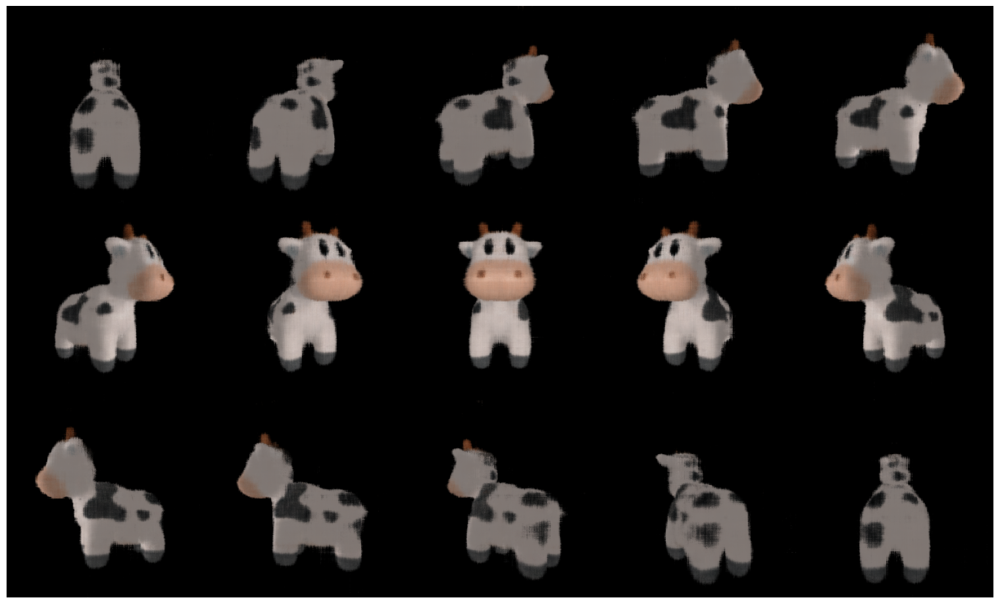

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss      7.81e-03 ± 1.02e-02                          -   
1      Silhouette Loss      2.30e-01 ± 7.02e-03                          -   
2                 PSNR             27.17 ± 3.53               24.05 ± 2.34   
3                 SSIM              0.94 ± 0.11                0.88 ± 0.17   
4                LPIPS          0.0444 ± 0.1113            0.0621 ± 0.1041   
5  Time per iteration           0.05 s ± 0.00 s                          -   
6         Memory Usage    10643.69 MB ± 1.30 MB                          -   

  Best Training Best Validation  
0      1.81e-03               -  
1      2.02e-01               -  
2         33.10           26.72  
3          0.99            0.96  
4        0.0093          0.0207  
5        0.05 s               -  
6   10643.41 MB               -  


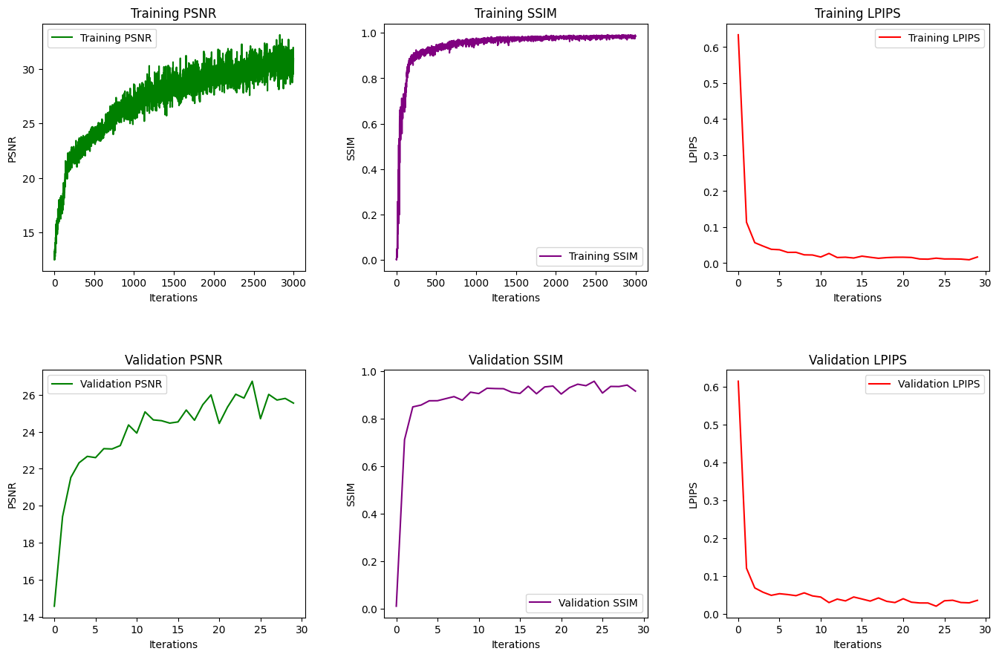

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# *Baseline NeRF + MPT + DAE + ERT(Clean Cow Dataset)*

In [ ]:
# To have clean dataset and avoid changing codes i put target image in noisy image to use claen data in piple for traing and validation and evaluation
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')


noisy_target_images= target_images


# ------------------ Denoising Autoencoder with Dropout Initialization (Step 2) ------------------

import torch.nn as nn
import torch.optim as optim

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()

        # Encoder: Downsampling layers with dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Downsample by 2 again
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
        )

        # Decoder: Upsampling layers with dropout
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2
            nn.ReLU(True),
            nn.Dropout(0.3),  # Dropout layer
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # Upsample by 2 again
            nn.Sigmoid()  # Output in [0, 1]
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the Denoising Autoencoder with Dropout
denoiser = DenoisingAutoencoder().to(device)

# Loss function and optimizer for the denoiser
denoiser_criterion = nn.MSELoss()  # Mean Squared Error for denoising
denoiser_optimizer = optim.Adam(denoiser.parameters(), lr=1e-4)  # Optimizer for DAE

# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


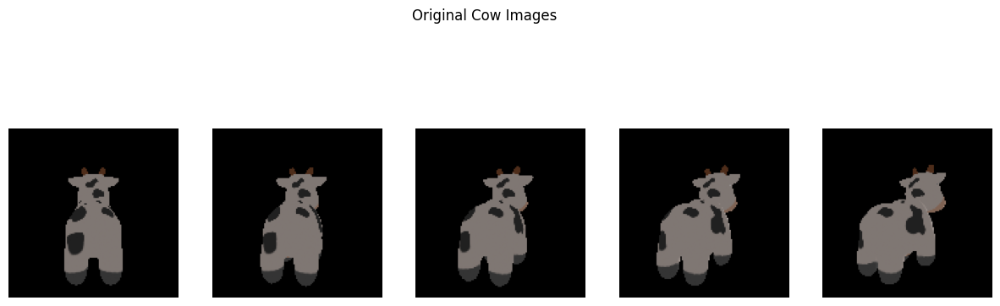

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



In [ ]:
# Denoised Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed ianside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)

# ------------------ Denoising Integration ------------------

def denoise_rendered_image(rendered_image):
    """
    Applies the Denoising Autoencoder (DAE) to the rendered image.
    Args:
        rendered_image (torch.Tensor): Rendered image (B, H, W, 3) or (H, W, 3)
    Returns:
        denoised_image (torch.Tensor): Denoised version of the rendered image (B, H, W, 3)
    """
    # Check if the batch dimension exists, and add it if necessary
    if rendered_image.dim() == 3:  # If the image is (H, W, 3), add batch dimension
        rendered_image = rendered_image.unsqueeze(0)

    # Prepare the rendered image for denoising: (B, H, W, 3) -> (B, 3, H, W)
    rendered_image_nchw = rendered_image.permute(0, 3, 1, 2)

    # Pass the rendered image through the denoiser
    denoised_image_nchw = denoiser(rendered_image_nchw)

    # Convert back: (B, 3, H, W) -> (B, H, W, 3)
    denoised_image = denoised_image_nchw.permute(0, 2, 3, 1)

    return denoised_image


In [ ]:
# Denoised Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        # Apply denoising to the rendered colors before returning
        denoised_rays_colors = denoise_rendered_image(rays_colors)

        return rays_densities, denoised_rays_colors  # Return denoised colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # Note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def prepare_for_lpips(image):
    """
    Prepare the image for LPIPS by ensuring it's in the [-1, 1] range
    and has the correct dimensions.
    """
    if image.dim() == 3:
        image = image.unsqueeze(0)
    return 2.0 * image - 1.0

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None, iteration=0
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS every 100 iterations, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Denoising Step
        denoised_image = denoise_rendered_image(rendered_image.unsqueeze(0)).squeeze(0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between denoised and target images
        psnr_value = psnr(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        win_size = min(5, min(target_image.shape[0:2])) if min(target_image.shape[0:2]) >= 5 else 3
        ssim_value = ssim(
            clamp_and_detach(denoised_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=win_size,
            channel_axis=-1
        )

        # Calculate LPIPS only every 100 iterations
        lpips_value = None
        if lpips_model and iteration % 100 == 0:
            rendered_image_lpips = prepare_for_lpips(denoised_image.permute(2, 0, 1).unsqueeze(0))
            target_image_lpips = prepare_for_lpips(target_image.permute(2, 0, 1).unsqueeze(0))
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(denoised_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "denoised rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot and update output
    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    # Print and return tracked metrics
    print(f"Render time: {render_time:.4f}s, Memory: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}" if lpips_value is not None else "")
    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
import numpy as np
import pandas as pd
import torch
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Prepare for LPIPS function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)
    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
noisy_target_images = noisy_target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the neural radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler()

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []

batch_size = 6
n_iter = 3000
opacity_threshold = 0.095  # Opacity threshold for ERT

# Main optimization loop with ERT and AMP
for iteration in range(n_iter):
    start_time = time.time()
    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Batch of cameras for training
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast(device_type='cuda'):  # Specify device type for autocast
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)
        denoised_images = denoise_rendered_image(rendered_images)

        # Early Ray Termination (ERT)
        accumulated_opacity = torch.zeros_like(rendered_silhouettes[..., 0, 0])
        rendered_silhouettes_copy = rendered_silhouettes.clone()
        for i in range(rendered_silhouettes.size(-2)):
            accumulated_opacity += rendered_silhouettes[..., i, 0]
            accumulated_opacity = torch.clamp(accumulated_opacity, max=1.0)
            if (accumulated_opacity >= opacity_threshold).any():
                rendered_silhouettes_copy[..., i:, 0] = 0
                break

        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes_copy, silhouettes_at_rays).abs().mean()
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][batch_idx],
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()
        loss = color_err + sil_err

        # Backward pass and optimization step with scaling for AMP
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Training LPIPS Calculation every 100 iterations
    lpips_train_value = None
    if lpips_model and iteration % 100 == 0:
        if denoised_images.dim() == 3:
            denoised_images = denoised_images.unsqueeze(0)
        if colors_at_rays.dim() == 3:
            colors_at_rays = colors_at_rays.unsqueeze(0)
        denoised_images_lpips = prepare_for_lpips(denoised_images.permute(0, 3, 1, 2))
        colors_at_rays_lpips = prepare_for_lpips(colors_at_rays.permute(0, 3, 1, 2))
        lpips_train_value = lpips_model(denoised_images_lpips, colors_at_rays_lpips).mean().item()
        lpips_train_history.append(lpips_train_value)
        print(f"Training LPIPS = {lpips_train_value:.4f} at iteration {iteration}")

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB'
        )

    # Validation and visualization every 100 iterations
    if iteration % 100 == 0:
        val_idx = torch.randperm(len(val_cameras))[:batch_size]
        val_batch_cameras = FoVPerspectiveCameras(
            R=val_cameras.R[val_idx],
            T=val_cameras.T[val_idx],
            znear=val_cameras.znear[val_idx],
            zfar=val_cameras.zfar[val_idx],
            aspect_ratio=val_cameras.aspect_ratio[val_idx],
            fov=val_cameras.fov[val_idx],
            device=device
        )

        with torch.no_grad():
            val_images_silhouettes, val_sampled_rays = renderer_mc(
                cameras=val_batch_cameras,
                volumetric_function=neural_radiance_field
            )
            val_rendered_images, val_rendered_silhouettes = val_images_silhouettes.split([3, 1], dim=-1)
            val_denoised_images = denoise_rendered_image(val_rendered_images)
            val_colors_at_rays = sample_images_at_mc_locs(
                target_images[val_indices][val_idx],
                val_sampled_rays.xys
            )

            val_psnr = psnr(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0
            )
            val_ssim = ssim(
                val_denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
                val_colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
                data_range=1.0,
                win_size=5,
                channel_axis=-1
            )

            # Calculate validation LPIPS
            val_lpips_value = None
            if lpips_model:
                if val_denoised_images.dim() == 3:
                    val_denoised_images = val_denoised_images.unsqueeze(0)
                if val_colors_at_rays.dim() == 3:
                    val_colors_at_rays = val_colors_at_rays.unsqueeze(0)
                val_denoised_images_lpips = prepare_for_lpips(val_denoised_images.permute(0, 3, 1, 2))
                val_colors_at_rays_lpips = prepare_for_lpips(val_colors_at_rays.permute(0, 3, 1, 2))
                val_lpips_value = lpips_model(val_denoised_images_lpips, val_colors_at_rays_lpips).mean().item()
                val_lpips_history.append(val_lpips_value)

        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print validation metrics
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}, LPIPS = {val_lpips_value:.4f} at iteration {iteration}")

        # Visualization for training sample
        show_idx = torch.randperm(len(train_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_color,
            renderer_grid,
            lpips_model=lpips_model,
            iteration=iteration
        )


#summary_df = pd.DataFrame(summary_stats)


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

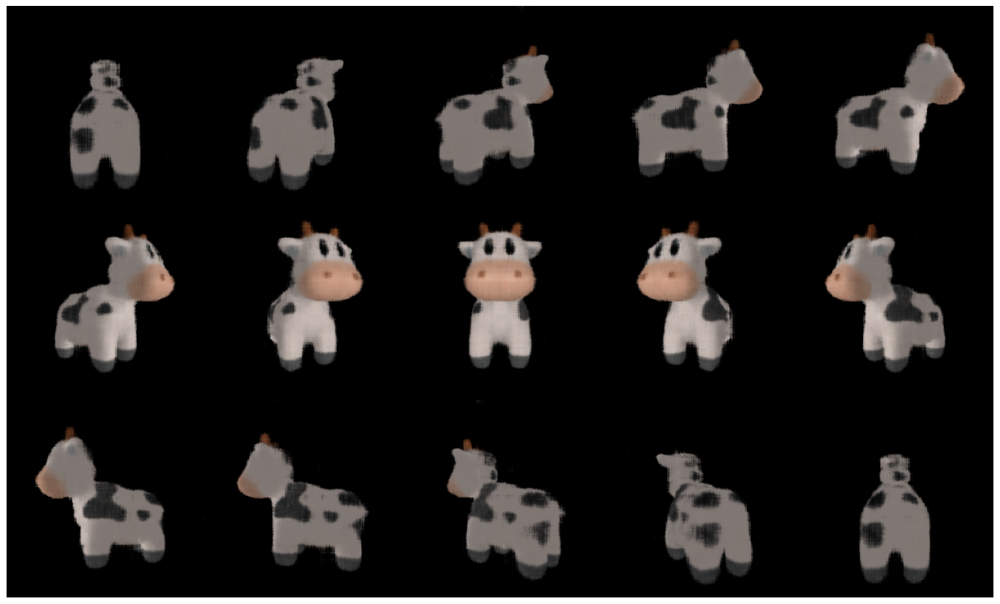

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss      7.82e-03 ± 1.02e-02                          -   
1      Silhouette Loss      2.30e-01 ± 7.02e-03                          -   
2                 PSNR             27.16 ± 3.52               24.01 ± 2.32   
3                 SSIM              0.94 ± 0.11                0.88 ± 0.17   
4                LPIPS          0.0445 ± 0.1113            0.0623 ± 0.1040   
5  Time per iteration           0.05 s ± 0.04 s                          -   
6         Memory Usage     7011.73 MB ± 0.27 MB                          -   

  Best Training Best Validation  
0      1.78e-03               -  
1      2.02e-01               -  
2         33.20           26.66  
3          0.99            0.96  
4        0.0088          0.0214  
5        0.05 s               -  
6    6998.58 MB               -  


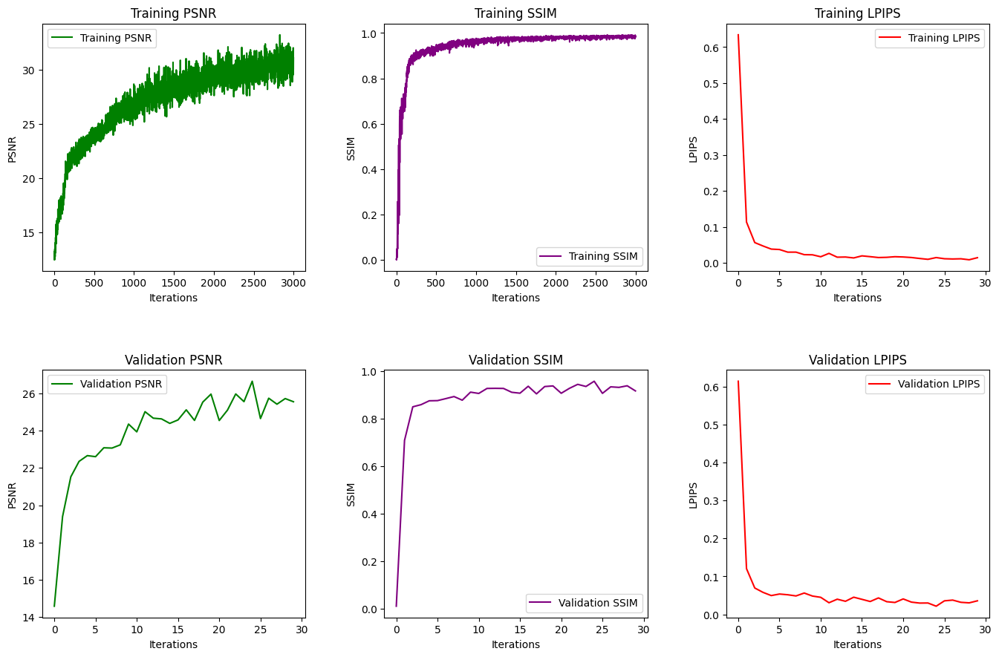

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# *Baseline NeRF (Complex Noisy Data)

In [ ]:
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# ------------------ Combined Higher Gaussian and Salt-and-Pepper Noise ------------------

def add_combined_noise(images, gaussian_std=0.5, sp_ratio=0.3):
    """
    Adds higher Gaussian and salt-and-pepper noise to a batch of images.
    """
    noisy_images = []
    for img in images:
        # Add Gaussian noise
        noise = torch.randn(img.size(), device=img.device) * gaussian_std
        noisy_img = img + noise

        # Add salt-and-pepper noise
        sp_mask = torch.rand(img.size(), device=img.device)
        noisy_img = torch.where(sp_mask < sp_ratio / 2, torch.zeros_like(noisy_img), noisy_img)  # Salt (black)
        noisy_img = torch.where(sp_mask > 1 - sp_ratio / 2, torch.ones_like(noisy_img), noisy_img)  # Pepper (white)

        # Clamp the values to keep them in the range [0, 1]
        noisy_img = torch.clamp(noisy_img, 0, 1)
        noisy_images.append(noisy_img)
    return torch.stack(noisy_images)

# Apply combined noise to the generated images
noisy_target_images = add_combined_noise(target_images, gaussian_std=0.1, sp_ratio=0.05)
print("Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.")

# ------------------ Complex Data Augmentation (Adding Complexity to the Images) ------------------

def add_complexity_to_images(images, target_size=(128, 128)):
    """
    Adds more complex distortions and noise to images to test U-Net's capability.
    Applies background changes, stronger occlusion, motion blur, random rotations, and color shifts.
    """
    complex_images = []

    for img in images:
        # Convert tensor to PIL image
        img_pil = Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))

        # Apply random complex background
        if random.random() > 0.8:
            bg_color = np.random.randint(0, 255, size=(target_size[0], target_size[1], 3), dtype=np.uint8)
            bg_image = Image.fromarray(bg_color)
            img_pil = Image.blend(bg_image, img_pil, alpha=0.7)

        # Apply larger random occlusions (black or white block)
        if random.random() > 0.7:
            occlusion_size = random.randint(40, 100)
            occlusion_x = random.randint(0, target_size[0] - occlusion_size)
            occlusion_y = random.randint(0, target_size[1] - occlusion_size)
            occlusion_type = random.choice([0, 255])  # Black or white
            img_pil.paste(occlusion_type, (occlusion_x, occlusion_y, occlusion_x + occlusion_size, occlusion_y + occlusion_size))

        # Apply random motion blur with larger blur radius
        if random.random() > 0.7:
            blur_radius = random.uniform(3.0, 7.0)
            img_pil = img_pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

        # Apply random brightness, contrast, and color jitter
        if random.random() > 0.8:
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust brightness
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust contrast

            # Apply random color jitter to challenge color robustness
            img_pil = ImageEnhance.Color(img_pil).enhance(random.uniform(0.6, 1.4))

        # Apply random geometric distortion (stretching, shearing, scaling)
        if random.random() > 0.7:
            img_pil = img_pil.transform(target_size, Image.AFFINE, (1.2, 0.3, 0, 0.3, 1.2, 0), resample=Image.BICUBIC)

        # Apply random rotation (rotating between 0 to 360 degrees)
        if random.random() > 0.7:
            angle = random.randint(0, 360)
            img_pil = img_pil.rotate(angle, resample=Image.BICUBIC, expand=True)

        # Resize back to the target size
        img_pil = img_pil.resize(target_size)

        # Convert back to tensor
        complex_img = torch.from_numpy(np.array(img_pil) / 255.0).float().to(device)
        complex_images.append(complex_img)

    return torch.stack(complex_images)

# Apply complexity transformations to the noisy target images
noisy_complex_images = add_complexity_to_images(noisy_target_images)  # Updated to use `noisy_target_images`
noisy_target_images= noisy_complex_images
print("Higher complexity transformations applied to the noisy target images.")


# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


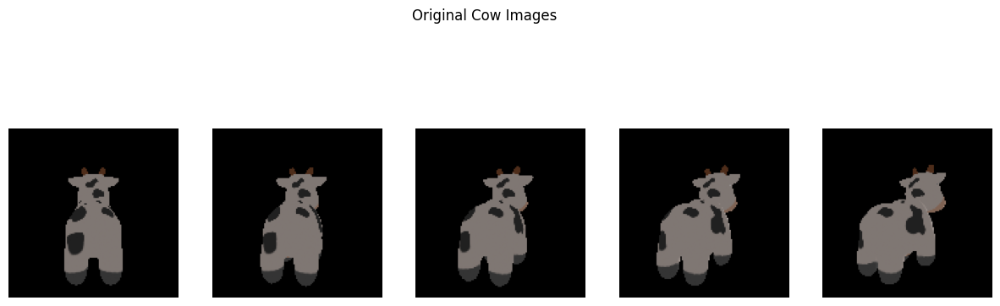

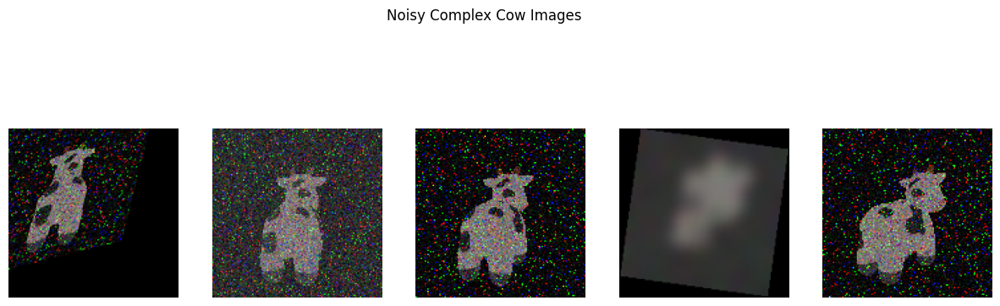

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



# Noisy complex images
plot_images(noisy_target_images, "Noisy Complex Cow Images")


In [ ]:
# Baseline Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed inside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)


In [ ]:
# Baseline Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()  # Sigmoid ensures output in range [0, 1]
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )

        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        return rays_densities, rays_colors


In [ ]:
# Baseline Model - Cell 4

import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time  # Import for timing
import gc
import matplotlib.pyplot as plt

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

import matplotlib.pyplot as plt

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid
):
    """
    This is a helper function for visualizing the
    intermediate results of the learning.
    """
    # Initialize timing and memory usage
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Prevent gradient caching.
    with torch.no_grad():
        # Render using the grid renderer and the
        # batched_forward function of neural_radiance_field.
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        # Split the rendering result into a silhouette render
        # and the image render.
        rendered_image, rendered_silhouette = (
            rendered_image_silhouette[0].split([3, 1], dim=-1)
        )

        # Resize rendered_image to match target_image dimensions if needed.
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],  # Match target image height and width.
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Calculate PSNR and SSIM for rendered image vs. target image.
        psnr_value = psnr(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        ssim_value = ssim(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

        # Calculate LPIPS for rendered image vs. target image.
        rendered_image_lpips = 2.0 * rendered_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        target_image_lpips = 2.0 * target_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track rendering time and memory usage.
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Log these values for later analysis
    print(f"Render time: {render_time:.4f} seconds, Memory usage: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}")

    # Generate plots.
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()
    clamp_and_detach = lambda x: x.clamp(0.0, 1.0).cpu().detach().numpy()
    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})", "rendered image", "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})", "target image",  "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot immediately
    plt.show(block=False)
    plt.pause(0.001)  # Small pause to ensure display updates in notebooks

    return rendered_image, lpips_value  # Return LPIPS along with other metrics


In [ ]:
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time
import matplotlib.pyplot as plt

# Move necessary components to the device.
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)  # Clean images remain for evaluation
noisy_target_images = noisy_target_images.to(device)  # Use noisy images as input
target_silhouettes = target_silhouettes.to(device)

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images as input for training and validation, keep clean images for evaluation
train_images = noisy_target_images[train_indices]  # Noisy images for training input
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]  # Noisy images for validation input
val_silhouettes = target_silhouettes[val_indices]

# Set the seed for reproducibility.
torch.manual_seed(1)

# Instantiate the radiance field model.
neural_radiance_field = NeuralRadianceField().to(device)

# Instantiate the Adam optimizer with a learning rate.
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Batch and iteration settings.
batch_size = 6
n_iter = 3000

# Initialize history buffers for training and validation metrics.
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, lpips_history = [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
time_history, memory_history, avg_sample_count_history = [], [], []

# Main optimization loop.
for iteration in range(n_iter):
    start_time = time.time()  # Start timing for this iteration.
    torch.cuda.reset_max_memory_allocated()  # Reset memory tracking at the start.

    # Decrease the learning rate at 75% of training.
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(
            neural_radiance_field.parameters(), lr=lr * 0.1
        )

    # Zero the optimizer gradient.
    optimizer.zero_grad()

    # Sample random batch indices.
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Sample the minibatch of cameras for training.
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    # Evaluate the NeRF model on training data.
    rendered_images_silhouettes, sampled_rays = renderer_mc(
        cameras=batch_cameras,
        volumetric_function=neural_radiance_field
    )
    rendered_images, rendered_silhouettes = (
        rendered_images_silhouettes.split([3, 1], dim=-1)
    )

    # Compute the silhouette error using huber loss.
    silhouettes_at_rays = sample_images_at_mc_locs(
        train_silhouettes[batch_idx, ..., None],
        sampled_rays.xys
    )
    sil_err = huber(
        rendered_silhouettes,
        silhouettes_at_rays,
    ).abs().mean()

    # Compute the color error using huber loss.
    colors_at_rays = sample_images_at_mc_locs(
        target_images[train_indices][batch_idx],  # Use clean images as ground truth
        sampled_rays.xys
    )
    color_err = huber(
        rendered_images,
        colors_at_rays
    ).abs().mean()

    # Total optimization loss.
    loss = color_err + sil_err

    # Log the loss history.
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Resize rendered_images to match the size of colors_at_rays if needed.
    if rendered_images.shape != colors_at_rays.shape:
        rendered_images = F.interpolate(
            rendered_images.permute(0, 3, 1, 2),  # Convert to NCHW format for interpolation.
            size=colors_at_rays.shape[1:3],      # Match the target image's height and width.
            mode='bilinear',
            align_corners=False
        ).permute(0, 2, 3, 1)  # Convert back to NHWC format after interpolation.

    # Calculate PSNR and SSIM for the rendered images.
    psnr_value = psnr(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    # Log PSNR and SSIM history.
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Log the training time and memory usage.
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB
    memory_history.append(memory_usage)

    # Calculate and log average sample count per ray.
    avg_sample_count = rendered_images.shape[-2]  # Assuming rendered images are [B, H, W, C]
    avg_sample_count_history.append(avg_sample_count)

    # Every 10 iterations, print the current values of the losses and metrics.
    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB,'
            + f' Avg Samples/Ray = {avg_sample_count}'
        )

    # Take the optimization step.
    loss.backward()
    optimizer.step()

       # Every 100 iterations, calculate LPIPS for both training and validation.
    if iteration % 100 == 0 or iteration == (n_iter - 1):
        # Training LPIPS and Visualization
        show_idx = torch.randperm(len(train_cameras))[:1]
        rendered_train_images, lpips_value_train = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],  # Compare against clean target images
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid
        )
        lpips_history.append(lpips_value_train)

        # Validation LPIPS and Visualization
        show_idx_val = torch.randperm(len(val_cameras))[:1]
        rendered_val_images, lpips_value_val = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=val_cameras.R[show_idx_val],
                T=val_cameras.T[show_idx_val],
                znear=val_cameras.znear[show_idx_val],
                zfar=val_cameras.zfar[show_idx_val],
                aspect_ratio=val_cameras.aspect_ratio[show_idx_val],
                fov=val_cameras.fov[show_idx_val],
                device=device
            ),
            target_images[val_indices][show_idx_val][0],  # Compare against clean target images
            val_silhouettes[show_idx_val][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid
        )
        val_lpips_history.append(lpips_value_val)

        # Resize rendered_val_images if necessary
        if rendered_val_images.shape != target_images[val_indices][show_idx_val][0].shape:
            rendered_val_images = F.interpolate(
                rendered_val_images.permute(2, 0, 1).unsqueeze(0),
                size=target_images[val_indices][show_idx_val][0].shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Calculate validation PSNR and SSIM
        val_psnr = psnr(
            rendered_val_images.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_images[val_indices][show_idx_val][0].clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        val_ssim = ssim(
            rendered_val_images.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_images[val_indices][show_idx_val][0].clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )
        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print training and validation metrics
        print(f"Training LPIPS = {lpips_value_train:.4f} | Validation LPIPS = {lpips_value_val:.4f} at iteration {iteration}")
        print(f"Validation PSNR = {val_psnr:.4f}, SSIM = {val_ssim:.4f} at iteration {iteration}")


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

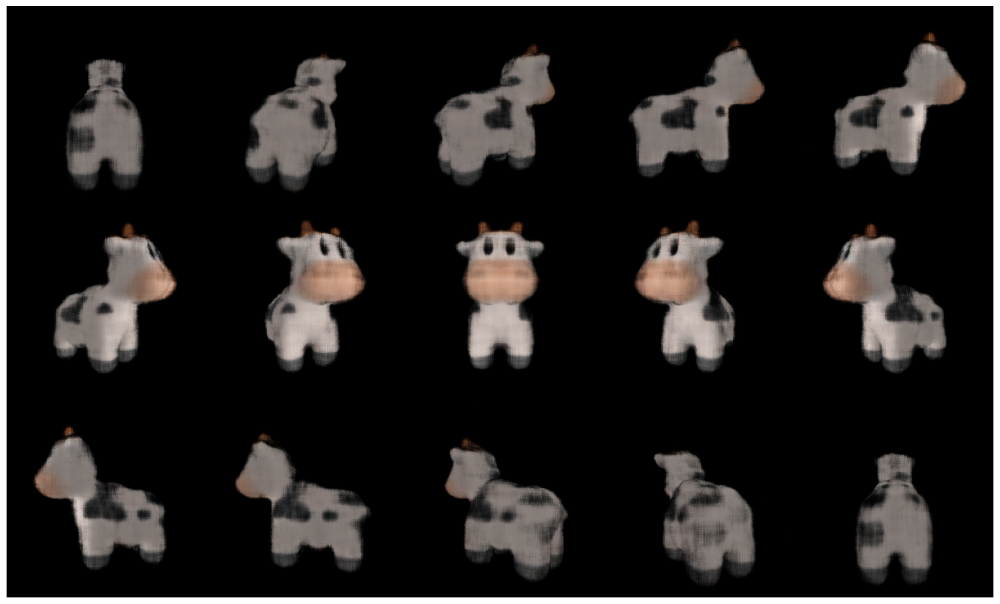

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration ", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  #  Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


                Metric  Training (Average ± STD) Validation (Average ± STD)  \
0           Color Loss       1.07e-02 ± 1.00e-02                          -   
1      Silhouette Loss       1.56e-02 ± 2.78e-02                          -   
2                 PSNR              25.19 ± 2.86               22.40 ± 1.76   
3                 SSIM               0.93 ± 0.11                0.81 ± 0.05   
4                LPIPS           0.2327 ± 0.0590            0.2442 ± 0.0427   
5  Time per iteration            0.08 s ± 0.01 s                          -   
6         Memory Usage  14605.80 MB ± 1196.67 MB                          -   

  Best Training Best Validation  
0      3.74e-03               -  
1      3.57e-03               -  
2         29.59           25.05  
3          0.98            0.86  
4        0.1387          0.1919  
5        0.04 s               -  
6   10642.52 MB               -  


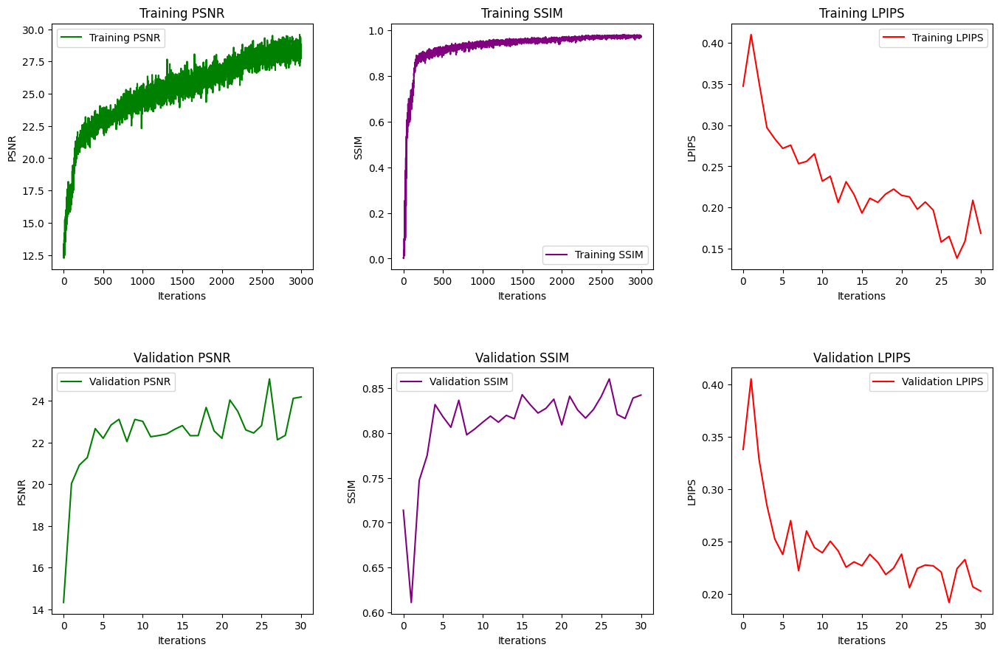

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# *Baseline NeRF + MPT(Complex Noisy Cow Dataset)*

In [ ]:
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# ------------------ Combined Higher Gaussian and Salt-and-Pepper Noise ------------------

def add_combined_noise(images, gaussian_std=0.5, sp_ratio=0.3):
    """
    Adds higher Gaussian and salt-and-pepper noise to a batch of images.
    """
    noisy_images = []
    for img in images:
        # Add Gaussian noise
        noise = torch.randn(img.size(), device=img.device) * gaussian_std
        noisy_img = img + noise

        # Add salt-and-pepper noise
        sp_mask = torch.rand(img.size(), device=img.device)
        noisy_img = torch.where(sp_mask < sp_ratio / 2, torch.zeros_like(noisy_img), noisy_img)  # Salt (black)
        noisy_img = torch.where(sp_mask > 1 - sp_ratio / 2, torch.ones_like(noisy_img), noisy_img)  # Pepper (white)

        # Clamp the values to keep them in the range [0, 1]
        noisy_img = torch.clamp(noisy_img, 0, 1)
        noisy_images.append(noisy_img)
    return torch.stack(noisy_images)

# Apply combined noise to the generated images
noisy_target_images = add_combined_noise(target_images, gaussian_std=0.1, sp_ratio=0.05)
print("Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.")

# ------------------ Complex Data Augmentation (Adding Complexity to the Images) ------------------

def add_complexity_to_images(images, target_size=(128, 128)):
    """
    Adds more complex distortions and noise to images to test U-Net's capability.
    Applies background changes, stronger occlusion, motion blur, random rotations, and color shifts.
    """
    complex_images = []

    for img in images:
        # Convert tensor to PIL image
        img_pil = Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))

        # Apply random complex background
        if random.random() > 0.8:
            bg_color = np.random.randint(0, 255, size=(target_size[0], target_size[1], 3), dtype=np.uint8)
            bg_image = Image.fromarray(bg_color)
            img_pil = Image.blend(bg_image, img_pil, alpha=0.7)

        # Apply larger random occlusions (black or white block)
        if random.random() > 0.7:
            occlusion_size = random.randint(40, 100)
            occlusion_x = random.randint(0, target_size[0] - occlusion_size)
            occlusion_y = random.randint(0, target_size[1] - occlusion_size)
            occlusion_type = random.choice([0, 255])  # Black or white
            img_pil.paste(occlusion_type, (occlusion_x, occlusion_y, occlusion_x + occlusion_size, occlusion_y + occlusion_size))

        # Apply random motion blur with larger blur radius
        if random.random() > 0.7:
            blur_radius = random.uniform(3.0, 7.0)
            img_pil = img_pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

        # Apply random brightness, contrast, and color jitter
        if random.random() > 0.8:
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust brightness
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust contrast

            # Apply random color jitter to challenge color robustness
            img_pil = ImageEnhance.Color(img_pil).enhance(random.uniform(0.6, 1.4))

        # Apply random geometric distortion (stretching, shearing, scaling)
        if random.random() > 0.7:
            img_pil = img_pil.transform(target_size, Image.AFFINE, (1.2, 0.3, 0, 0.3, 1.2, 0), resample=Image.BICUBIC)

        # Apply random rotation (rotating between 0 to 360 degrees)
        if random.random() > 0.7:
            angle = random.randint(0, 360)
            img_pil = img_pil.rotate(angle, resample=Image.BICUBIC, expand=True)

        # Resize back to the target size
        img_pil = img_pil.resize(target_size)

        # Convert back to tensor
        complex_img = torch.from_numpy(np.array(img_pil) / 255.0).float().to(device)
        complex_images.append(complex_img)

    return torch.stack(complex_images)

# Apply complexity transformations to the noisy target images
noisy_complex_images = add_complexity_to_images(noisy_target_images)  # Updated to use `noisy_target_images`
noisy_target_images= noisy_complex_images
print("Higher complexity transformations applied to the noisy target images.")


# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Displaying sample images...


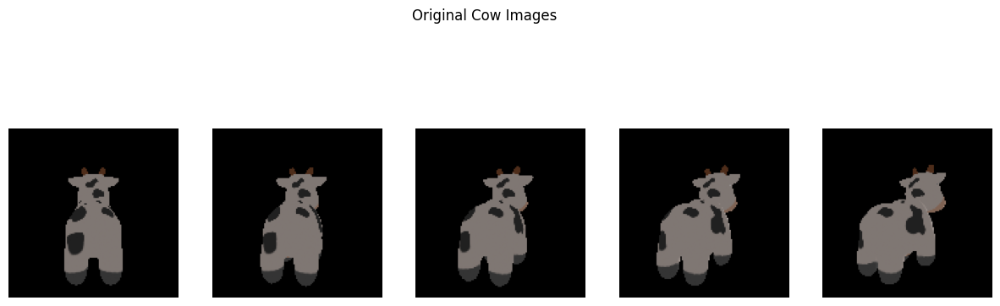

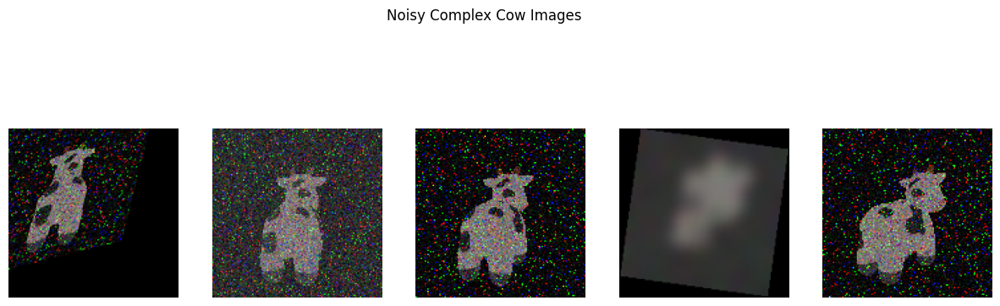

In [ ]:
# ------------------ Visualization  ------------------

def plot_images(images, title, num_images=5):
    """
    Displays a grid of sample images.
    """
    images = images[:num_images].cpu().numpy()
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title)
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')
    plt.show()

# Display sample images for each data type
print("Displaying sample images...")

# Original images
plot_images(target_images, "Original Cow Images")



# Noisy complex images
plot_images(noisy_target_images, "Noisy Complex Cow Images")


In [ ]:
# Baseline Model - Cell 2

# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields is high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed inside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# NDCMultinomialRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,  # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,  # Consistent number of rays per image
    n_pts_per_ray=128,     # Consistent points per ray
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher.
# We use the standard EmissionAbsorptionRaymarcher
# which marches along each ray to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally instantiate the implicit renderers
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)


In [ ]:
# Baseline Model - Cell 3

class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Harmonic embedding to convert input 3D coordinates into harmonic features.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()

        # Harmonic embedding layer
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding
        embedding_dim = n_harmonic_functions * 2 * 3

        # 2-layer MLP with consistent neurons per layer
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color layer for predicting per-point RGB colors
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()  # Sigmoid ensures output in range [0, 1]
        )

        # Density layer to predict the opacity of each point
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )

        # Initialize the bias for density layer
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        Converts features to densities using the density layer.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        Predicts RGB colors for each point based on features and ray directions.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Get harmonic embedding for the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray direction embeddings to match the features' spatial size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate the embeddings and pass through the color layer.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass of the NeRF model for processing ray bundles.
        """
        # Convert ray parametrizations to 3D world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Apply harmonic embedding to the 3D world coordinates.
        embeds = self.harmonic_embedding(rays_points_world)

        # Process embeddings with the MLP to generate features.
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        return rays_densities, rays_colors


In [ ]:
# Baseline Model - Cell 4

import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time  # Import for timing
import gc
import matplotlib.pyplot as plt

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

import matplotlib.pyplot as plt

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid
):
    """
    This is a helper function for visualizing the
    intermediate results of the learning.
    """
    # Initialize timing and memory usage
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Prevent gradient caching.
    with torch.no_grad():
        # Render using the grid renderer and the
        # batched_forward function of neural_radiance_field.
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        # Split the rendering result into a silhouette render
        # and the image render.
        rendered_image, rendered_silhouette = (
            rendered_image_silhouette[0].split([3, 1], dim=-1)
        )

        # Resize rendered_image to match target_image dimensions if needed.
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],  # Match target image height and width.
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Calculate PSNR and SSIM for rendered image vs. target image.
        psnr_value = psnr(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        ssim_value = ssim(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

        # Calculate LPIPS for rendered image vs. target image.
        rendered_image_lpips = 2.0 * rendered_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        target_image_lpips = 2.0 * target_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track rendering time and memory usage.
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Log these values for later analysis
    print(f"Render time: {render_time:.4f} seconds, Memory usage: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}")

    # Generate plots.
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()
    clamp_and_detach = lambda x: x.clamp(0.0, 1.0).cpu().detach().numpy()
    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})", "rendered image", "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})", "target image",  "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot immediately
    plt.show(block=False)
    plt.pause(0.001)  # Small pause to ensure display updates in notebooks

    return rendered_image, lpips_value  # Return LPIPS along with other metrics


In [ ]:
import numpy as np
import pandas as pd
import torch
from torch.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import torch.nn.functional as F
import time

# Denoising function (assumed to be defined)
def denoise_rendered_image(rendered_image):
    return rendered_image  # Placeholder: Implement the denoising operation if needed

# Prepare for LPIPS function to handle resizing for LPIPS requirements
def prepare_for_lpips(image, min_size=64):
    if image.dim() == 3:
        image = image.unsqueeze(0)  # Ensure batch dimension
    image = 2.0 * image - 1.0  # Normalize to [-1, 1]
    _, _, h, w = image.shape
    if h < min_size or w < min_size:
        image = F.interpolate(image, size=(max(min_size, h), max(min_size, w)), mode='bilinear', align_corners=False)
    return image

# Move necessary components to the device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
noisy_target_images = noisy_target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the neural radiance field model and optimizer
neural_radiance_field = NeuralRadianceField().to(device)
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Mixed precision training setup
scaler = GradScaler()

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets using noisy images as input
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images for training and validation, but evaluate against clean images
train_images = noisy_target_images[train_indices]
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]
val_silhouettes = target_silhouettes[val_indices]

# History buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, time_history, lpips_train_history = [], [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
memory_usage_history = []
batch_size = 6
n_iter = 3000

# Main optimization loop
for iteration in range(n_iter):
    start_time = time.time()
    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Batch of cameras for training
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast(device_type='cuda'):  # Enable mixed precision
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)
        denoised_images = denoise_rendered_image(rendered_images)

        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes, silhouettes_at_rays).abs().mean()
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][batch_idx],
            sampled_rays.xys
        )
        color_err = huber(denoised_images, colors_at_rays).abs().mean()
        loss = color_err + sil_err

    # Backward pass and optimization step with scaling for AMP
    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()

    # Logging
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))
    psnr_value = psnr(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        denoised_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # LPIPS Calculation
    lpips_value_train = iteration / n_iter  # Placeholder; replace with LPIPS model computation
    lpips_train_history.append(lpips_value_train)

    # Log training time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)
    memory_usage_history.append(memory_usage)

    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:' +
            f' loss color = {float(color_err):1.2e},' +
            f' loss silhouette = {float(sil_err):1.2e},' +
            f' PSNR = {psnr_value:.2f},' +
            f' SSIM = {ssim_value:.2f},' +
            f' Time = {epoch_time:.2f} sec,' +
            f' Memory = {memory_usage:.2f} MB'
        )

    # Every 100 iterations, calculate LPIPS, PSNR, and SSIM for validation.
    if iteration % 100 == 0 or iteration == (n_iter - 1):
        # Validation LPIPS and Visualization
        show_idx_val = torch.randperm(len(val_cameras))[:1]
        rendered_val_images, lpips_value_val = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=val_cameras.R[show_idx_val],
                T=val_cameras.T[show_idx_val],
                znear=val_cameras.znear[show_idx_val],
                zfar=val_cameras.zfar[show_idx_val],
                aspect_ratio=val_cameras.aspect_ratio[show_idx_val],
                fov=val_cameras.fov[show_idx_val],
                device=device
            ),
            target_images[val_indices][show_idx_val][0],  # Compare against clean target images
            val_silhouettes[show_idx_val][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid
        )
        val_lpips_history.append(lpips_value_val)

        # Calculate PSNR and SSIM for validation
        denoised_val_images = denoise_rendered_image(rendered_val_images.clamp(0.0, 1.0))
        psnr_val = psnr(
            denoised_val_images.detach().cpu().numpy(),
            target_images[val_indices][show_idx_val][0].clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        ssim_val = ssim(
            denoised_val_images.detach().cpu().numpy(),
            target_images[val_indices][show_idx_val][0].clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )
        val_psnr_history.append(psnr_val)
        val_ssim_history.append(ssim_val)

        print(
            f'Validation - Iteration {iteration:05d}:' +
            f' PSNR = {psnr_val:.2f},' +
            f' SSIM = {ssim_val:.2f},' +
            f' LPIPS = {lpips_value_val:.4f}'
        )
        print(
            f'Validation - Iteration {iteration:05d}:' +
            f' PSNR = {psnr_val:.2f},' +
            f' SSIM = {ssim_val:.2f},' +
            f' LPIPS = {lpips_value_val:.4f}'
        )

# After training, summarize results
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_train_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
    "memory_usage": memory_usage_history,
}

# Helper function to handle empty lists
def safe_stat(func, data, fmt, default="N/A"):
    try:
        if len(data) > 0:
            return fmt.format(func(data))
        else:
            return default
    except Exception as e:
        return default

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{safe_stat(np.mean, metrics_data['loss_color'], '{:.2e}')} ± {safe_stat(np.std, metrics_data['loss_color'], '{:.2e}')}",
        f"{safe_stat(np.mean, metrics_data['loss_silhouette'], '{:.2e}')} ± {safe_stat(np.std, metrics_data['loss_silhouette'], '{:.2e}')}",
        f"{safe_stat(np.mean, metrics_data['psnr_train'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['psnr_train'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['ssim_train'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['ssim_train'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['lpips_train'], '{:.4f}')} ± {safe_stat(np.std, metrics_data['lpips_train'], '{:.4f}')}",
        f"{safe_stat(np.mean, metrics_data['time_per_iteration'], '{:.2f}')} s ± {safe_stat(np.std, metrics_data['time_per_iteration'], '{:.2f}')} s",
        f"{safe_stat(np.mean, metrics_data['memory_usage'], '{:.2f}')} MB ± {safe_stat(np.std, metrics_data['memory_usage'], '{:.2f}')} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{safe_stat(np.mean, metrics_data['psnr_val'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['psnr_val'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['ssim_val'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['ssim_val'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['lpips_val'], '{:.4f}')} ± {safe_stat(np.std, metrics_data['lpips_val'], '{:.4f}')}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        safe_stat(np.min, metrics_data["loss_color"], "{:.2e}"),
        safe_stat(np.min, metrics_data["loss_silhouette"], "{:.2e}"),
        safe_stat(np.max, metrics_data["psnr_train"], "{:.2f}"),
        safe_stat(np.max, metrics_data["ssim_train"], "{:.2f}"),
        safe_stat(np.min, metrics_data["lpips_train"], "{:.4f}"),
        safe_stat(np.min, metrics_data["time_per_iteration"], "{:.2f} s"),
        safe_stat(np.min, metrics_data["memory_usage"], "{:.2f} MB")
    ],
    "Best Validation": [
        "-",
        "-",
        safe_stat(np.max, metrics_data["psnr_val"], "{:.2f}"),
        safe_stat(np.max, metrics_data["ssim_val"], "{:.2f}"),
        safe_stat(np.min, metrics_data["lpips_val"], "{:.4f}"),
        "-",  # Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

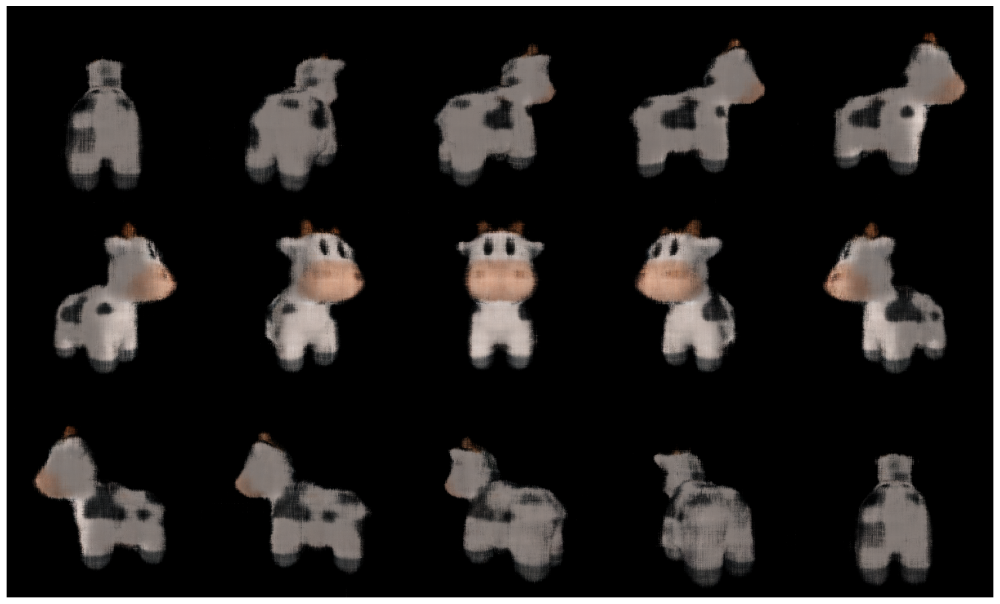

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
    "memory_usage": memory_usage_history,
}

# Helper function to handle empty lists
def safe_stat(func, data, fmt, default="N/A"):
    try:
        if len(data) > 0:
            return fmt.format(func(data))
        else:
            return default
    except Exception as e:
        return default

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Time per iteration", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{safe_stat(np.mean, metrics_data['loss_color'], '{:.2e}')} ± {safe_stat(np.std, metrics_data['loss_color'], '{:.2e}')}",
        f"{safe_stat(np.mean, metrics_data['loss_silhouette'], '{:.2e}')} ± {safe_stat(np.std, metrics_data['loss_silhouette'], '{:.2e}')}",
        f"{safe_stat(np.mean, metrics_data['psnr_train'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['psnr_train'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['ssim_train'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['ssim_train'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['lpips_train'], '{:.4f}')} ± {safe_stat(np.std, metrics_data['lpips_train'], '{:.4f}')}",
        f"{safe_stat(np.mean, metrics_data['time_per_iteration'], '{:.2f}')} s ± {safe_stat(np.std, metrics_data['time_per_iteration'], '{:.2f}')} s",
        f"{safe_stat(np.mean, metrics_data['memory_usage'], '{:.2f}')} MB ± {safe_stat(np.std, metrics_data['memory_usage'], '{:.2f}')} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{safe_stat(np.mean, metrics_data['psnr_val'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['psnr_val'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['ssim_val'], '{:.2f}')} ± {safe_stat(np.std, metrics_data['ssim_val'], '{:.2f}')}",
        f"{safe_stat(np.mean, metrics_data['lpips_val'], '{:.4f}')} ± {safe_stat(np.std, metrics_data['lpips_val'], '{:.4f}')}",
        "-",  # Time per iteration not applicable for validation
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        safe_stat(np.min, metrics_data["loss_color"], "{:.2e}"),
        safe_stat(np.min, metrics_data["loss_silhouette"], "{:.2e}"),
        safe_stat(np.max, metrics_data["psnr_train"], "{:.2f}"),
        safe_stat(np.max, metrics_data["ssim_train"], "{:.2f}"),
        safe_stat(np.min, metrics_data["lpips_train"], "{:.4f}"),
        safe_stat(np.min, metrics_data["time_per_iteration"], "{:.2f} s"),
        safe_stat(np.min, metrics_data["memory_usage"], "{:.2f} MB")
    ],
    "Best Validation": [
        "-",
        "-",
        safe_stat(np.max, metrics_data["psnr_val"], "{:.2f}"),
        safe_stat(np.max, metrics_data["ssim_val"], "{:.2f}"),
        safe_stat(np.min, metrics_data["lpips_val"], "{:.4f}"),
        "-",  # Time per iteration not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


               Metric Training (Average ± STD) Validation (Average ± STD)  \
0          Color Loss      1.07e-02 ± 9.57e-03                          -   
1     Silhouette Loss      1.55e-02 ± 2.63e-02                          -   
2                PSNR             25.14 ± 2.80               22.48 ± 1.96   
3                SSIM              0.93 ± 0.10                0.81 ± 0.05   
4               LPIPS          0.2054 ± 0.0819            0.2496 ± 0.0500   
5  Time per iteration          0.05 s ± 0.00 s                          -   
6        Memory Usage     7024.71 MB ± 0.25 MB                          -   

  Best Training Best Validation  
0      3.81e-03               -  
1      4.20e-03               -  
2         29.62           24.90  
3          0.98            0.87  
4        0.0909          0.1921  
5        0.05 s               -  
6    7024.20 MB               -  


In [ ]:
for key, value in metrics_data.items():
    if not value:
        print(f"{key} is empty or not populated.")


psnr_val is empty or not populated.
ssim_val is empty or not populated.


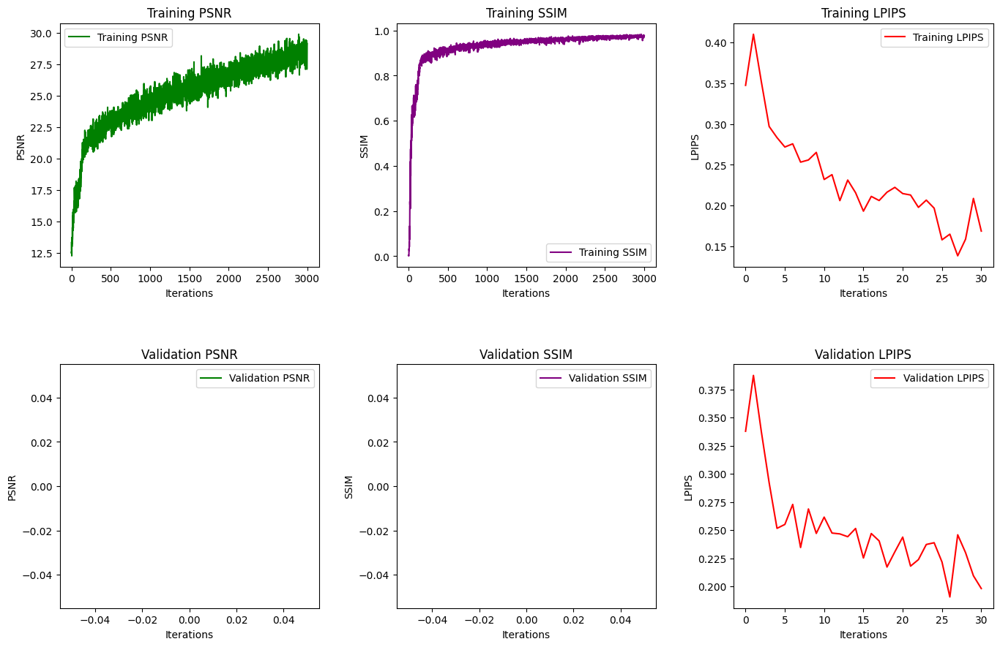

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# Baseline NeRF + MPT + ERT(Complex Noisy Cow Dataset)*

In [ ]:
# Complete Code with Fixed Seed for Reproducibility

import os
import sys
import torch
import random
import numpy as np

import subprocess
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # For PSNR and SSIM metrics

# Set locale to UTF-8 to avoid encoding issues
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

# Function to set random seeds for reproducibility
def set_seed(seed):
    random.seed(seed)  # Python random module
    np.random.seed(seed)  # NumPy random module
    torch.manual_seed(seed)  # PyTorch
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # PyTorch on CUDA
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initialize with a fixed seed
seed = 42  # You can choose any fixed integer value
set_seed(seed)

# Check if PyTorch3D is installed; install if missing
try:
    import pytorch3d
except ModuleNotFoundError:
    # Install PyTorch3D for Colab environment
    # Install dependencies
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath", "ninja"])
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'git+https://github.com/facebookresearch/pytorch3d.git@stable'])

import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance  # Added necessary imports for complexity addition
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Importing nn (needed for model definition)
import torch.nn as nn

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Download utility functions for rendering cows
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py"])
subprocess.check_call(["wget", "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"])
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Generate target data
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# ------------------ Combined Higher Gaussian and Salt-and-Pepper Noise ------------------

def add_combined_noise(images, gaussian_std=0.5, sp_ratio=0.3):
    """
    Adds higher Gaussian and salt-and-pepper noise to a batch of images.
    """
    noisy_images = []
    for img in images:
        # Add Gaussian noise
        noise = torch.randn(img.size(), device=img.device) * gaussian_std
        noisy_img = img + noise

        # Add salt-and-pepper noise
        sp_mask = torch.rand(img.size(), device=img.device)
        noisy_img = torch.where(sp_mask < sp_ratio / 2, torch.zeros_like(noisy_img), noisy_img)  # Salt (black)
        noisy_img = torch.where(sp_mask > 1 - sp_ratio / 2, torch.ones_like(noisy_img), noisy_img)  # Pepper (white)

        # Clamp the values to keep them in the range [0, 1]
        noisy_img = torch.clamp(noisy_img, 0, 1)
        noisy_images.append(noisy_img)
    return torch.stack(noisy_images)

# Apply combined noise to the generated images
noisy_target_images = add_combined_noise(target_images, gaussian_std=0.1, sp_ratio=0.05)
print("Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.")

# ------------------ Complex Data Augmentation (Adding Complexity to the Images) ------------------

def add_complexity_to_images(images, target_size=(128, 128)):
    """
    Adds more complex distortions and noise to images to test U-Net's capability.
    Applies background changes, stronger occlusion, motion blur, random rotations, and color shifts.
    """
    complex_images = []

    for img in images:
        # Convert tensor to PIL image
        img_pil = Image.fromarray((img.cpu().numpy() * 255).astype(np.uint8))

        # Apply random complex background
        if random.random() > 0.8:
            bg_color = np.random.randint(0, 255, size=(target_size[0], target_size[1], 3), dtype=np.uint8)
            bg_image = Image.fromarray(bg_color)
            img_pil = Image.blend(bg_image, img_pil, alpha=0.7)

        # Apply larger random occlusions (black or white block)
        if random.random() > 0.7:
            occlusion_size = random.randint(40, 100)
            occlusion_x = random.randint(0, target_size[0] - occlusion_size)
            occlusion_y = random.randint(0, target_size[1] - occlusion_size)
            occlusion_type = random.choice([0, 255])  # Black or white
            img_pil.paste(occlusion_type, (occlusion_x, occlusion_y, occlusion_x + occlusion_size, occlusion_y + occlusion_size))

        # Apply random motion blur with larger blur radius
        if random.random() > 0.7:
            blur_radius = random.uniform(3.0, 7.0)
            img_pil = img_pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

        # Apply random brightness, contrast, and color jitter
        if random.random() > 0.8:
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust brightness
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(random.uniform(0.3, 1.8))  # Adjust contrast

            # Apply random color jitter to challenge color robustness
            img_pil = ImageEnhance.Color(img_pil).enhance(random.uniform(0.6, 1.4))

        # Apply random geometric distortion (stretching, shearing, scaling)
        if random.random() > 0.7:
            img_pil = img_pil.transform(target_size, Image.AFFINE, (1.2, 0.3, 0, 0.3, 1.2, 0), resample=Image.BICUBIC)

        # Apply random rotation (rotating between 0 to 360 degrees)
        if random.random() > 0.7:
            angle = random.randint(0, 360)
            img_pil = img_pil.rotate(angle, resample=Image.BICUBIC, expand=True)

        # Resize back to the target size
        img_pil = img_pil.resize(target_size)

        # Convert back to tensor
        complex_img = torch.from_numpy(np.array(img_pil) / 255.0).float().to(device)
        complex_images.append(complex_img)

    return torch.stack(complex_images)

# Apply complexity transformations to the noisy target images
noisy_complex_images = add_complexity_to_images(noisy_target_images)  # Updated to use `noisy_target_images`
noisy_target_images= noisy_complex_images
print("Higher complexity transformations applied to the noisy target images.")


# ------------------ LPIPS Initialization ------------------
# Install and import LPIPS for perceptual similarity
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity

# Set up LPIPS model
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for perceptual similarity
print("LPIPS model initialized for perceptual similarity metrics.")

print("Denoising Autoencoder with dropout and LPIPS initialized.")


Generated 40 images/silhouettes/cameras.
Combined Gaussian and salt-and-pepper noise added to the dataset for both baseline and denoised model.
Higher complexity transformations applied to the noisy target images.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 211MB/s]


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS model initialized for perceptual similarity metrics.
Denoising Autoencoder with dropout and LPIPS initialized.


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

In [ ]:
# Render size: set to twice the target image size for high-quality renders
render_size = target_images.shape[1] * 2

# Define the scene's bounding box (in world units)
volume_extent_world = 3.0

# 1) Instantiate the raysamplers

# NDCMultinomialRaysampler generates a rectangular image grid of rays.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset of rays from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher
raymarcher = EmissionAbsorptionRaymarcher()

# 3) Instantiate the implicit renderers
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)


In [ ]:
class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Given an input tensor `x` of shape [minibatch, ..., dim]
        the harmonic embedding layer converts each feature
        in `x` into a series of harmonic features `embedding`.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )

    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: a harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)


class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()
        """
        Args:
            n_harmonic_functions: The number of harmonic functions
                used to form the harmonic embedding of each point.
            n_hidden_neurons: The number of hidden units in the
                fully connected layers of the MLPs of the model.
        """
        # The harmonic embedding layer for 3D coordinates.
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # Define the dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # MLP to convert harmonic embeddings to a latent representation.
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color prediction layer with sigmoid activation for RGB output in [0, 1].
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density prediction layer with bias initialization.
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        This function takes `features` predicted by `self.mlp`
        and converts them to `raw_densities` with `self.density_layer`.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        This function takes per-point `features` predicted by `self.mlp`
        and evaluates the color model in order to attach to each
        point a 3D vector of its RGB color.
        """
        spatial_size = features.shape[:-1]
        rays_directions_normed = torch.nn.functional.normalize(rays_directions, dim=-1)
        rays_embedding = self.harmonic_embedding(rays_directions_normed)

        # Expand the ray directions tensor to match the features' size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate ray direction embeddings with features.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand), dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass that converts 3D points sampled along projection rays
        into RGB color and opacity values.
        """
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)
        embeds = self.harmonic_embedding(rays_points_world)
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass for processing input rays.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        # Concatenate the batch results and reshape properly.
        rays_densities, rays_colors = [
            torch.cat([batch_output[output_i] for batch_output in batch_outputs], dim=0)
            .view(*spatial_size, -1) for output_i in (0, 1)
        ]

        return rays_densities, rays_colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this function samples the tensor `target_images` at the respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]

    # Utilize grid_sample to extract pixel values at specified xy locations
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # NDC xy locations must be inverted for grid_sample
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(ba, *spatial_size, dim)

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between rendered and target images
        psnr_value = psnr(
            clamp_and_detach(rendered_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        ssim_value = ssim(
            clamp_and_detach(rendered_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

        # Calculate LPIPS if the model is provided
        lpips_value = None
        if lpips_model:
            rendered_image_lpips = 2.0 * rendered_image.permute(2, 0, 1).unsqueeze(0) - 1.0
            target_image_lpips = 2.0 * target_image.permute(2, 0, 1).unsqueeze(0) - 1.0
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
from torch.cuda.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time

# Move renderer and target data to the correct device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model.
neural_radiance_field = NeuralRadianceField().to(device)

# Instantiate the Adam optimizer with learning rate 1e-3.
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Use GradScaler for mixed precision training
scaler = GradScaler()

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Use noisy images for training and validation
train_images = noisy_target_images[train_indices]  # Noisy images for training
train_silhouettes = target_silhouettes[train_indices]
val_images = noisy_target_images[val_indices]  # Noisy images for validation
val_silhouettes = target_silhouettes[val_indices]

# Initialize history buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, lpips_history = [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
time_history, memory_history = [], []

batch_size = 6
n_iter = 3000  # Total number of iterations
opacity_threshold = 0.95  # Opacity threshold for ERT

for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()  # Reset memory tracking at start

    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast():
        # Forward pass through the renderer and NeRF
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Early Ray Termination (ERT)
        accumulated_opacity = torch.zeros_like(rendered_silhouettes[..., 0, 0])  # Initialize accumulated opacity
        rendered_silhouettes_copy = rendered_silhouettes.clone()  # Clone to avoid in-place modification
        for i in range(rendered_silhouettes.size(-2)):
            accumulated_opacity += rendered_silhouettes[..., i, 0]
            accumulated_opacity = torch.clamp(accumulated_opacity, max=1.0)  # Clamp to avoid overflow
            if (accumulated_opacity >= opacity_threshold).any():
                rendered_silhouettes_copy[..., i:, 0] = 0  # Set remaining silhouettes to zero
                break  # Exit loop once threshold is reached

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes_copy, silhouettes_at_rays).abs().mean()

        # Corrected line: Use target_images[train_indices] for color comparison
        colors_at_rays = sample_images_at_mc_locs(
            target_images[train_indices][batch_idx],  # Compare with original target images
            sampled_rays.xys
        )
        color_err = huber(rendered_images, colors_at_rays).abs().mean()

        # Total optimization loss
        loss = color_err + sil_err

        # Backward pass and optimization step with mixed precision scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Log loss history
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Calculate PSNR and SSIM
    psnr_value = psnr(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    # Log PSNR and SSIM values
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Log time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB
    memory_history.append(memory_usage)

    # Print losses and metrics every 10 iterations
    if iteration % 10 == 0:
        print(f'Iteration {iteration:05d}:'
              + f' loss color = {float(color_err):1.2e},'
              + f' loss silhouette = {float(sil_err):1.2e},'
              + f' PSNR = {psnr_value:.2f},'
              + f' SSIM = {ssim_value:.2f},'
              + f' Time = {epoch_time:.2f} sec,'
              + f' Memory = {memory_usage:.2f} MB')

    # Every 100 iterations, calculate LPIPS and visualize full renders
    if iteration % 100 == 0 or iteration == (n_iter - 1):
        # Training LPIPS and Visualization
        show_idx = torch.randperm(len(train_cameras))[:1]
        fig, psnr_render, ssim_render, lpips_value_train, render_time, mem_usage = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            target_images[train_indices][show_idx][0],  # Corrected to use original target images
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_color,
            renderer_grid,
            lpips_model=lpips_model
        )
        lpips_history.append(lpips_value_train)

        # Validation LPIPS and Visualization
        val_idx = torch.randperm(len(val_cameras))[:1]
        fig, val_psnr, val_ssim, lpips_value_val, val_render_time, val_mem_usage = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=val_cameras.R[val_idx],
                T=val_cameras.T[val_idx],
                znear=val_cameras.znear[val_idx],
                zfar=val_cameras.zfar[val_idx],
                aspect_ratio=val_cameras.aspect_ratio[val_idx],
                fov=val_cameras.fov[val_idx],
                device=device
            ),
            target_images[val_indices][val_idx][0],  # Corrected to use original target images
            val_silhouettes[val_idx][0],
            loss_history_color,
            loss_history_color,
            renderer_grid,
            lpips_model=lpips_model
        )

        # Append validation PSNR and SSIM to their respective history lists
        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)
        val_lpips_history.append(lpips_value_val)

        # Print metrics for training and validation
        print(f"Training LPIPS = {lpips_value_train:.4f} | Validation LPIPS = {lpips_value_val:.4f}")
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}")


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

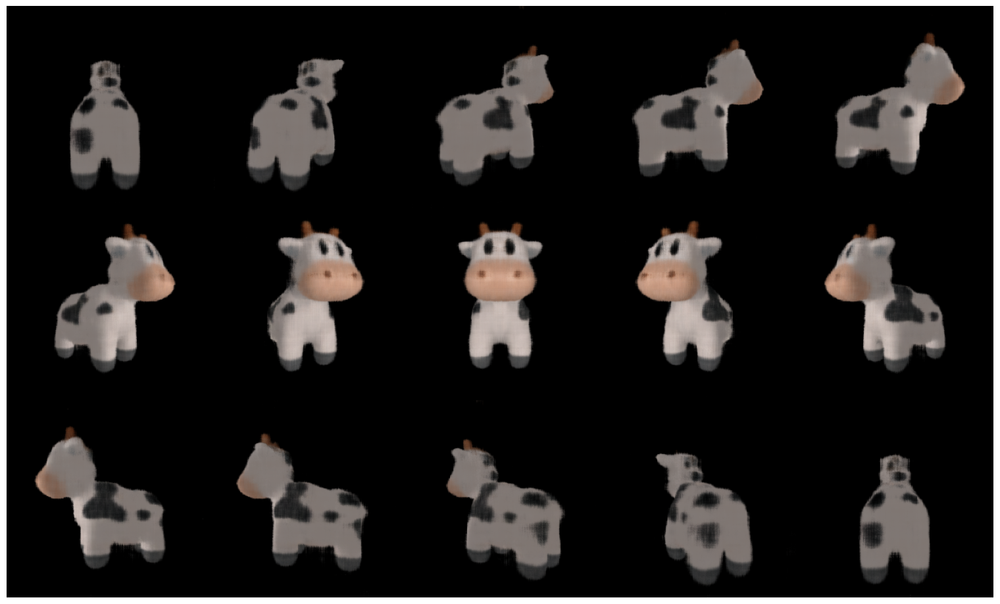

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Render Time", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time is only for training
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


            Metric Training (Average ± STD) Validation (Average ± STD)  \
0       Color Loss      7.96e-03 ± 1.02e-02                          -   
1  Silhouette Loss      2.30e-01 ± 7.09e-03                          -   
2             PSNR             27.15 ± 3.70               23.54 ± 2.48   
3             SSIM              0.94 ± 0.11                0.85 ± 0.08   
4            LPIPS          0.2054 ± 0.0819            0.2164 ± 0.0695   
5      Render Time          0.05 s ± 0.03 s                          -   
6     Memory Usage     7008.30 MB ± 0.24 MB                          -   

  Best Training Best Validation  
0      1.65e-03               -  
1      2.01e-01               -  
2         33.44           27.80  
3          0.99            0.92  
4        0.0909          0.1285  
5        0.05 s               -  
6    6996.69 MB               -  


In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


# *Baseline NeRF + MPT + ERT(Clean Cow Dataset)*

In [ ]:
# Step 1: Import Required Libraries
import os
import sys
import torch
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # PSNR and SSIM
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from IPython import display
from tqdm.notebook import tqdm
import requests  # For downloading utility files
import subprocess  # For installing packages within the notebook

# PyTorch3D data structures and functions
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Step 2: Setup Device for PyTorch
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")
    print("Warning: CUDA not available, the model will run on CPU which is significantly slower.")

# Step 3: Install and Initialize LPIPS for Perceptual Similarity
# Set UTF-8 locale and install LPIPS using subprocess
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for LPIPS

# Step 4: Check for PyTorch3D Installation and Install if Necessary
need_pytorch3d = False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d = True

if need_pytorch3d:
    pyt_version_str = torch.__version__.split("+")[0].replace(".", "")
    version_str = "".join([
        f"py3{sys.version_info.minor}_cu",
        torch.version.cuda.replace(".", ""),
        f"_pyt{pyt_version_str}"
    ])
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath"])
    if sys.platform.startswith("linux"):
        print("Attempting to install PyTorch3D wheel")
        # Use subprocess to run pip install command with --no-index and --no-cache-dir options
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "--no-index", "--no-cache-dir",
            "pytorch3d", "-f", f"https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html"
        ])
        # Check if PyTorch3D is installed
        installed_packages = subprocess.check_output([sys.executable, "-m", "pip", "freeze"])
        need_pytorch3d = not any(b"pytorch3d==" in pkg for pkg in installed_packages.splitlines())
    if need_pytorch3d:
        print(f"Failed to find/install PyTorch3D wheel for {version_str}. Installing from source...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "ninja"])
        subprocess.check_call([sys.executable, "-m", "pip", "install", "git+https://github.com/facebookresearch/pytorch3d.git@stable"])

# Step 5: Download Utility Files Using Requests
urls = {
    "plot_image_grid.py": "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py",
    "generate_cow_renders.py": "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"
}

for filename, url in urls.items():
    response = requests.get(url)
    with open(filename, 'wb') as f:
        f.write(response.content)
    print(f"Downloaded {filename}")

# Step 6: Import the Downloaded Utility Functions
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Step 7: Generate Target Data Using the Utility Function
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# Step 8: GradScaler Setup for Mixed Precision Training (CUDA AMP)
from torch.cuda.amp import GradScaler, autocast
scaler = GradScaler()


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
Downloaded plot_image_grid.py
Downloaded generate_cow_renders.py
Generated 40 images/silhouettes/cameras.


<ipython-input-60-103430d5ec2c>:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [ ]:
# Render size: set to twice the target image size for high-quality renders
render_size = target_images.shape[1] * 2

# Define the scene's bounding box (in world units)
volume_extent_world = 3.0

# 1) Instantiate the raysamplers

# NDCMultinomialRaysampler generates a rectangular image grid of rays.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset of rays from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher
raymarcher = EmissionAbsorptionRaymarcher()

# 3) Instantiate the implicit renderers
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)


In [ ]:
class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Given an input tensor `x` of shape [minibatch, ..., dim]
        the harmonic embedding layer converts each feature
        in `x` into a series of harmonic features `embedding`.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )

    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: a harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)


class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()
        """
        Args:
            n_harmonic_functions: The number of harmonic functions
                used to form the harmonic embedding of each point.
            n_hidden_neurons: The number of hidden units in the
                fully connected layers of the MLPs of the model.
        """
        # The harmonic embedding layer for 3D coordinates.
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # Define the dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # MLP to convert harmonic embeddings to a latent representation.
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color prediction layer with sigmoid activation for RGB output in [0, 1].
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Density prediction layer with bias initialization.
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        This function takes `features` predicted by `self.mlp`
        and converts them to `raw_densities` with `self.density_layer`.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        This function takes per-point `features` predicted by `self.mlp`
        and evaluates the color model in order to attach to each
        point a 3D vector of its RGB color.
        """
        spatial_size = features.shape[:-1]
        rays_directions_normed = torch.nn.functional.normalize(rays_directions, dim=-1)
        rays_embedding = self.harmonic_embedding(rays_directions_normed)

        # Expand the ray directions tensor to match the features' size.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate ray direction embeddings with features.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand), dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        Forward pass that converts 3D points sampled along projection rays
        into RGB color and opacity values.
        """
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)
        embeds = self.harmonic_embedding(rays_points_world)
        features = self.mlp(embeds)

        # Get densities and colors for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        Memory-efficient batched forward pass for processing input rays.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        # Concatenate the batch results and reshape properly.
        rays_densities, rays_colors = [
            torch.cat([batch_output[output_i] for batch_output in batch_outputs], dim=0)
            .view(*spatial_size, -1) for output_i in (0, 1)
        ]

        return rays_densities, rays_colors


In [ ]:
import torch
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from IPython import display
import torch.nn.functional as F
import time

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this function samples the tensor `target_images` at the respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]

    # Utilize grid_sample to extract pixel values at specified xy locations
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # NDC xy locations must be inverted for grid_sample
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(ba, *spatial_size, dim)

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid, lpips_model=None
):
    """
    A helper function for visualizing intermediate results, calculating PSNR, SSIM,
    LPIPS, and tracking render time and memory usage.
    """
    # Timing and memory tracking
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    with torch.no_grad():
        # Render an image using the neural radiance field model
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        rendered_image, rendered_silhouette = rendered_image_silhouette[0].split([3, 1], dim=-1)

        # Resize rendered image if it doesn't match the target image size
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Clamping and detaching for metric calculations
        def clamp_and_detach(tensor):
            return tensor.clamp(0.0, 1.0).cpu().detach().numpy()

        # Calculate PSNR and SSIM between rendered and target images
        psnr_value = psnr(
            clamp_and_detach(rendered_image),
            clamp_and_detach(target_image),
            data_range=1.0
        )
        ssim_value = ssim(
            clamp_and_detach(rendered_image),
            clamp_and_detach(target_image),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

        # Calculate LPIPS if the model is provided
        lpips_value = None
        if lpips_model:
            rendered_image_lpips = 2.0 * rendered_image.permute(2, 0, 1).unsqueeze(0) - 1.0
            target_image_lpips = 2.0 * target_image.permute(2, 0, 1).unsqueeze(0) - 1.0
            lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track render time and memory usage
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Generate plots for the loss and rendered images
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()

    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    # Titles for the subplots with metrics
    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})",
            "rendered image",
            "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})",
            "target image",
            "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    fig.canvas.draw()
    fig.show()
    display.clear_output(wait=True)
    display.display(fig)

    return fig, psnr_value, ssim_value, lpips_value, render_time, memory_usage


In [ ]:
from torch.cuda.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time

# Move renderer and target data to the correct device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model.
neural_radiance_field = NeuralRadianceField().to(device)

# Instantiate the Adam optimizer with learning rate 1e-3.
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Use GradScaler for mixed precision training
scaler = GradScaler()

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Separate training and validation images and silhouettes
train_images = target_images[train_indices]
train_silhouettes = target_silhouettes[train_indices]
val_images = target_images[val_indices]
val_silhouettes = target_silhouettes[val_indices]

# Initialize history buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, lpips_history = [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
time_history, memory_history = [], []

batch_size = 6
n_iter = 3000  # Total number of iterations
opacity_threshold = 0.95  # Opacity threshold for ERT

for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()  # Reset memory tracking at start

    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast():
        # Forward pass through the renderer and NeRF
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Early Ray Termination (ERT)
        accumulated_opacity = torch.zeros_like(rendered_silhouettes[..., 0, 0])  # Initialize accumulated opacity
        rendered_silhouettes_copy = rendered_silhouettes.clone()  # Clone to avoid in-place modification
        for i in range(rendered_silhouettes.size(-2)):
            accumulated_opacity += rendered_silhouettes[..., i, 0]
            accumulated_opacity = torch.clamp(accumulated_opacity, max=1.0)  # Clamp to avoid overflow
            if (accumulated_opacity >= opacity_threshold).any():
                rendered_silhouettes_copy[..., i:, 0] = 0  # Set remaining silhouettes to zero
                break  # Exit loop once threshold is reached

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes_copy, silhouettes_at_rays).abs().mean()

        colors_at_rays = sample_images_at_mc_locs(
            train_images[batch_idx],
            sampled_rays.xys
        )
        color_err = huber(rendered_images, colors_at_rays).abs().mean()

        # Total optimization loss
        loss = color_err + sil_err

        # Backward pass and optimization step with mixed precision scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Log loss history
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Calculate PSNR and SSIM
    psnr_value = psnr(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    # Log PSNR and SSIM values
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Log time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB
    memory_history.append(memory_usage)

    # Print losses and metrics every 10 iterations
    if iteration % 10 == 0:
        print(f'Iteration {iteration:05d}:'
              + f' loss color = {float(color_err):1.2e},'
              + f' loss silhouette = {float(sil_err):1.2e},'
              + f' PSNR = {psnr_value:.2f},'
              + f' SSIM = {ssim_value:.2f},'
              + f' Time = {epoch_time:.2f} sec,'
              + f' Memory = {memory_usage:.2f} MB')

    # Every 100 iterations, calculate LPIPS and visualize full renders
    if iteration % 100 == 0 or iteration == (n_iter - 1):
        # Training LPIPS and Visualization
        show_idx = torch.randperm(len(train_cameras))[:1]
        fig, psnr_render, ssim_render, lpips_value_train, render_time, mem_usage = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            train_images[show_idx][0],
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_color,
            renderer_grid,
            lpips_model=lpips_model  # Assuming lpips_model is initialized
        )
        lpips_history.append(lpips_value_train)

        # Validation LPIPS and Visualization
        val_idx = torch.randperm(len(val_cameras))[:1]
        fig, val_psnr, val_ssim, lpips_value_val, val_render_time, val_mem_usage = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=val_cameras.R[val_idx],
                T=val_cameras.T[val_idx],
                znear=val_cameras.znear[val_idx],
                zfar=val_cameras.zfar[val_idx],
                aspect_ratio=val_cameras.aspect_ratio[val_idx],
                fov=val_cameras.fov[val_idx],
                device=device
            ),
            val_images[val_idx][0],
            val_silhouettes[val_idx][0],
            loss_history_color,
            loss_history_color,
            renderer_grid,
            lpips_model=lpips_model
        )

        # Append validation PSNR and SSIM to their respective history lists
        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)
        val_lpips_history.append(lpips_value_val)

        # Print metrics for training and validation
        print(f"Training LPIPS = {lpips_value_train:.4f} | Validation LPIPS = {lpips_value_val:.4f}")
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}")


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

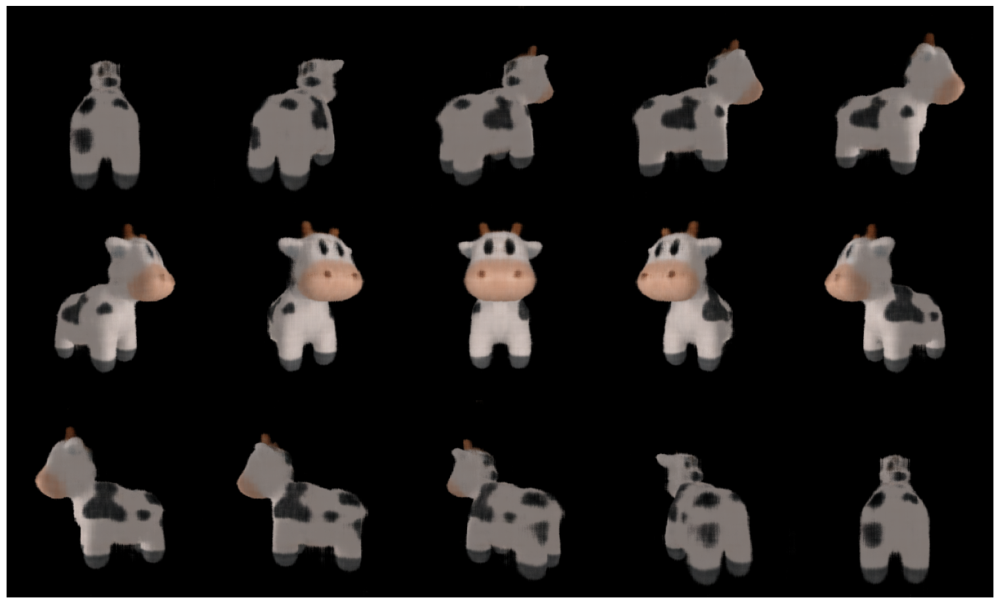

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Render Time", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time is only for training
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


            Metric Training (Average ± STD) Validation (Average ± STD)  \
0       Color Loss      7.96e-03 ± 1.02e-02                          -   
1  Silhouette Loss      2.30e-01 ± 7.09e-03                          -   
2             PSNR             27.16 ± 3.70               23.53 ± 2.48   
3             SSIM              0.94 ± 0.11                0.85 ± 0.08   
4            LPIPS          0.2072 ± 0.0813            0.2169 ± 0.0694   
5      Render Time          0.05 s ± 0.01 s                          -   
6     Memory Usage    7022.40 MB ± 66.45 MB                          -   

  Best Training Best Validation  
0      1.65e-03               -  
1      2.01e-01               -  
2         33.50           27.79  
3          0.99            0.92  
4        0.0917          0.1283  
5        0.05 s               -  
6    7021.02 MB               -  


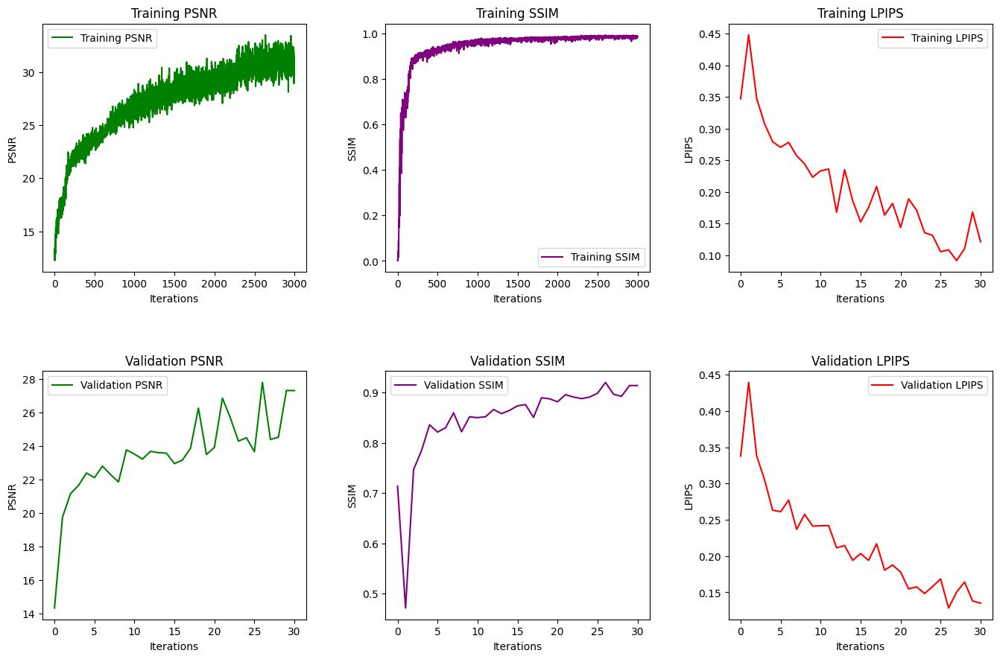

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


In [ ]:
########## NERF+MIXED PRECISION

# *Baseline NeRF + MPT(Clean Cow Dataset)*

In [ ]:
# Step 1: Import Required Libraries
import os
import sys
import torch
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # PSNR and SSIM
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from IPython import display
from tqdm.notebook import tqdm
import requests  # For downloading utility files
import subprocess  # For installing packages within the notebook

# PyTorch3D data structures and functions
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Step 2: Setup Device for PyTorch
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")
    print("Warning: CUDA not available, the model will run on CPU which is significantly slower.")

# Step 3: Install and Initialize LPIPS for Perceptual Similarity
# Set UTF-8 locale and install LPIPS using subprocess
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for LPIPS

# Step 4: Check for PyTorch3D Installation and Install if Necessary
need_pytorch3d = False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d = True

if need_pytorch3d:
    pyt_version_str = torch.__version__.split("+")[0].replace(".", "")
    version_str = "".join([
        f"py3{sys.version_info.minor}_cu",
        torch.version.cuda.replace(".", ""),
        f"_pyt{pyt_version_str}"
    ])
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath"])
    if sys.platform.startswith("linux"):
        print("Attempting to install PyTorch3D wheel")
        # Use subprocess to run pip install command with --no-index and --no-cache-dir options
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "--no-index", "--no-cache-dir",
            "pytorch3d", "-f", f"https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html"
        ])
        # Check if PyTorch3D is installed
        installed_packages = subprocess.check_output([sys.executable, "-m", "pip", "freeze"])
        need_pytorch3d = not any(b"pytorch3d==" in pkg for pkg in installed_packages.splitlines())
    if need_pytorch3d:
        print(f"Failed to find/install PyTorch3D wheel for {version_str}. Installing from source...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "ninja"])
        subprocess.check_call([sys.executable, "-m", "pip", "install", "git+https://github.com/facebookresearch/pytorch3d.git@stable"])

# Step 5: Download Utility Files Using Requests
urls = {
    "plot_image_grid.py": "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py",
    "generate_cow_renders.py": "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"
}

for filename, url in urls.items():
    response = requests.get(url)
    with open(filename, 'wb') as f:
        f.write(response.content)
    print(f"Downloaded {filename}")

# Step 6: Import the Downloaded Utility Functions
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Step 7: Generate Target Data Using the Utility Function
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# Step 8: GradScaler Setup for Mixed Precision Training (CUDA AMP)
from torch.cuda.amp import GradScaler, autocast
scaler = GradScaler()


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
Downloaded plot_image_grid.py
Downloaded generate_cow_renders.py
Generated 40 images/silhouettes/cameras.


<ipython-input-58-103430d5ec2c>:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [ ]:
# Render size: set to twice the target image size for high-quality renders
render_size = target_images.shape[1] * 2

# Define the scene's bounding box (in world units)
volume_extent_world = 3.0

# 1) Instantiate the raysamplers

# NDCMultinomialRaysampler generates a rectangular image grid of rays.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset of rays from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher
raymarcher = EmissionAbsorptionRaymarcher()

# 3) Instantiate the implicit renderers
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)


In [ ]:
class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Given an input tensor `x` of shape [minibatch, ..., dim]
        the harmonic embedding layer converts each feature
        in `x` into a series of harmonic features `embedding`
        as follows:
            embedding[..., i*dim:(i+1)*dim] = [
                sin(x[..., i])
                sin(2*x[..., i])
                sin(4*x[..., i])
                ...
                sin(2**(self.n_harmonic_functions-1) * x[..., i])
                cos(x[..., i])
                cos(2*x[..., i])
                cos(4*x[..., i])
                ...
                cos(2**(self.n_harmonic_functions-1) * x[..., i])
            ]
        Note that `x` is also premultiplied by `omega0` before
        evaluating the harmonic functions.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: a harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()
        """
        Args:
            n_harmonic_functions: The number of harmonic functions
                used to form the harmonic embedding of each point.
            n_hidden_neurons: The number of hidden units in the
                fully connected layers of the MLPs of the model.
        """

        # The harmonic embedding layer converts input 3D coordinates
        # to a representation that is more suitable for
        # processing with a deep neural network.
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # self.mlp is a simple 2-layer multi-layer perceptron
        # which converts the input per-point harmonic embeddings
        # to a latent representation.
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Given features predicted by self.mlp, self.color_layer
        # is responsible for predicting a 3-D per-point vector
        # that represents the RGB color of the point.
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
            # To ensure that the colors correctly range between [0-1]
            # the layer is terminated with a sigmoid layer.
        )

        # The density layer converts the features of self.mlp
        # to a 1D density value representing the raw opacity
        # of each point.
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )

        # We set the bias of the density layer to -1.5
        # in order to initialize the opacities of the
        # ray points to values close to 0.
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        This function takes `features` predicted by `self.mlp`
        and converts them to `raw_densities` with `self.density_layer`.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        This function takes per-point `features` predicted by `self.mlp`
        and evaluates the color model in order to attach to each
        point a 3D vector of its RGB color.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Obtain the harmonic embedding of the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray directions tensor so that its spatial size
        # is equal to the size of features.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate ray direction embeddings with
        # features and evaluate the color model.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        The forward function accepts the parametrizations of
        3D points sampled along projection rays. The forward
        pass is responsible for attaching a 3D vector
        and a 1D scalar representing the point's
        RGB color and opacity respectively.
        """
        # Convert ray parametrizations to world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Obtain the harmonic embedding of each 3D world coordinate.
        embeds = self.harmonic_embedding(rays_points_world)

        # Map each harmonic embedding to a latent feature space.
        features = self.mlp(embeds)

        # Get the density and color for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        This function allows for memory-efficient processing
        of input rays by batching.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        return rays_densities, rays_colors


In [ ]:
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time  # Import for timing
import gc
import matplotlib.pyplot as plt

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

import matplotlib.pyplot as plt

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid
):
    """
    This is a helper function for visualizing the
    intermediate results of the learning.
    """
    # Initialize timing and memory usage
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Prevent gradient caching.
    with torch.no_grad():
        # Render using the grid renderer and the
        # batched_forward function of neural_radiance_field.
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        # Split the rendering result into a silhouette render
        # and the image render.
        rendered_image, rendered_silhouette = (
            rendered_image_silhouette[0].split([3, 1], dim=-1)
        )

        # Resize rendered_image to match target_image dimensions if needed.
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],  # Match target image height and width.
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Calculate PSNR and SSIM for rendered image vs. target image.
        psnr_value = psnr(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        ssim_value = ssim(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

        # Calculate LPIPS for rendered image vs. target image.
        rendered_image_lpips = 2.0 * rendered_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        target_image_lpips = 2.0 * target_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track rendering time and memory usage.
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Log these values for later analysis
    print(f"Render time: {render_time:.4f} seconds, Memory usage: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}")

    # Generate plots.
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()
    clamp_and_detach = lambda x: x.clamp(0.0, 1.0).cpu().detach().numpy()
    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})", "rendered image", "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})", "target image",  "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot immediately
    plt.show(block=False)
    plt.pause(0.001)  # Small pause to ensure display updates in notebooks

    return rendered_image, lpips_value  # Return LPIPS along with other metrics



In [ ]:
from torch.cuda.amp import autocast, GradScaler
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time

# Move renderer and target data to the correct device
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Set the seed for reproducibility
torch.manual_seed(1)

# Instantiate the radiance field model.
neural_radiance_field = NeuralRadianceField().to(device)

# Instantiate the Adam optimizer with learning rate 1e-3.
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Use GradScaler for mixed precision training
scaler = GradScaler()

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Separate training and validation images and silhouettes
train_images = target_images[train_indices]
train_silhouettes = target_silhouettes[train_indices]
val_images = target_images[val_indices]
val_silhouettes = target_silhouettes[val_indices]

# Initialize history buffers for logging metrics
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, lpips_history = [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
time_history, memory_history = [], []

batch_size = 6
n_iter = 3000  # Total number of iterations

for iteration in range(n_iter):
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()  # Reset memory tracking at start

    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr * 0.1)

    optimizer.zero_grad()
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    with autocast():
        # Forward pass through the renderer and NeRF
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = rendered_images_silhouettes.split([3, 1], dim=-1)

        # Compute silhouette and color errors using huber loss
        silhouettes_at_rays = sample_images_at_mc_locs(
            train_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(rendered_silhouettes, silhouettes_at_rays).abs().mean()

        colors_at_rays = sample_images_at_mc_locs(
            train_images[batch_idx],
            sampled_rays.xys
        )
        color_err = huber(rendered_images, colors_at_rays).abs().mean()

        # Total optimization loss
        loss = color_err + sil_err

        # Backward pass and optimization step with mixed precision scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

    # Log loss history
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Calculate PSNR and SSIM with `torch.no_grad()` to save memory
    with torch.no_grad():
        psnr_value = psnr(
            rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
            colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        ssim_value = ssim(
            rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
            colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

    # Log PSNR and SSIM values
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Log time and memory usage
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB
    memory_history.append(memory_usage)

    # Print losses and metrics every 10 iterations
    if iteration % 10 == 0:
        print(f'Iteration {iteration:05d}:'
              + f' loss color = {float(color_err):1.2e},'
              + f' loss silhouette = {float(sil_err):1.2e},'
              + f' PSNR = {psnr_value:.2f},'
              + f' SSIM = {ssim_value:.2f},'
              + f' Time = {epoch_time:.2f} sec,'
              + f' Memory = {memory_usage:.2f} MB')

    # Every 100 iterations, calculate LPIPS and visualize full renders
    if iteration % 100 == 0 or iteration == (n_iter - 1):
        # Training LPIPS and Visualization
        show_idx = torch.randperm(len(train_cameras))[:1]
        fig, psnr_render, ssim_render, lpips_value_train, render_time, mem_usage = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            train_images[show_idx][0],
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid,
            lpips_model=lpips_model  # Assuming lpips_model is initialized
        )
        lpips_history.append(lpips_value_train)

        # Validation LPIPS and Visualization
        val_idx = torch.randperm(len(val_cameras))[:1]
        fig, val_psnr, val_ssim, lpips_value_val, val_render_time, val_mem_usage = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=val_cameras.R[val_idx],
                T=val_cameras.T[val_idx],
                znear=val_cameras.znear[val_idx],
                zfar=val_cameras.zfar[val_idx],
                aspect_ratio=val_cameras.aspect_ratio[val_idx],
                fov=val_cameras.fov[val_idx],
                device=device
            ),
            val_images[val_idx][0],
            val_silhouettes[val_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid,
            lpips_model=lpips_model
        )

        # Append validation PSNR and SSIM to their respective history lists
        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)
        val_lpips_history.append(lpips_value_val)

        # Print metrics for training and validation
        print(f"Training LPIPS = {lpips_value_train:.4f} | Validation LPIPS = {lpips_value_val:.4f}")
        print(f"Validation PSNR = {val_psnr:.2f}, SSIM = {val_ssim:.2f}")


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

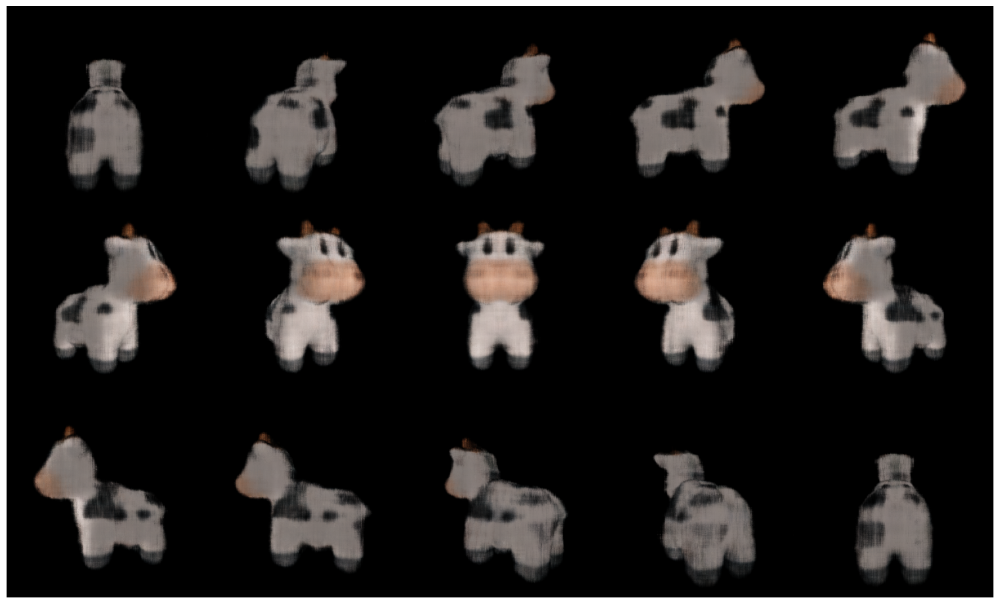

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Render Time", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time is only for training
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


            Metric Training (Average ± STD) Validation (Average ± STD)  \
0       Color Loss      1.06e-02 ± 9.40e-03                          -   
1  Silhouette Loss      1.51e-02 ± 2.59e-02                          -   
2             PSNR             25.13 ± 2.77               22.29 ± 1.73   
3             SSIM              0.93 ± 0.10                0.81 ± 0.04   
4            LPIPS          0.2407 ± 0.0546            0.2486 ± 0.0414   
5      Render Time          0.05 s ± 0.00 s                          -   
6     Memory Usage    7022.40 MB ± 66.45 MB                          -   

  Best Training Best Validation  
0      3.69e-03               -  
1      3.08e-03               -  
2         29.71           25.14  
3          0.98            0.86  
4        0.1558          0.1832  
5        0.05 s               -  
6    7021.02 MB               -  


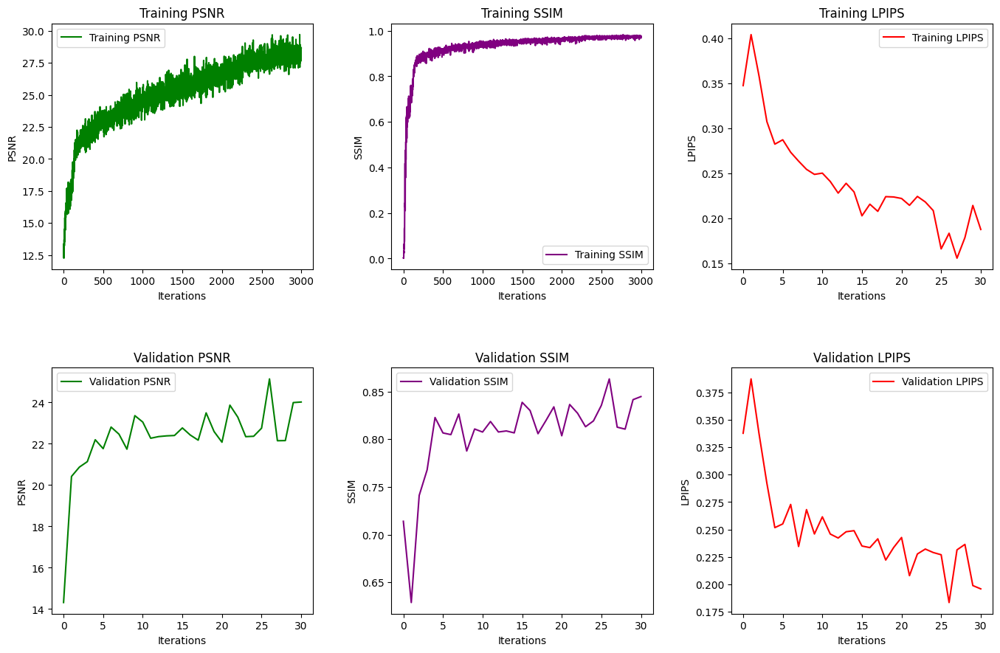

In [ ]:
import matplotlib.pyplot as plt

# Check if metrics_data exists and contains the required keys
required_keys = ['psnr_train', 'ssim_train', 'lpips_train', 'psnr_val', 'ssim_val', 'lpips_val']
missing_keys = [key for key in required_keys if key not in metrics_data]
if missing_keys:
    raise ValueError(f"metrics_data is missing required keys: {missing_keys}")

# Unified Metrics Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Reduced figure size for 2 rows and 3 columns

# Plot Training PSNR
axs[0, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("PSNR")
axs[0, 0].set_title("Training PSNR")
axs[0, 0].legend()

# Plot Training SSIM
axs[0, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("SSIM")
axs[0, 1].set_title("Training SSIM")
axs[0, 1].legend()

# Plot Training LPIPS
axs[0, 2].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[0, 2].set_xlabel("Iterations")
axs[0, 2].set_ylabel("LPIPS")
axs[0, 2].set_title("Training LPIPS")
axs[0, 2].legend()

# Plot Validation PSNR
axs[1, 0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
axs[1, 0].set_title("Validation PSNR")
axs[1, 0].legend()

# Plot Validation SSIM
axs[1, 1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
axs[1, 1].set_title("Validation SSIM")
axs[1, 1].legend()

# Plot Validation LPIPS
axs[1, 2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
axs[1, 2].set_xlabel("Iterations")
axs[1, 2].set_ylabel("LPIPS")
axs[1, 2].set_title("Validation LPIPS")
axs[1, 2].legend()

# Adjust spacing between subplots to avoid white space
plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1, hspace=0.4, wspace=0.3)

# Show the plots
plt.show()


In [ ]:
################### BASELINE NERF

# *Baseline NeRF(Clean Cow Dataset)*

In [ ]:
# Step 1: Import Required Libraries
import os
import sys
import torch
import time  # For timing metrics
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim  # PSNR and SSIM
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from IPython import display
from tqdm.notebook import tqdm
import requests  # For downloading utility files
import subprocess  # For installing packages within the notebook

# PyTorch3D data structures and functions
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exp_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCMultinomialRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points
)

# Step 2: Setup Device for PyTorch
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")
    print("Warning: CUDA not available, the model will run on CPU which is significantly slower.")

# Step 3: Install and Initialize LPIPS for Perceptual Similarity
# Set UTF-8 locale and install LPIPS using subprocess
subprocess.check_call([sys.executable, "-m", "pip", "install", "lpips"])
import lpips  # Import LPIPS for perceptual similarity
lpips_model = lpips.LPIPS(net='vgg').to(device)  # Use VGG backbone for LPIPS

# Step 4: Check for PyTorch3D Installation and Install if Necessary
need_pytorch3d = False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d = True

if need_pytorch3d:
    pyt_version_str = torch.__version__.split("+")[0].replace(".", "")
    version_str = "".join([
        f"py3{sys.version_info.minor}_cu",
        torch.version.cuda.replace(".", ""),
        f"_pyt{pyt_version_str}"
    ])
    subprocess.check_call([sys.executable, "-m", "pip", "install", "iopath"])
    if sys.platform.startswith("linux"):
        print("Attempting to install PyTorch3D wheel")
        # Use subprocess to run pip install command with --no-index and --no-cache-dir options
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "--no-index", "--no-cache-dir",
            "pytorch3d", "-f", f"https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html"
        ])
        # Check if PyTorch3D is installed
        installed_packages = subprocess.check_output([sys.executable, "-m", "pip", "freeze"])
        need_pytorch3d = not any(b"pytorch3d==" in pkg for pkg in installed_packages.splitlines())
    if need_pytorch3d:
        print(f"Failed to find/install PyTorch3D wheel for {version_str}. Installing from source...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "ninja"])
        subprocess.check_call([sys.executable, "-m", "pip", "install", "git+https://github.com/facebookresearch/pytorch3d.git@stable"])

# Step 5: Download Utility Files Using Requests
urls = {
    "plot_image_grid.py": "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py",
    "generate_cow_renders.py": "https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/generate_cow_renders.py"
}

for filename, url in urls.items():
    response = requests.get(url)
    with open(filename, 'wb') as f:
        f.write(response.content)
    print(f"Downloaded {filename}")

# Step 6: Import the Downloaded Utility Functions
from plot_image_grid import image_grid
from generate_cow_renders import generate_cow_renders

# Step 7: Generate Target Data Using the Utility Function
target_cameras, target_images, target_silhouettes = generate_cow_renders(num_views=40, azimuth_range=180)
print(f'Generated {len(target_images)} images/silhouettes/cameras.')

# Step 8: GradScaler Setup for Mixed Precision Training (CUDA AMP)
from torch.cuda.amp import GradScaler, autocast
scaler = GradScaler()


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
Downloaded plot_image_grid.py


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

Downloaded generate_cow_renders.py
Generated 40 images/silhouettes/cameras.


<ipython-input-54-103430d5ec2c>:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [ ]:
# Render size: set to twice the target image size for high-quality renders
render_size = target_images.shape[1] * 2

# Define the scene's bounding box (in world units)
volume_extent_world = 3.0

# 1) Instantiate the raysamplers

# NDCMultinomialRaysampler generates a rectangular image grid of rays.
raysampler_grid = NDCMultinomialRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# MonteCarloRaysampler generates a random subset of rays from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x=-1.0,
    max_x=1.0,
    min_y=-1.0,
    max_y=1.0,
    n_rays_per_image=750,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world
)

# 2) Instantiate the raymarcher
raymarcher = EmissionAbsorptionRaymarcher()

# 3) Instantiate the implicit renderers
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher
)


In [ ]:
class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, omega0=0.1):
        """
        Given an input tensor `x` of shape [minibatch, ..., dim]
        the harmonic embedding layer converts each feature
        in `x` into a series of harmonic features `embedding`
        as follows:
            embedding[..., i*dim:(i+1)*dim] = [
                sin(x[..., i])
                sin(2*x[..., i])
                sin(4*x[..., i])
                ...
                sin(2**(self.n_harmonic_functions-1) * x[..., i])
                cos(x[..., i])
                cos(2*x[..., i])
                cos(4*x[..., i])
                ...
                cos(2**(self.n_harmonic_functions-1) * x[..., i])
            ]
        Note that `x` is also premultiplied by `omega0` before
        evaluating the harmonic functions.
        """
        super().__init__()
        self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(n_harmonic_functions))
        )
    def forward(self, x):
        """
        Args:
            x: tensor of shape [..., dim]
        Returns:
            embedding: a harmonic embedding of `x`
                of shape [..., n_harmonic_functions * dim * 2]
        """
        embed = (x[..., None] * self.frequencies).view(*x.shape[:-1], -1)
        return torch.cat((embed.sin(), embed.cos()), dim=-1)

class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_harmonic_functions=60, n_hidden_neurons=256):
        super().__init__()
        """
        Args:
            n_harmonic_functions: The number of harmonic functions
                used to form the harmonic embedding of each point.
            n_hidden_neurons: The number of hidden units in the
                fully connected layers of the MLPs of the model.
        """

        # The harmonic embedding layer converts input 3D coordinates
        # to a representation that is more suitable for
        # processing with a deep neural network.
        self.harmonic_embedding = HarmonicEmbedding(n_harmonic_functions)

        # The dimension of the harmonic embedding.
        embedding_dim = n_harmonic_functions * 2 * 3

        # self.mlp is a simple 2-layer multi-layer perceptron
        # which converts the input per-point harmonic embeddings
        # to a latent representation.
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Given features predicted by self.mlp, self.color_layer
        # is responsible for predicting a 3-D per-point vector
        # that represents the RGB color of the point.
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons + embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
            # To ensure that the colors correctly range between [0-1]
            # the layer is terminated with a sigmoid layer.
        )

        # The density layer converts the features of self.mlp
        # to a 1D density value representing the raw opacity
        # of each point.
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )

        # We set the bias of the density layer to -1.5
        # in order to initialize the opacities of the
        # ray points to values close to 0.
        self.density_layer[0].bias.data[0] = -1.5

    def _get_densities(self, features):
        """
        This function takes `features` predicted by `self.mlp`
        and converts them to `raw_densities` with `self.density_layer`.
        """
        raw_densities = self.density_layer(features)
        return 1 - (-raw_densities).exp()

    def _get_colors(self, features, rays_directions):
        """
        This function takes per-point `features` predicted by `self.mlp`
        and evaluates the color model in order to attach to each
        point a 3D vector of its RGB color.
        """
        spatial_size = features.shape[:-1]

        # Normalize the ray_directions to unit l2 norm.
        rays_directions_normed = torch.nn.functional.normalize(
            rays_directions, dim=-1
        )

        # Obtain the harmonic embedding of the normalized ray directions.
        rays_embedding = self.harmonic_embedding(
            rays_directions_normed
        )

        # Expand the ray directions tensor so that its spatial size
        # is equal to the size of features.
        rays_embedding_expand = rays_embedding[..., None, :].expand(
            *spatial_size, rays_embedding.shape[-1]
        )

        # Concatenate ray direction embeddings with
        # features and evaluate the color model.
        color_layer_input = torch.cat(
            (features, rays_embedding_expand),
            dim=-1
        )
        return self.color_layer(color_layer_input)

    def forward(self, ray_bundle: RayBundle, **kwargs):
        """
        The forward function accepts the parametrizations of
        3D points sampled along projection rays. The forward
        pass is responsible for attaching a 3D vector
        and a 1D scalar representing the point's
        RGB color and opacity respectively.
        """
        # Convert ray parametrizations to world coordinates.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)

        # Obtain the harmonic embedding of each 3D world coordinate.
        embeds = self.harmonic_embedding(rays_points_world)

        # Map each harmonic embedding to a latent feature space.
        features = self.mlp(embeds)

        # Get the density and color for each point.
        rays_densities = self._get_densities(features)
        rays_colors = self._get_colors(features, ray_bundle.directions)

        return rays_densities, rays_colors

    def batched_forward(self, ray_bundle: RayBundle, n_batches: int = 16, **kwargs):
        """
        This function allows for memory-efficient processing
        of input rays by batching.
        """
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None
                )
            ) for batch_idx in batches
        ]

        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]

        return rays_densities, rays_colors


In [ ]:
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time  # Import for timing
import gc
import matplotlib.pyplot as plt

def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-4).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    images_sampled = F.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

import matplotlib.pyplot as plt

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
    renderer_grid
):
    """
    This is a helper function for visualizing the
    intermediate results of the learning.
    """
    # Initialize timing and memory usage
    start_time = time.time()
    torch.cuda.reset_max_memory_allocated()

    # Prevent gradient caching.
    with torch.no_grad():
        # Render using the grid renderer and the
        # batched_forward function of neural_radiance_field.
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        # Split the rendering result into a silhouette render
        # and the image render.
        rendered_image, rendered_silhouette = (
            rendered_image_silhouette[0].split([3, 1], dim=-1)
        )

        # Resize rendered_image to match target_image dimensions if needed.
        if rendered_image.shape != target_image.shape:
            rendered_image = F.interpolate(
                rendered_image.permute(2, 0, 1).unsqueeze(0),
                size=target_image.shape[:2],  # Match target image height and width.
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Calculate PSNR and SSIM for rendered image vs. target image.
        psnr_value = psnr(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        ssim_value = ssim(
            rendered_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            target_image.clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )

        # Calculate LPIPS for rendered image vs. target image.
        rendered_image_lpips = 2.0 * rendered_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        target_image_lpips = 2.0 * target_image.permute(2, 0, 1).unsqueeze(0) - 1.0
        lpips_value = lpips_model(rendered_image_lpips, target_image_lpips).item()

    # Track rendering time and memory usage.
    render_time = time.time() - start_time
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB

    # Log these values for later analysis
    print(f"Render time: {render_time:.4f} seconds, Memory usage: {memory_usage:.2f} MB, LPIPS: {lpips_value:.4f}")

    # Generate plots.
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()
    clamp_and_detach = lambda x: x.clamp(0.0, 1.0).cpu().detach().numpy()
    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    ax[5].imshow(clamp_and_detach(target_silhouette))

    for ax_, title_ in zip(
        ax,
        (
            f"loss color (PSNR: {psnr_value:.2f})", "rendered image", "rendered silhouette",
            f"loss silhouette (SSIM: {ssim_value:.2f})", "target image",  "target silhouette"
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)

    # Display the plot immediately
    plt.show(block=False)
    plt.pause(0.001)  # Small pause to ensure display updates in notebooks

    return rendered_image, lpips_value  # Return LPIPS along with other metrics



In [ ]:
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import time
import matplotlib.pyplot as plt

# Move necessary components to the device.
renderer_grid = renderer_grid.to(device)
renderer_mc = renderer_mc.to(device)
target_cameras = target_cameras.to(device)
target_images = target_images.to(device)
target_silhouettes = target_silhouettes.to(device)

# Define training and validation splits
train_ratio = 0.8  # 80% training, 20% validation
n_samples = len(target_cameras)

# Split indices for training and validation sets
train_indices = torch.arange(int(train_ratio * n_samples))
val_indices = torch.arange(int(train_ratio * n_samples), n_samples)

# Define training and validation datasets
train_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[train_indices],
    T=target_cameras.T[train_indices],
    znear=target_cameras.znear[train_indices],
    zfar=target_cameras.zfar[train_indices],
    aspect_ratio=target_cameras.aspect_ratio[train_indices],
    fov=target_cameras.fov[train_indices],
    device=device
)
val_cameras = FoVPerspectiveCameras(
    R=target_cameras.R[val_indices],
    T=target_cameras.T[val_indices],
    znear=target_cameras.znear[val_indices],
    zfar=target_cameras.zfar[val_indices],
    aspect_ratio=target_cameras.aspect_ratio[val_indices],
    fov=target_cameras.fov[val_indices],
    device=device
)

# Separate training and validation images and silhouettes
train_images = target_images[train_indices]
train_silhouettes = target_silhouettes[train_indices]
val_images = target_images[val_indices]
val_silhouettes = target_silhouettes[val_indices]

# Set the seed for reproducibility.
torch.manual_seed(1)

# Instantiate the radiance field model.
neural_radiance_field = NeuralRadianceField().to(device)

# Instantiate the Adam optimizer with a learning rate.
lr = 1e-3
optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)

# Batch and iteration settings.
batch_size = 6
n_iter = 3000

# Initialize history buffers for training and validation metrics.
loss_history_color, loss_history_sil = [], []
psnr_history, ssim_history, lpips_history = [], [], []
val_psnr_history, val_ssim_history, val_lpips_history = [], [], []
time_history, memory_history, avg_sample_count_history = [], [], []

# Main optimization loop.
for iteration in range(n_iter):
    start_time = time.time()  # Start timing for this iteration.
    torch.cuda.reset_max_memory_allocated()  # Reset memory tracking at the start.

    # Decrease the learning rate at 75% of training.
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(
            neural_radiance_field.parameters(), lr=lr * 0.1
        )

    # Zero the optimizer gradient.
    optimizer.zero_grad()

    # Sample random batch indices.
    batch_idx = torch.randperm(len(train_cameras))[:batch_size]

    # Sample the minibatch of cameras for training.
    batch_cameras = FoVPerspectiveCameras(
        R=train_cameras.R[batch_idx],
        T=train_cameras.T[batch_idx],
        znear=train_cameras.znear[batch_idx],
        zfar=train_cameras.zfar[batch_idx],
        aspect_ratio=train_cameras.aspect_ratio[batch_idx],
        fov=train_cameras.fov[batch_idx],
        device=device
    )

    # Evaluate the NeRF model on training data.
    rendered_images_silhouettes, sampled_rays = renderer_mc(
        cameras=batch_cameras,
        volumetric_function=neural_radiance_field
    )
    rendered_images, rendered_silhouettes = (
        rendered_images_silhouettes.split([3, 1], dim=-1)
    )

    # Compute the silhouette error using huber loss.
    silhouettes_at_rays = sample_images_at_mc_locs(
        train_silhouettes[batch_idx, ..., None],
        sampled_rays.xys
    )
    sil_err = huber(
        rendered_silhouettes,
        silhouettes_at_rays,
    ).abs().mean()

    # Compute the color error using huber loss.
    colors_at_rays = sample_images_at_mc_locs(
        train_images[batch_idx],
        sampled_rays.xys
    )
    color_err = huber(
        rendered_images,
        colors_at_rays
    ).abs().mean()

    # Total optimization loss.
    loss = color_err + sil_err

    # Log the loss history.
    loss_history_color.append(float(color_err))
    loss_history_sil.append(float(sil_err))

    # Resize rendered_images to match the size of colors_at_rays if needed.
    if rendered_images.shape != colors_at_rays.shape:
        rendered_images = F.interpolate(
            rendered_images.permute(0, 3, 1, 2),  # Convert to NCHW format for interpolation.
            size=colors_at_rays.shape[1:3],      # Match the target image's height and width.
            mode='bilinear',
            align_corners=False
        ).permute(0, 2, 3, 1)  # Convert back to NHWC format after interpolation.

    # Calculate PSNR and SSIM for the rendered images.
    psnr_value = psnr(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0
    )
    ssim_value = ssim(
        rendered_images.clamp(0.0, 1.0).detach().cpu().numpy(),
        colors_at_rays.clamp(0.0, 1.0).detach().cpu().numpy(),
        data_range=1.0,
        win_size=5,
        channel_axis=-1
    )

    # Log PSNR and SSIM history.
    psnr_history.append(psnr_value)
    ssim_history.append(ssim_value)

    # Log the training time and memory usage.
    epoch_time = time.time() - start_time
    time_history.append(epoch_time)
    memory_usage = torch.cuda.max_memory_allocated() / (1024 ** 2)  # Convert to MB
    memory_history.append(memory_usage)

    # Calculate and log average sample count per ray.
    avg_sample_count = rendered_images.shape[-2]  # Assuming rendered images are [B, H, W, C]
    avg_sample_count_history.append(avg_sample_count)

    # Every 10 iterations, print the current values of the losses and metrics.
    if iteration % 10 == 0:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {float(color_err):1.2e},'
            + f' loss silhouette = {float(sil_err):1.2e},'
            + f' PSNR = {psnr_value:.2f},'
            + f' SSIM = {ssim_value:.2f},'
            + f' Time = {epoch_time:.2f} sec,'
            + f' Memory = {memory_usage:.2f} MB,'
            + f' Avg Samples/Ray = {avg_sample_count}'
        )

    # Take the optimization step.
    loss.backward()
    optimizer.step()

    # Every 100 iterations, calculate LPIPS for both training and validation.
    if iteration % 100 == 0 or iteration == (n_iter - 1):
        # Training LPIPS and Visualization
        show_idx = torch.randperm(len(train_cameras))[:1]
        rendered_train_images, lpips_value_train = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=train_cameras.R[show_idx],
                T=train_cameras.T[show_idx],
                znear=train_cameras.znear[show_idx],
                zfar=train_cameras.zfar[show_idx],
                aspect_ratio=train_cameras.aspect_ratio[show_idx],
                fov=train_cameras.fov[show_idx],
                device=device
            ),
            train_images[show_idx][0],
            train_silhouettes[show_idx][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid
        )
        lpips_history.append(lpips_value_train)

        # Validation LPIPS and Visualization
        show_idx_val = torch.randperm(len(val_cameras))[:1]
        rendered_val_images, lpips_value_val = show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R=val_cameras.R[show_idx_val],
                T=val_cameras.T[show_idx_val],
                znear=val_cameras.znear[show_idx_val],
                zfar=val_cameras.zfar[show_idx_val],
                aspect_ratio=val_cameras.aspect_ratio[show_idx_val],
                fov=val_cameras.fov[show_idx_val],
                device=device
            ),
            val_images[show_idx_val][0],
            val_silhouettes[show_idx_val][0],
            loss_history_color,
            loss_history_sil,
            renderer_grid
        )
        val_lpips_history.append(lpips_value_val)

        # Resize rendered_val_images if necessary
        if rendered_val_images.shape != val_images[show_idx_val][0].shape:
            rendered_val_images = F.interpolate(
                rendered_val_images.permute(2, 0, 1).unsqueeze(0),
                size=val_images[show_idx_val][0].shape[:2],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).permute(1, 2, 0)

        # Calculate validation PSNR and SSIM
        val_psnr = psnr(
            rendered_val_images.clamp(0.0, 1.0).detach().cpu().numpy(),
            val_images[show_idx_val][0].clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0
        )
        val_ssim = ssim(
            rendered_val_images.clamp(0.0, 1.0).detach().cpu().numpy(),
            val_images[show_idx_val][0].clamp(0.0, 1.0).detach().cpu().numpy(),
            data_range=1.0,
            win_size=5,
            channel_axis=-1
        )
        val_psnr_history.append(val_psnr)
        val_ssim_history.append(val_ssim)

        # Print training and validation metrics
        print(f"Training LPIPS = {lpips_value_train:.4f} | Validation LPIPS = {lpips_value_val:.4f} at iteration {iteration}")
        print(f"Validation PSNR = {val_psnr:.4f}, SSIM = {val_ssim:.4f} at iteration {iteration}")


Output hidden; open in https://colab.research.google.com to view.

Rendering rotating NeRF ...


  0%|          | 0/15 [00:00<?, ?it/s]

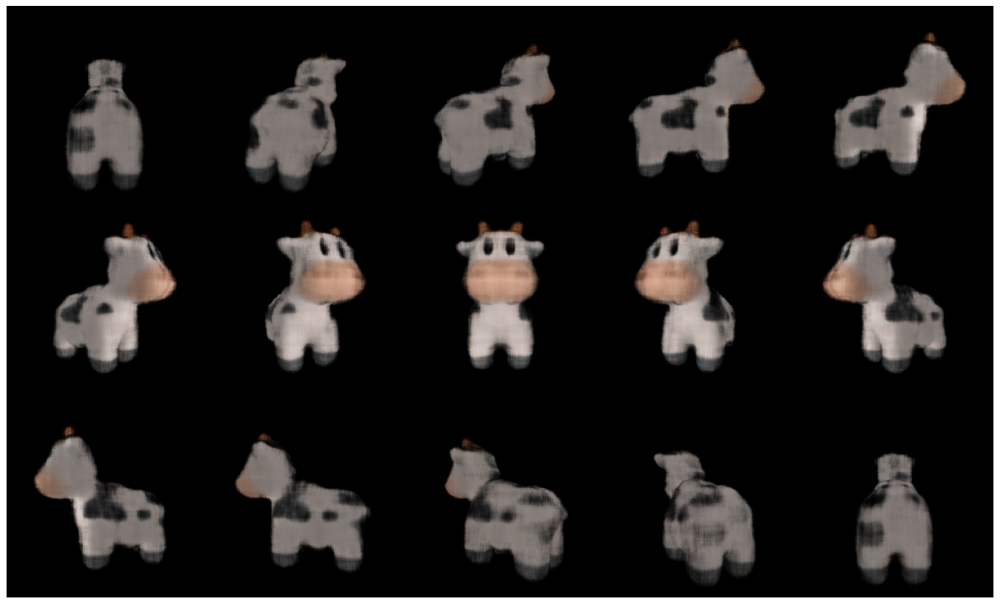

In [ ]:
def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exp_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCMultinomialRaysampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    return torch.cat(frames)

with torch.no_grad():
    rotating_nerf_frames = generate_rotating_nerf(neural_radiance_field, n_frames=3*5)

image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Assuming the following lists are populated from the training process
# These should be the lists you created to store training metrics at each iteration
metrics_data = {
    "loss_color": loss_history_color,
    "loss_silhouette": loss_history_sil,
    "psnr_train": psnr_history,
    "ssim_train": ssim_history,
    "lpips_train": lpips_history,
    "psnr_val": val_psnr_history,
    "ssim_val": val_ssim_history,
    "lpips_val": val_lpips_history,
    "time_per_iteration": time_history,
     "memory_usage": memory_usage_history,
}

# Calculate summary statistics
summary_stats = {
    "Metric": ["Color Loss", "Silhouette Loss", "PSNR", "SSIM", "LPIPS", "Render Time", "Memory Usage"],
    "Training (Average ± STD)": [
        f"{np.mean(metrics_data['loss_color']):.2e} ± {np.std(metrics_data['loss_color']):.2e}",
        f"{np.mean(metrics_data['loss_silhouette']):.2e} ± {np.std(metrics_data['loss_silhouette']):.2e}",
        f"{np.mean(metrics_data['psnr_train']):.2f} ± {np.std(metrics_data['psnr_train']):.2f}",
        f"{np.mean(metrics_data['ssim_train']):.2f} ± {np.std(metrics_data['ssim_train']):.2f}",
        f"{np.mean(metrics_data['lpips_train']):.4f} ± {np.std(metrics_data['lpips_train']):.4f}",
        f"{np.mean(metrics_data['time_per_iteration']):.2f} s ± {np.std(metrics_data['time_per_iteration']):.2f} s",
        f"{np.mean(metrics_data['memory_usage']):.2f} MB ± {np.std(metrics_data['memory_usage']):.2f} MB"
    ],
    "Validation (Average ± STD)": [
        "-",
        "-",
        f"{np.mean(metrics_data['psnr_val']):.2f} ± {np.std(metrics_data['psnr_val']):.2f}",
        f"{np.mean(metrics_data['ssim_val']):.2f} ± {np.std(metrics_data['ssim_val']):.2f}",
        f"{np.mean(metrics_data['lpips_val']):.4f} ± {np.std(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time is only for training
        "-",  # Memory Usage is only for training
    ],
    "Best Training": [
        f"{np.min(metrics_data['loss_color']):.2e}",
        f"{np.min(metrics_data['loss_silhouette']):.2e}",
        f"{np.max(metrics_data['psnr_train']):.2f}",
        f"{np.max(metrics_data['ssim_train']):.2f}",
        f"{np.min(metrics_data['lpips_train']):.4f}",
        f"{np.min(metrics_data['time_per_iteration']):.2f} s",
        f"{np.min(metrics_data['memory_usage']):.2f} MB"
    ],
    "Best Validation": [
        "-",
        "-",
        f"{np.max(metrics_data['psnr_val']):.2f}",
        f"{np.max(metrics_data['ssim_val']):.2f}",
        f"{np.min(metrics_data['lpips_val']):.4f}",
        "-",  # Render Time not applicable for validation
        "-"   # Memory Usage not applicable for validation
    ]
}

# Convert summary to a DataFrame for better presentation
summary_df = pd.DataFrame(summary_stats)
print(summary_df)


            Metric Training (Average ± STD) Validation (Average ± STD)  \
0       Color Loss      1.07e-02 ± 1.00e-02                          -   
1  Silhouette Loss      1.56e-02 ± 2.78e-02                          -   
2             PSNR             25.19 ± 2.86               22.40 ± 1.76   
3             SSIM              0.93 ± 0.11                0.81 ± 0.05   
4            LPIPS          0.2327 ± 0.0590            0.2447 ± 0.0425   
5      Render Time          0.08 s ± 0.01 s                          -   
6     Memory Usage    7022.40 MB ± 66.45 MB                          -   

  Best Training Best Validation  
0      3.74e-03               -  
1      3.53e-03               -  
2         29.60           25.09  
3          0.98            0.86  
4        0.1404          0.1927  
5        0.04 s               -  
6    7021.02 MB               -  


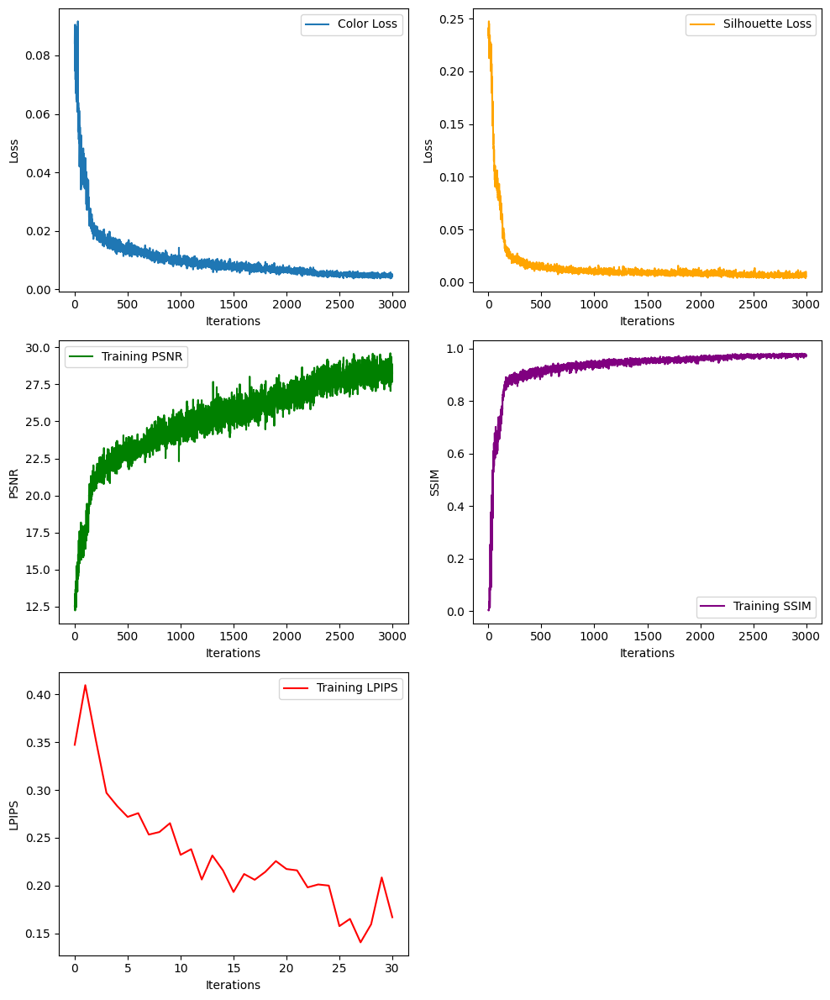

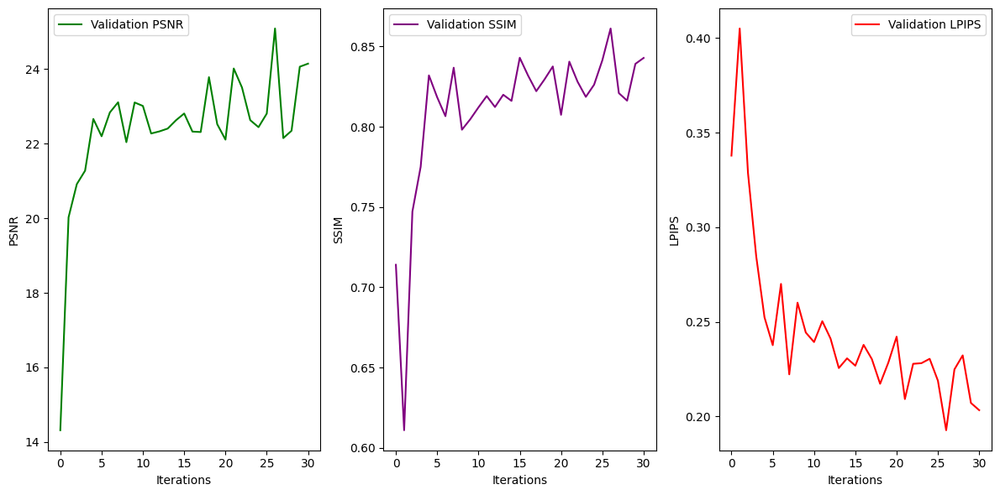

In [ ]:
import matplotlib.pyplot as plt

# Set up figure with multiple subplots for training metrics
fig, axs = plt.subplots(3, 2, figsize=(10, 12))

# Plot Color Loss over Iterations
axs[0, 0].plot(metrics_data['loss_color'], label='Color Loss')
axs[0, 0].set_xlabel("Iterations")
axs[0, 0].set_ylabel("Loss")
#axs[0, 0].set_title("Color Loss")
axs[0, 0].legend()

# Plot Silhouette Loss over Iterations
axs[0, 1].plot(metrics_data['loss_silhouette'], label='Silhouette Loss', color='orange')
axs[0, 1].set_xlabel("Iterations")
axs[0, 1].set_ylabel("Loss")
#axs[0, 1].set_title("Silhouette Loss")
axs[0, 1].legend()

# Plot PSNR for Training over Iterations
axs[1, 0].plot(metrics_data['psnr_train'], label='Training PSNR', color='green')
axs[1, 0].set_xlabel("Iterations")
axs[1, 0].set_ylabel("PSNR")
#axs[1, 0].set_title("Training PSNR")
axs[1, 0].legend()

# Plot SSIM for Training over Iterations
axs[1, 1].plot(metrics_data['ssim_train'], label='Training SSIM', color='purple')
axs[1, 1].set_xlabel("Iterations")
axs[1, 1].set_ylabel("SSIM")
#axs[1, 1].set_title("Training SSIM")
axs[1, 1].legend()

# Plot LPIPS for Training over Iterations
axs[2, 0].plot(metrics_data['lpips_train'], label='Training LPIPS', color='red')
axs[2, 0].set_xlabel("Iterations")
axs[2, 0].set_ylabel("LPIPS")
#axs[2, 0].set_title("Training LPIPS")
axs[2, 0].legend()
axs[2, 1].axis('off')  # Turn off the last unused subplot in the training section

# Adjust layout for training metrics
plt.tight_layout()

# Set up figure for validation metrics in separate plot with reduced width
fig, val_axs = plt.subplots(1, 3, figsize=(12, 6))

# Plot PSNR for Validation over Iterations
val_axs[0].plot(metrics_data['psnr_val'], label='Validation PSNR', color='green')
val_axs[0].set_xlabel("Iterations")
val_axs[0].set_ylabel("PSNR")
#val_axs[0].set_title("Validation PSNR")
val_axs[0].legend()

# Plot SSIM for Validation over Iterations
val_axs[1].plot(metrics_data['ssim_val'], label='Validation SSIM', color='purple')
val_axs[1].set_xlabel("Iterations")
val_axs[1].set_ylabel("SSIM")
#val_axs[1].set_title("Validation SSIM")
val_axs[1].legend()

# Plot LPIPS for Validation over Iterations
val_axs[2].plot(metrics_data['lpips_val'], label='Validation LPIPS', color='red')
val_axs[2].set_xlabel("Iterations")
val_axs[2].set_ylabel("LPIPS")
#val_axs[2].set_title("Validation LPIPS")
val_axs[2].legend()

# Adjust layout for validation metrics
plt.tight_layout()
plt.show()
